# Tutorial
Welcome to the first version of the coherent spatial analysis pipeline (SAP). If you encounter any issues feel free to reach out to ous any time! Furthermore, this is an early preview and not everything runs perfectly. This is why we need your feedback to improve functionality as well as usability of the SAP. 

# 1) Setup environment 
This section imports the required packages and contains user input which should be reviewed every time the pipeline is used.

Import the standard libraries that will be needed during the analysis. These libraries provide basic functionality like filepath or df handling.

In [7]:
#import standard packages
import os
import pandas as pd
import sys
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

INFO:numexpr.utils:Note: NumExpr detected 12 cores but "NUMEXPR_MAX_THREADS" not set, so enforcing safe limit of 8.
INFO:numexpr.utils:NumExpr defaulting to 8 threads.


### load custom functions

All custom functions should be available in default directories in the Docker image. The following line of code is only needed if you want to load these functions form any other path. 

In [8]:
sys.path.append('/Users/timnoahkempchen/Desktop/SAP2/Docker/Container_new') # This code is only needed if you want to load functions from a non-default directory

Load files from default directory or specified file path.

In [10]:
from SAP_helperfunctions_hf import * # Helper functions - used by other functions to execute steps like table formatting etc. KEY: hf
from SAP_preprocessing_pp import * # Preprocessing functions - to normalize and prepare data for further analysis KEY: pp
from SAP_tools_tl import * # tools - perform calculation on the data KEY: tl
from SAP_plot_pl import * # plotting functions - used to visualize results KEY: pl
#from general import *
#from preprocessing import *

### Session Info

This part ensures reproducibility by listing all package versions as
well as the python version and the OS used to run the code.

In [11]:
import session_info
session_info.show() # print an overview of all installed libraries and the OS version 

## 1.1) Filepaths

Specify 1) the path of you segmentation output and 2) a path to store all output. Skip to the **Step 3** if your dataset is already normalized. 

In [5]:
data_dir = "/Users/yuqitan/Nolan Lab Dropbox/Yuqi Tan/Collaborations/Hendrik/processed_data/14_05_23_Breast_70066_risk/Scan1/CVcol_2023_01_09_DAPI_3px/fcs/"
output_dir = "/Users/yuqitan/Nolan Lab Dropbox/Yuqi Tan/Collaborations/Hendrik/processed_data/14_05_23_Breast_70066_risk/"

if not os.path.exists(output_dir): # check if output path exist - if not generate the path
    os.makedirs(output_dir)

# 2) Preprocessing

## 2.1) Load data

0.9995931795670016


(56513, 54)

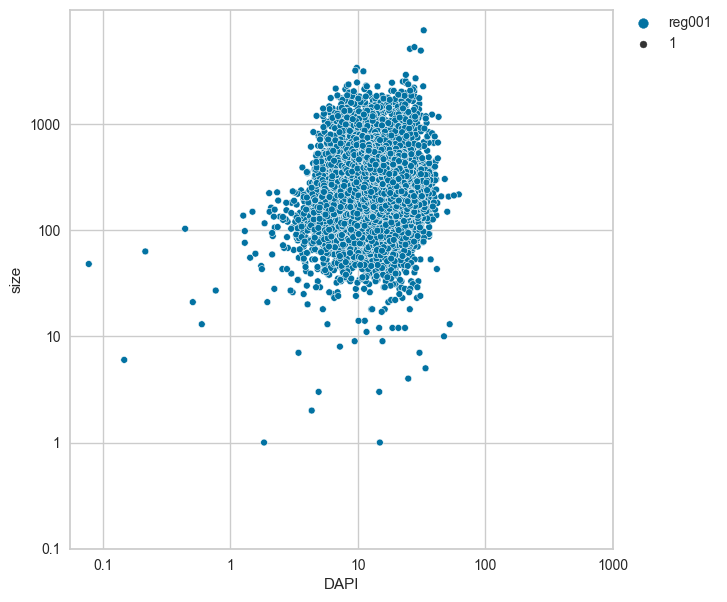

In [6]:
# this is loading the segmentation output 
df = pp_read_data(path=data_dir + 'compensated/',\
               reg_list=[], nuc_1 = 1) #this is only useful when there are multiple regions. it also helps to format the heading
df.shape # this tells you the dimension of your data

In [7]:
df.head()

,first_index,cell_id,region,tile_num,x,y,z,x_tile,y_tile,size,...,panCK,CD57,CD68,GATA-3,CD56,CD20,IDO-I,PDGFRb,ICOS,region_num
0,0,1.0,1.0,1.0,17212.0,10186.0,1.0,17212.0,10186.0,136.0,...,2.131729,1.086062,2.742818,1.353894,2.362003,0.734824,2.238577,1.584169,1.944884,reg001
1,1,2.0,1.0,1.0,27744.0,6633.0,1.0,27744.0,6633.0,766.0,...,4.018160,1.528462,4.271843,0.768334,3.463688,1.191816,2.688630,2.745348,2.601314,reg001
2,2,3.0,1.0,1.0,19704.0,7106.0,1.0,19704.0,7106.0,314.0,...,1.799051,1.823900,2.768554,1.409855,2.077540,1.021602,1.943768,1.404477,1.605470,reg001
3,3,4.0,1.0,1.0,20154.0,6800.0,1.0,20154.0,6800.0,12.0,...,1.173398,0.000000,0.722883,0.000000,0.640470,0.464097,0.848396,0.903237,0.691539,reg001
4,4,5.0,1.0,1.0,17000.0,9522.0,1.0,17000.0,9522.0,105.0,...,2.008608,6.922569,3.315366,4.982450,3.569917,7.377134,2.300648,8.692806,5.000881,reg001


## 2.2) Z normalization

In [8]:
# This is to normalize the data 
dfz = pp_format(data=df, 
                list_out=['first_index', 'cell_id','tile_num','z', 'x_tile','y_tile', 'size','DAPI'],
                list_keep = ['region','x','y','region_num',],
                method = "zscore")

reg001


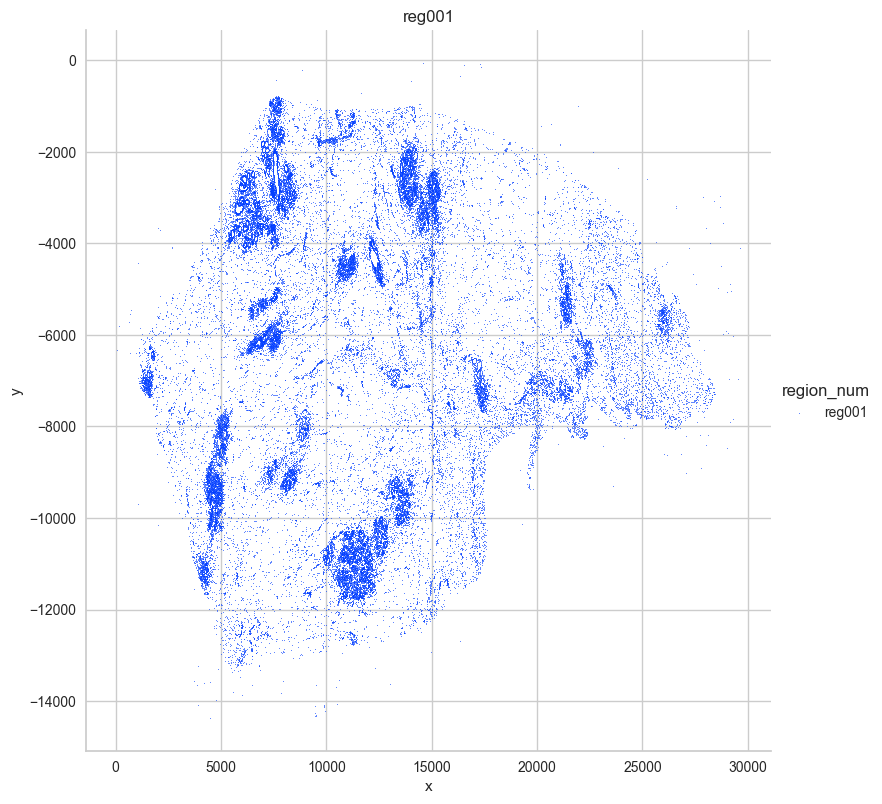

In [9]:
#examine unique region per tissue to decide whether or not we need x y correction
pl_catplot(dfz,X = 'x',Y='y',
           exp = 'region_num', hue = 'region_num',invert_y=True,size = 1,figsize=8)

In [ ]:
# (Optional) XY corrrection for CODEX data from non-fusion machine
# since this data is generated from fusion and has one tissue per slide
# the xy correction is not nesssary 
# df_cor = pp_xycorr(data=dfz_56, y_rows=2, x_columns=1, X_pix=13000, Y_pix=11000)

## 2.3) Noise removal

In [10]:
dfz.columns

Index(['FoxP3', 'CD38', 'PD1', 'CD206', 'aSMA', 'bCatenin', 'PD-L1',
       'Ecadherin', 'CD34', 'BCL-2', 'GranzymeB', 'Podoplanin', 'CD8', 'Ki67',
       'Vimentin', 'CD163', 'CollagenI', 'CD45', 'p53', 'CD15', 'CD31',
       'pH2A.X', 'Tbet', 'CD3', 'HLA-DR', 'CD4', 'CD73', 'MHC-I', 'CD138',
       'MMP9', 'CD11c', 'EGFR', 'CD11b', 'panCK', 'CD57', 'CD68', 'GATA-3',
       'CD56', 'CD20', 'IDO-I', 'PDGFRb', 'ICOS', 'region', 'x', 'y',
       'region_num'],
      dtype='object')

In [12]:
# get the column index for the last antibody 
dfz.columns.get_loc('ICOS')

41

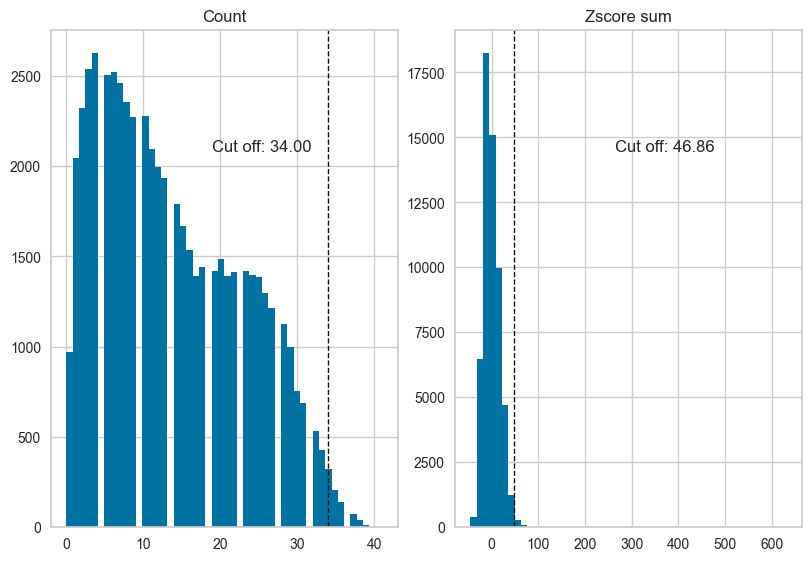

In [22]:
# This function helps to figure out what the cut-off should be
# This is to remove top 1 % of all cells that are highly expressive for all antibodies
pl_zcount_thres(dfz = dfz, 
                col_num = 41, # last antibody index
                cut_off=0.01, #top 1% of cells
                count_bin=50) 

In [19]:
df_nn,cc = pp_remove_noise(df=dfz, 
                           col_num=41, # this is the column index that has the last protein feature
                           z_sum_thres=47, # number obtained from the function above
                           z_count_thres=34 # number obtained from the function above
                          )

0.9950807778741174 percent of cells are removed.


### 2.3.1) save denoised dataframe

In [ ]:
df_nn.to_csv(output_dir + "df_nn_NBT_230223_NBT_70129.csv")

# 3) Clustering  

In [23]:
# inspect which markers work, and drop the ones that did not work from the clustering step
# make an anndata to be compatiable with the downstream clustering step
adata = hf_makeAnndata(df_nn = df_nn,
                       col_sum = 41, # this is the column index that has the last protein feature
                       nonFuncAb_list = ['GranzymeB', 'Tbet','PD-L1', 'PD1', 'IDO-I', 'ICOS'] # remove the antibodies that are not working
                      )
adata

AnnData object with n_obs × n_vars = 56235 × 36
    obs: 'region', 'x', 'y', 'region_num'

In [25]:
# no need to reassign the adata
tl_clustering(adata, 
              clustering='leiden', # can choose louvian
              n_neighbors=10,
              res = 1,
              reclustering = False # if true, no computing the neighbors
             ) 
adata

Computing neighbors and UMAP
Clustering


AnnData object with n_obs × n_vars = 56235 × 36
    obs: 'region', 'x', 'y', 'region_num', 'leiden_1'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

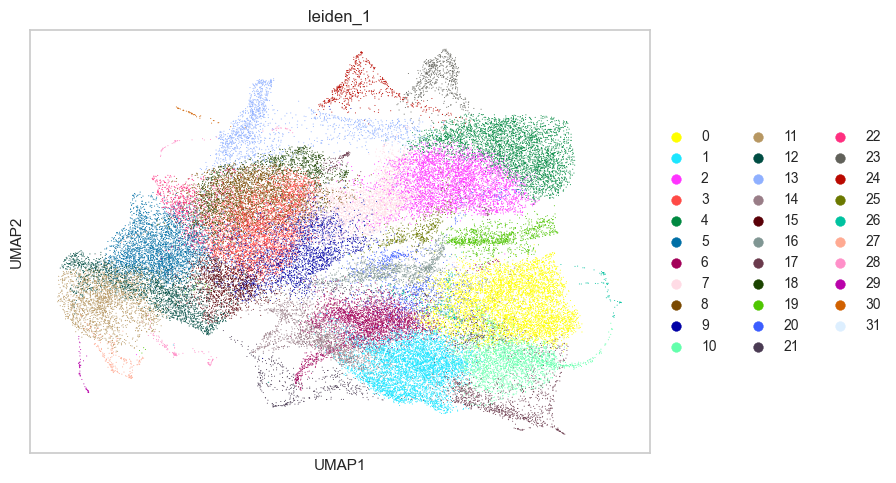

In [26]:
# visualization of clustering with UMAP
sc.pl.umap(adata, color = 'leiden_1') 

Clustering


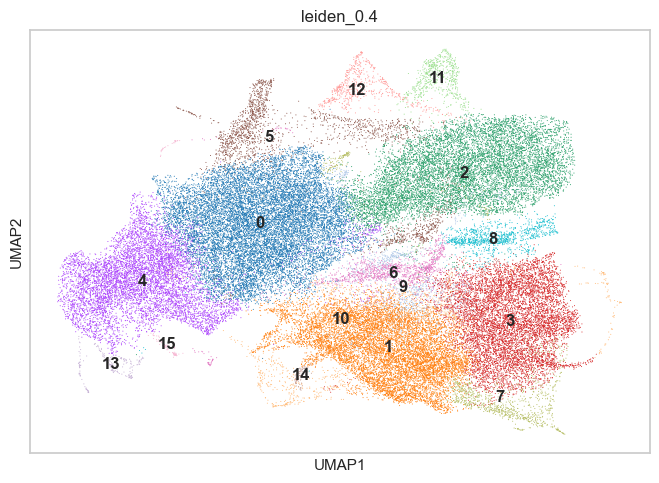

In [27]:
#reclustering with different resolution
tl_clustering(adata, 
              clustering='leiden', # can choose Louvain
              n_neighbors=10,
              res = 0.4,
              reclustering = True # if true, no recomputing the neighbors
             )
sc.pl.umap(adata, color = 'leiden_0.4', legend_loc="on data")

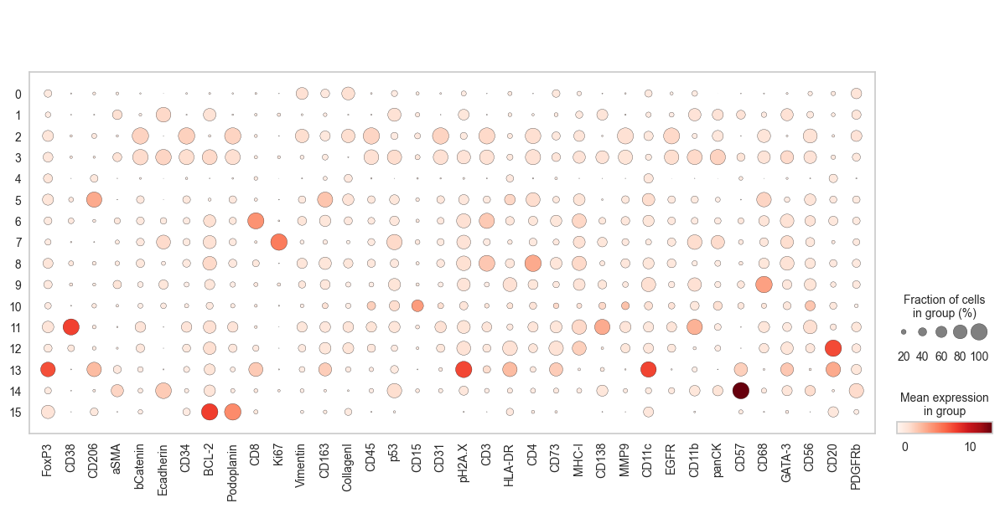

In [28]:
#look at the marker gene expression
sc.pl.dotplot(adata, adata.var.index.to_list(), 'leiden_0.4')

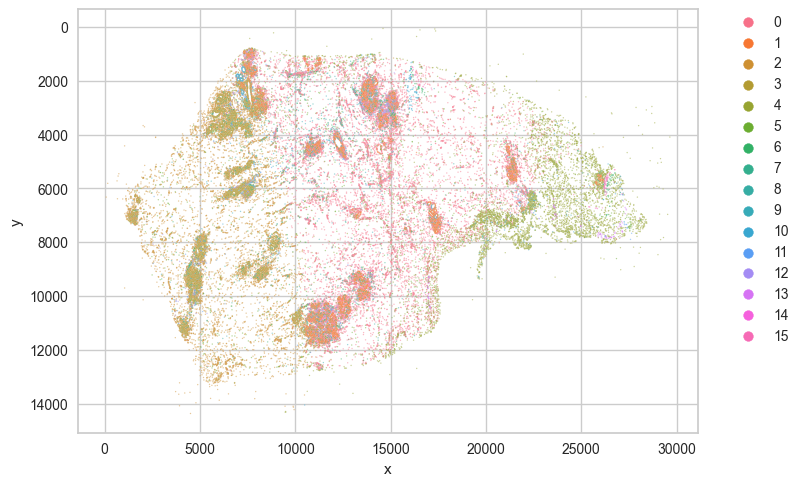

In [29]:
# Plot data using its original spatial coordinates
df_nn['leiden_0.4'] = adata.obs['leiden_0.4']
ax = sns.scatterplot(x='x', y='y', data=df_nn, hue='leiden_0.4', s=1, alpha=0.5)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)
ax.invert_yaxis()

### 2.4.1) Coarse cell type attribution

In [30]:
old_to_new = {
    '0': 'Epithelial',
    '1': 'Stromal/blood vessels',
    '2': 'Stroma', 
    '3': 'Blood vessels',
    '4': 'Proliferating stroma',
    '5': 'M2 macrophage',
    '6': 'Early exhausted CD8 T cells',
    '7': "Overexposed junk",
    '8': 'monocyte/macrophage?',
    '9': 'Plasma cells',
    '10': 'Lymphatics',
    '11': 'Treg',
    '12': 'CD4+ (memory) T cells',
    '13': "DC",
    '14': 'Epithelial',
    '15': 'Neutrophil'
}
adata.obs['celltype'] = (
    adata.obs['leiden_0.4']
    .map(old_to_new)
    .astype('category')
)

In [45]:
df_nn['celltype'] = adata.obs['celltype'].values

reg001


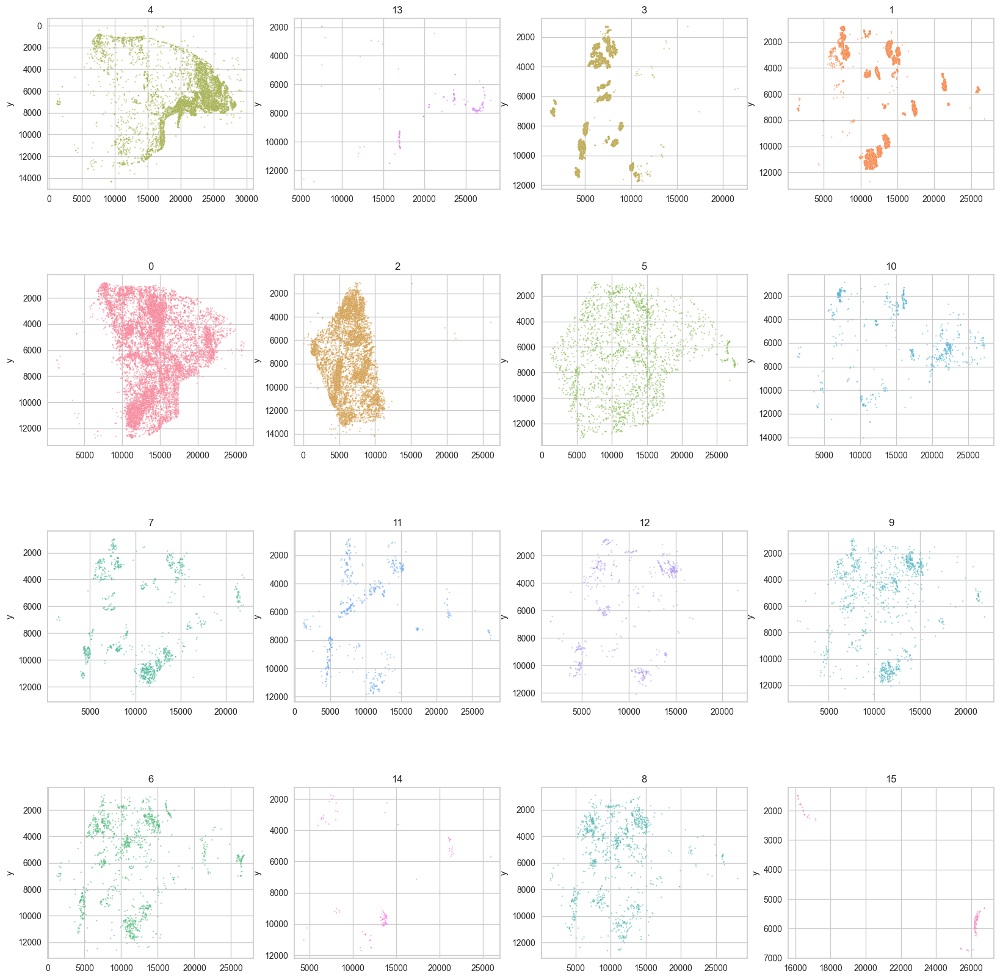

In [39]:
pl_mono_cluster_spatial(df=df_nn, sample_col='region_num', cluster_col='leiden_0.4', figsize=(20, 20))

### 2.4.2) Subclustering try1

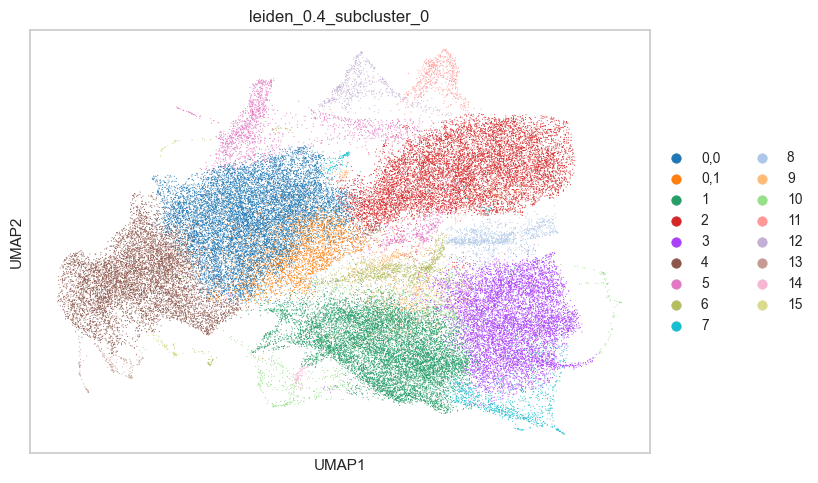

In [41]:
# subclustering cluster 0
sc.tl.leiden(adata, restrict_to=('leiden_0.4',['0']), resolution=0.13, key_added='leiden_0.4_subcluster_0')
sc.pl.umap(adata, color = 'leiden_0.4_subcluster_0')

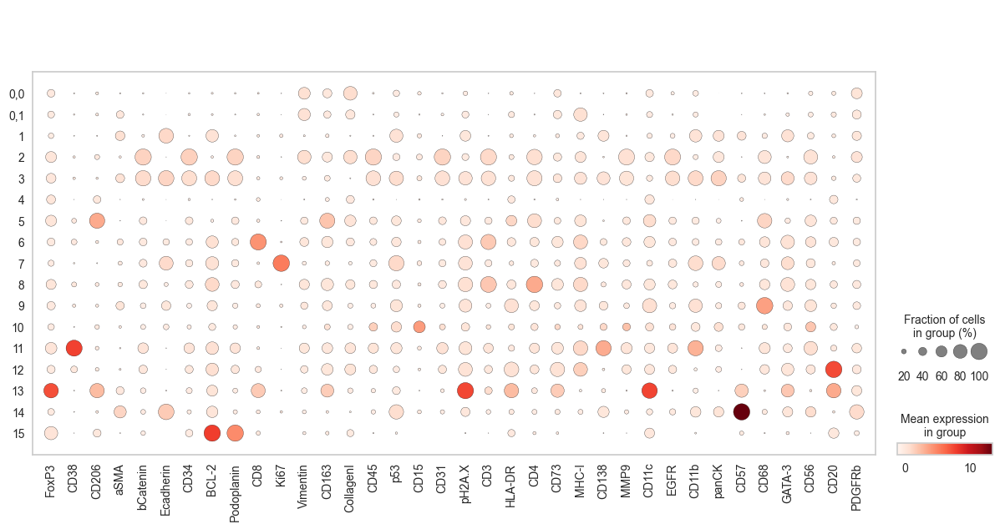

In [43]:
sc.pl.dotplot(adata, adata.var.index.to_list(), 'leiden_0.4_subcluster_0')

### 2.4.3) save anndata

In [ ]:
adata.write(output_dir+"NBT_230223_70129_adata.h5ad")

Load output from preprocessing or already preprocessed data frame 

## Reading the data
The input data frame has to fulfill some minimal requirements:
Data must be stored as pandas df (every row represents a cell, every column a feature)

1.  The df must contain a **Sample ID** for every cell
2.  The df must contain one column each for **x** and **y** coordinates
3.  The df must contain one column specifying the **Cell Type** - if no cell types were assigned cluster IDs might be a replacement
4.  The df must contain one column indicating the **Unique Region** in
    which the cell was recorded 
5.  The df should contain one column with an experimental condition or
    other type of **comparison** - examples are "Treatment", "Disease_stage"

-> see read me for example

In [6]:
# specify file path to preprocessed data. If you use the SAP preprocessing module you can indicate the output of that module 

#loading data from file
df = pd.read_csv(output_dir + "df_nn_NBT_230223_NBT_70129.csv")

# or 

df = df_nn

In [14]:
df = pd.read_csv("/Volumes/homes/admin/Tim/Fragmentation_analysis_pub/Data/HuBMAP_gut/CODEX_HuBMAP_alldata_Dryad.csv")

Get an overview - show column names as well as a preview of the dataframe.  

In [15]:
print(df.columns) # print all column names (features)
df.head() # show first five rows

Index(['Unnamed: 0', 'MUC2', 'SOX9', 'MUC1', 'CD31', 'Synapto', 'CD49f',
       'CD15', 'CHGA', 'CDX2', 'ITLN1', 'CD4', 'CD127', 'Vimentin', 'HLADR',
       'CD8', 'CD11c', 'CD44', 'CD16', 'BCL2', 'CD3', 'CD123', 'CD38', 'CD90',
       'aSMA', 'CD21', 'NKG2D', 'CD66', 'CD57', 'CD206', 'CD68', 'CD34',
       'aDef5', 'CD7', 'CD36', 'CD138', 'CD45RO', 'Cytokeratin', 'CD117',
       'CD19', 'Podoplanin', 'CD45', 'CD56', 'CD69', 'Ki67', 'CD49a', 'CD163',
       'CD161', 'x', 'y', 'array', 'Xcorr', 'Ycorr', 'Tissue_location',
       'tissue', 'donor', 'unique_region', 'region', 'OLFM4', 'FAP', 'CD25',
       'CollIV', 'CK7', 'MUC6', 'Cell Type', 'Cell Type em', 'Cell subtype',
       'Neighborhood', 'Neigh_sub', 'Neighborhood_Ind', 'NeighInd_sub',
       'Community', 'Major Community', 'Tissue Segment'],
      dtype='object')


,Unnamed: 0,MUC2,SOX9,MUC1,CD31,Synapto,CD49f,CD15,CHGA,CDX2,...,Cell Type,Cell Type em,Cell subtype,Neighborhood,Neigh_sub,Neighborhood_Ind,NeighInd_sub,Community,Major Community,Tissue Segment
0,0,-0.303994,-0.163727,-0.587608,-0.212903,0.164173,-0.664863,0.049305,0.003616,-0.377532,...,NK,NK,Immune,Mature Epithelial,Epithelial,Mature Epithelial,Epithelial,Plasma Cell Enriched,Immune,Mucosa
1,1,-0.301927,-0.491706,-0.500804,-0.243205,-0.142568,-0.664861,-0.182627,-0.117573,-0.182754,...,NK,NK,Immune,Transit Amplifying Zone,Epithelial,Mature Epithelial,Epithelial,Mature Epithelial,Epithelial,Mucosa
2,2,-0.302206,-0.547234,-0.510705,-0.235309,-0.217185,-0.622758,-0.296486,-0.091504,-0.268055,...,NK,NK,Immune,Innate Immune Enriched,Immune,Innate Immune Enriched,Immune,Innate Immune Enriched,Immune,Mucosa
3,3,-0.304219,-0.613068,-0.584499,-0.243757,-0.266696,-0.658449,-0.299027,-0.121460,-0.345381,...,NK,NK,Immune,Stroma & Innate Immune,Stromal,Stroma & Innate Immune,Stromal,Stroma,Stroma,Subucosa
4,4,-0.294644,-0.615593,-0.570580,-0.247548,-0.042246,-0.642230,-0.299031,-0.121458,-0.377533,...,NK,NK,Immune,Outer Follicle,Immune,Outer Follicle,Immune,Follicle,Immune,Mucosa


If not already in the data frame: provide some kind of unique identifier for each recorded region (combine sample and region number)

In [13]:
#df["unique_region"] = df['Sample'] + "_" + df['region_num'] # only necessary if multiple regions per sample were recorded 

# 4) Generate basic visualization

### 4.1) Color dictionary generator
Most of the visualizations require a color dictionary to keep cell colors consistent. The dictionary can be either generated manually or with a random color pallet. The function hf_assign_colors helps to assign colors to the selected column and visualizes the used pallet with assigned labels. 

Original key list is : ['Proliferating stroma', 'DC', 'Blood vessels', 'Stromal/blood vessels', 'Epithelial', ..., 'CD4+ (memory) T cells', 'Plasma cells', 'Early exhausted CD8 T cells', 'monocyte/macrophage?', 'Neutrophil']
Length: 15
Categories (15, object): ['Blood vessels', 'CD4+ (memory) T cells', 'DC', 'Early exhausted CD8 T cells', ..., 'Stroma', 'Stromal/blood vessels', 'Treg', 'monocyte/macrophage?']
Original value list is : ['#E6E0ED', '#6690F8', '#B208BA', '#A1140D', '#637885', '#03745E', '#2B6435', '#24E11C', '#73A98C', '#260094', '#4AEDE9', '#25CDA8', '#6B3639', '#C20D1B', '#56FEC2']
Resultant dictionary is : {'Proliferating stroma': '#E6E0ED', 'DC': '#6690F8', 'Blood vessels': '#B208BA', 'Stromal/blood vessels': '#A1140D', 'Epithelial': '#637885', 'Stroma': '#03745E', 'M2 macrophage': '#2B6435', 'Lymphatics': '#24E11C', 'Overexposed junk': '#73A98C', 'Treg': '#260094', 'CD4+ (memory) T cells': '#4AEDE9', 'Plasma cells': '#25CDA8', 'Early exhausted CD8 T cells': '#6B3639',

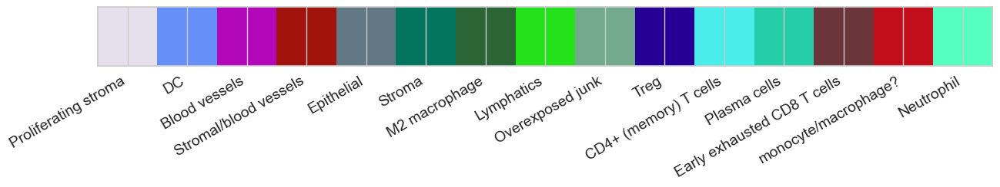

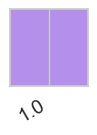

In [48]:
# provide a list with names colors are mapped on (usually cell types, categories or neighborhoods)
cell_names = df["Cell Type"].unique()
Sample_names = df["region"].unique()

# provide a list of colors (same length as names list) or generate a random collection of colors
cell_colors = hf_generate_random_colors(n = len(cell_names))
Sample_colors = hf_generate_random_colors(n = len(Sample_names))

# combine both lists into a dictionary 
color_dic_cells = hf_assign_colors(cell_names, cell_colors)
color_dic_Sample = hf_assign_colors(Sample_names, Sample_colors)

### 4.2) Visualize Cell type composition

#### Stacked Bargraph

**How does the function work:**

This function generates a stacked bar plot of a given
df. The function takes in several arguments including the data,
column names for categorical variables, a grouping variable, a list of
cells to plot, a directory to save the plot, and various plot
customization options.

The function starts by checking if the data needs to be normalized to the individual group based
on a boolean parameter "norm". If "norm" is True, the percentage of
each cell type in the dataset is calculated based on the given grouping
variable. If "norm" is False, the percentage is calculated across the
entire dataset.

The function then pivots the resulting frequency table to create a tidy
df that can be used to generate the stacked bar plot. The
function allows for customization of the order of columns and rows in
the plot, as well as the color palette used.

Finally, the function generates the plot using the matplotlib library
and saves it to a file if a save_name argument is provided. The function
returns the resulting pivoted df and the column order for the
plot.

**What is the biological meaning of this analysis:**

The analysis shows a stacked bargraph for each specified group. Sections
within the graph represent the percentage of cells that is present in
this group. The user can choose to group data by different categorical
variables (e.g. a clinical condition, a treatment). Percentages can be
calculated for broader groups (e.g. what is the percentage of immune cells in sample X?)
or single cell types (e.g. what is the percentage of CD4+ T cells in sample X?).

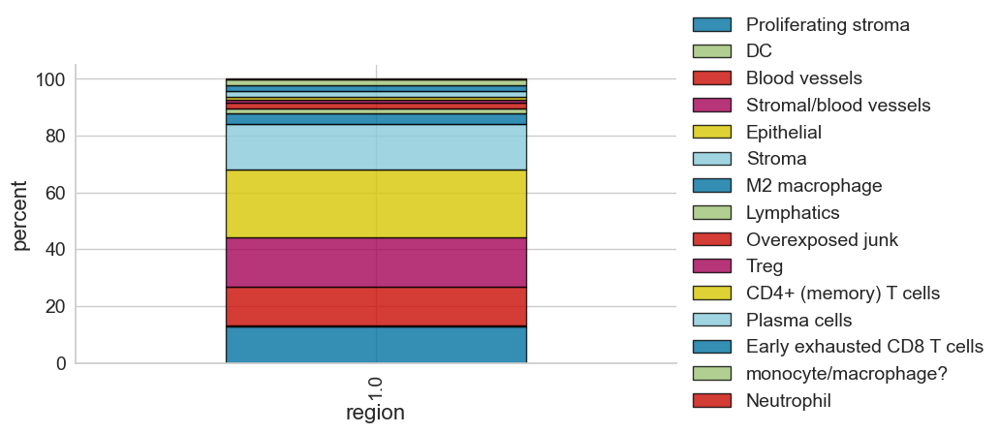

In [49]:
####### Stacked Bar Plot
# Shows percentage of category per group. For example: major cell types per diagnosis 
ab = pl_stacked_bar_plot(data = df, # data frame to use 
                      per_cat = "Cell Type", # column containing the categories that are used to fill the bar plot
                      grouping = "region", # column containing a grouping variable (usually a condition or cell group)
                      output_dir = output_dir, 
                      sub_col = None, 
                      cell_list = df["celltype"].unique(),  # list of cell types to plot 
                      norm = False, # logical value to decide if normalization per group is performed 
                      fig_sizing = (8,4), # numeric value to modify the figure size 
                      name_cat = "celltype", 
                      col_order = None, # plotting order 
                      save_name = 'Percentage_cell_type_per_sample', # name for saved file 
                      color_dic = None # color dictionary 
                        ) 

#### Swarm plot

**How does the function work:**

The swarm_box function takes in several parameters and returns a plot
object. The purpose of this function is to create a box plot and swarm
plot from the given data.

The function first checks if norm is True. If it is True, it subsets the
data and computes the unique values of a given category column to get
the percentage of cell type. If norm is False, it copies the entire
data. The function then casts the category column to categorical type.

Next, the function computes the percentage of each category column by
group and replicate. It converts column names to string type and resets
the index. The function adds grouping and replicate to immune_list and
subsets the data. It then melts the data frame and renames columns.

If col_in is not None, the function subsets melt_per_plot to include
only those values. Otherwise, it does nothing. The function then orders
the data by the average percentage of each category column.

If h_order is None, the function uses the unique values of the grouping
column as the order. If color_dic is None, the function creates a figure
with box plot and swarm plot for each category column or grouping column
based on flip value.

If flip is True, the function creates a box plot with given parameters
and a swarm plot with given parameters for grouping column. The function
sets the transparency of box plot patches. If save_name is not None, the
function saves the figure as a PNG file with given parameters.

In summary, the swarm_box function creates a box plot and swarm plot
from the given data and returns a plot object. It has several parameters
that allow for customization of the plot.

**What is the biological meaning of this analysis:**

In [50]:
print(df["celltype"].unique())

['Proliferating stroma', 'DC', 'Blood vessels', 'Stromal/blood vessels', 'Epithelial', ..., 'CD4+ (memory) T cells', 'Plasma cells', 'Early exhausted CD8 T cells', 'monocyte/macrophage?', 'Neutrophil']
Length: 15
Categories (15, object): ['Blood vessels', 'CD4+ (memory) T cells', 'DC', 'Early exhausted CD8 T cells', ..., 'Stroma', 'Stromal/blood vessels', 'Treg', 'monocyte/macrophage?']


Original key list is : ['Innate Immune' 'Adaptive Immune' 'Stroma' 'Tumor']
Original value list is : ['#32384C', '#A41FEC', '#6EBEF7', '#3F9FAB']
Resultant dictionary is : {'Innate Immune': '#32384C', 'Adaptive Immune': '#A41FEC', 'Stroma': '#6EBEF7', 'Tumor': '#3F9FAB'}


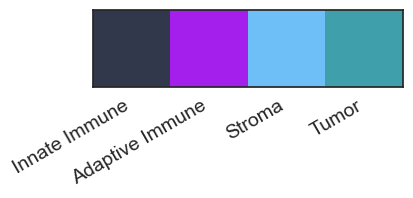

In [12]:
# provide a list with names colors are mapped on (usually cell types, categories or neighborhoods)
cellcat_names = df["Cell cat"].unique()

# provide a list of colors (same length as names list) or generate a random collection of colors
cellcat_colors = hf_generate_random_colors(n = len(cellcat_names))

# combine both lists into a dictionary 
color_dic_cellcats = hf_assign_colors(cellcat_names, cellcat_colors)

In [17]:
output_dir = "/Users/timnoahkempchen/Downloads"

In [26]:
# Arguments for swarm boxplot:

data = df # data frame to use 

grouping = 'Tissue Segment' # column containing a grouping variable (usually a condition or cell group)

replicate_column = "unique_region"

output_dir = output_dir

norm = False

per_cat = "Cell Type"

sub_col = 'Cell subtype'

sub_list = ['Epithelial','Immune','Mesenchymal']

fig_sizing=(8,4) # numeric value to modify the figure size 

save_name = 'Boxplot_cell_type_per_sample'

color_dic = None # color dictionary 

plot_order=None

flip=True

In [27]:
melt_per_plot = pl_swarm_box(data = data, 
                          grouping = grouping, 
                          replicate = replicate_column, 
                          sub_col = sub_col, 
                          sub_list = sub_list, 
                          per_cat = per_cat, 
                          norm=norm,
                          figure_sizing= fig_sizing, 
                          save_name=save_name, 
                          plot_order=plot_order, 
                          color_dic=color_dic, 
                          flip=flip,
                          output_dir = output_dir)

KeyboardInterrupt: 

#### Calculate and plot Shannon diversity of groups

**How does the function work:**

This Python function calculates the Shannon Diversity of cell types
within a sample and performs ANOVA analysis on the results. The function
takes in several parameters, including the input data (data), a list of
subgroups within the data (sub_l), a grouping variable (group_com), a
category variable (per_categ), a replicate variable (rep), a sub-column
variable (sub_column), and a coloring variable (coloring). Other
parameters include an output directory (output_dir), a normalization
option (normalize), a save option (save), an ordering variable
(ordering), and a figure size variable (fig_size).

First, the function calculates the Shannon Diversity using the
hf_per_only() function on the input data and the other parameters passed
to the function. It then aggregates the results by replicate and
grouping variable and calculates the Shannon Diversity. The results are
saved in a Pandas DataFrame (res) with the Shannon Diversity column
multiplied by -1.

Next, the function performs ANOVA analysis on the results using the
f_oneway() function from the scipy.stats module. The results are saved
in the test_results variable. If the test results are significant
(p-value \< 0.05), the function performs pairwise Tukey's HSD post-hoc
analysis using the pairwise_tukeyhsd() function from the
statsmodels.stats.multicomp module. The results are saved in a Pandas
DataFrame (table1) and plotted using a heatmap with the sns.heatmap()
function from the seaborn module.

Finally, the function plots the results using a swarmplot and boxplot
with the sns.swarmplot() and sns.boxplot() functions from the seaborn
module. The plot is customized with various parameters, including the
coloring variable, ordering variable, and fig_size variable. If the save
option is enabled, the plot is saved in the output directory. The
function returns three variables: the Shannon Diversity data (tt), the
ANOVA test results (test_results), and the Tukey's HSD results (table1).

**Further information on hf_per_only function:**

The hf_per_only function is a helper function that takes in a pandas
DataFrame data, and several other arguments including grouping,
replicate, sub_col, sub_list, per_cat, and norm.

The function first filters the DataFrame data based on the values in
sub_col column that are in sub_list, and then calculates the percentage
of each unique value in the per_cat column for the filtered DataFrame.

If norm is True, the function normalizes the percentage values by
dividing them by the total count of each unique value in the per_cat
column. Otherwise, it calculates the percentage without normalization.

The resulting DataFrame contains the grouping column, replicate column,
per_cat column, and a column specifying the percentage. The grouping and
replicate columns are specified by the arguments passed to the function,
and the per_cat column is the column containing the cell types or
categories of interest.

The melt_per_plot DataFrame returned by the function can be used for
plotting or further analysis. An example of the output would be the
percentage of CD4+ T cells in a unique region E08 assigned to community
xxx.

**What is the biological meaning of this analysis:**

The Shannon diversity function estimates the diversity within a given community. The figure shows the
Shannon Diversity Index for the specified groups as boxplot showing the
replicates as individual datapoints. Typical replicates are the unique
regions within the respective group.

A higher score indicates a higher degree of diversity within the
analyzed group. CAVE: rare cell types might be overrepresented in
statistical evaluation.

In [15]:
# Arguments for Shannon diversity plot:

data = df # input data frame 

grouping = 'treatment' # column containing a grouping variable (usually a condition or cell group)

sub_list = ['Immune Infiltrate' 'Productive T cell & Tumor' 'Proliferating Tumor'
 'Unproductive T cell & Tumor' 'Neutrophil Enriched' 'Resting Tumor'
 'Mixed Tumor']

rep = "unique_region"

per_categ = "Neighborhood common"

sub_column = 'Neighborhood common'

normalize = False

save = True # logical value to decide if the generated plot should be saved 

color_dic = color_dic_Sample # color dictionary 

fig_size = 8 # numeric value to modify the figure size 

plot_order = None # optional list to specify the plotting order

output_dir = output_dir # directory to save output

In [16]:
####### Swarm Boxplot of Shannon diversity score

# calculate shannon diversity 
tt, test_results, res  = tl_Shan_div(data = data, 
                                     sub_l = sub_list, 
                                     group_com = grouping, 
                                     per_categ = per_categ, 
                                     rep = rep, 
                                     sub_column = sub_column, 
                                     normalize = normalize) 

# plot results of shannon diversity function
pl_Shan_div(tt, 
            test_results, 
            res, 
            grouping = grouping, 
            color_dic = color_dic, 
            sub_list = sub_list, 
            output_dir = output_dir, 
            save=False, 
            plot_order=None, 
            fig_size=1.5)


UnboundLocalError: local variable 'treat' referenced before assignment

#### Perform and plot cell type correlation analysis 

**How does the function work:**

**corr_cell**

This function performs a correlation analysis on a dataset and plots the
results. The function takes several arguments:

-   data: the input data for the analysis
-   sub_l2: a list of subcategories for grouping the data
-   per_categ: the category for calculating the percentage
-   group2: a grouping variable for the analysis
-   repl: a variable for replicates
-   sub_column: the name of the column that contains subcategory data
-   cell: the cell type for the analysis
-   output_dir: the directory where the output plot will be saved
-   save_name: the name for the output plot
-   thres: the threshold for correlation analysis
-   normed: whether to normalize the data (default is True)
-   cell2: an optional second cell type for the analysis

The function first calls the hf_per_only function on the input data to
calculate the percentage based on the specified categories,
subcategories, and replicates. It then creates a pivot table from the
resulting data, calculates the correlation matrix, and subsets the
matrix based on the specified threshold and cell type.

The function then plots the correlation matrix using the cor_subplot
function and saves the plot to the specified directory with the
specified name. Finally, the function returns two sets of pairs: all
pairs and pairs for the specified cell type.

**cor_plot**

The cor_plot function takes in a Pandas DataFrame data, and several
parameters to create a heatmap and scatter plot of the correlation
matrix between the columns in the DataFrame. The function can take in
two grouping variables group1 and group2 and creates a heatmap of the
correlation matrix between the percentage of each variable in per_cat.
The sub_col parameter specifies the column to filter the data by the
values in sub_list. If norm is True, the percentage values are
normalized by the sum of the values in the column sub_col. If count is
True, the count of each variable is used instead of the percentage. If
plot_scatter is True, a scatter plot matrix is created with a regression
line for each pair of variables.

If group2 is not specified, the correlation matrix is created between
the percentage of each variable in per_cat for each unique value in
group1. If count is True, the count of each variable is used instead of
the percentage.

The function returns the correlation matrix cor_mat and the DataFrame
used to create the heatmap and scatter plot mp.

**cor_subplot**

The function cor_subplot takes three required arguments mp, sub_list,
and output_dir and one optional argument save_name.

The mp argument is a pandas DataFrame which contains data to be plotted
in a correlation subplot. sub_list is a list of column names of the mp
DataFrame for which the correlation matrix will be plotted. output_dir
is a string which specifies the output directory where the figure will
be saved.

The function first selects the columns specified in the sub_list
argument from the mp DataFrame and creates a pairwise scatterplot matrix
using Seaborn's pairplot function with kernel density estimates on the
diagonal and linear regression fits on the lower triangle. The
corner=True argument sets the diagonal axes to be drawn only once.

If save_name is not None, the function saves the figure to a file in the
specified output_dir with the name save_name+'\_corrplot.png'. The saved
figure is in PNG format with a DPI of 300 and transparent background.
The bbox_inches='tight' argument adjusts the figure size to remove any
whitespace padding.

**What is the biological meaning of this analysis:**

In [241]:
print(df["original cell type"].unique())

['Macrophage CD169+' 'CD4+ T cell' 'DC CD86+' 'DC' 'Epithelial'
 'Tumor Ki67+' 'Tumor PDL1+ MHCI+' 'Tumor' 'Lymphatic' 'Macrophage'
 'Neutrophil' 'NK' 'CD8+ T cell PD1+' 'CD8+ T cell' 'CD4+ Treg'
 'Endothelial' 'B cell']


In [17]:
# corr_cell
data = df # a pandas DataFrame object that contains the data to be analyzed

sub_list = None # a list of subject IDs to be included in the analysis

per_categ = "original cell type" # a string that represents the category column for the percentages in the data frame

rep = "unique_region" # a string that represents the replication column in the data frame

sub_column = "original cell type" # a string that represents the subject ID column in the data frame

normed = True

save = True

coloring = None

thres = 0.05

ordering = None

output_dir = output_dir

cell = "Tumor" # a string that represents the cell type to be analyzed
cell2 =  'CD8+ T cell PD1+'

sub_column = "original cell type"

group2 = 'treatment'

save_name = "cell1_cell2_cor"

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_plot_pl.py:1293: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cmat = cc.corr()
/Users/timnoahkempchen/opt/anaconda3/envs/tissuumaps_env/lib/python3.9/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


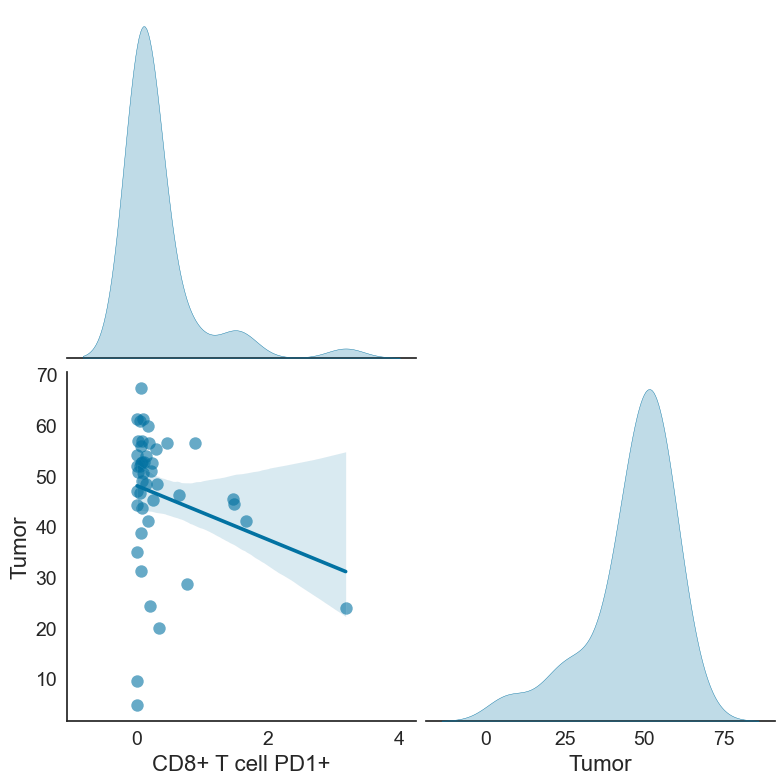

In [18]:
####### Correlation Analysis 

all_pair, sub_pair = pl_corr_cell(data = data, 
                               sub_list2 = sub_list, 
                               per_categ = per_categ, 
                               group2 = group2, 
                               rep = rep, 
                               sub_column = sub_column, 
                               cell = cell, 
                               normed = normed, 
                               thres = thres, 
                               cell2 = cell2,
                               output_dir = output_dir, 
                               save_name = save_name)

In [249]:
# cor_plot
group1 = 'treatment'

per_cat = 'original cell type'

sub_col = 'original cell type'

sub_list = None

norm = True

count = False

plot_scatter = False

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_plot_pl.py:1430: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  cor_mat = mp.corr()


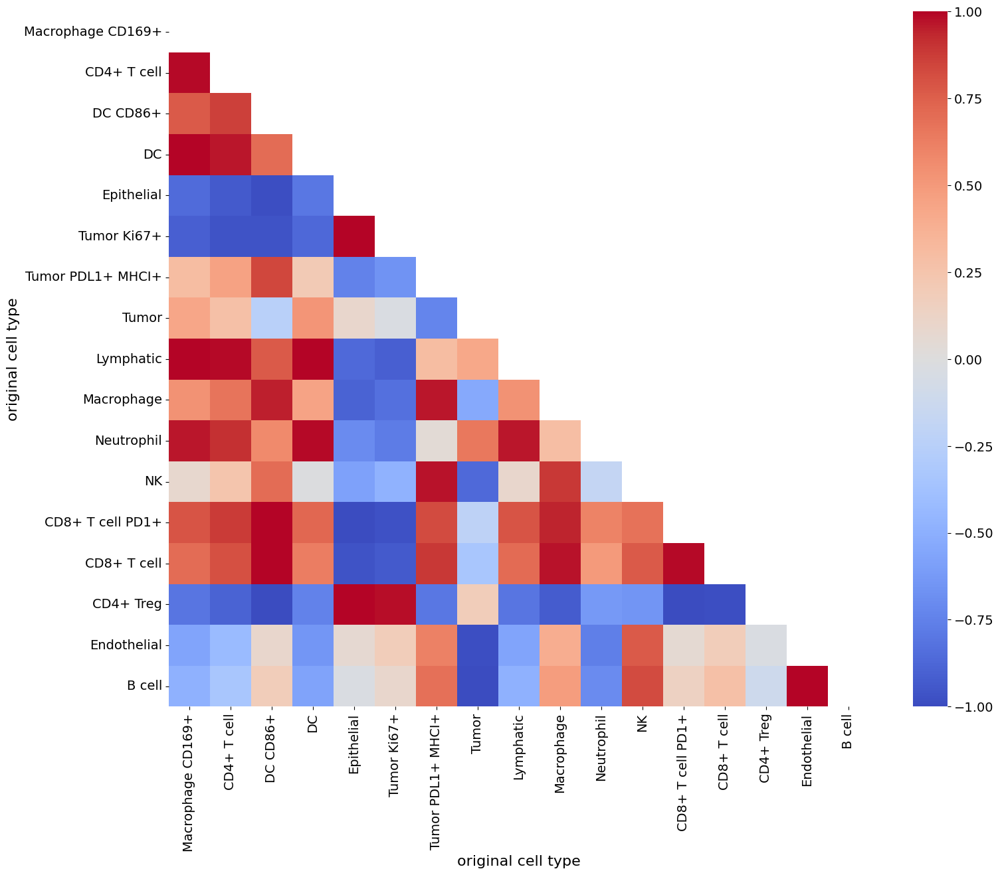

In [250]:
cor_mat, mp = pl_cor_plot(data = data, \
                       group1 = group1, \
                       per_cat = per_cat, \
                       sub_col= sub_col, \
                       sub_list= sub_list, \
                       norm=True, \
                       count=False, \
                       plot_scatter=False)

In [49]:
# Prepare subplot 
cell_type = 'CD169+ Macrophage'
pair_list = ['Ki67+ Tumor',
 'B',
 'Macrophage',
 'DC']

/Users/timnoahkempchen/opt/anaconda3/envs/spatial_analysis_environment/lib/python3.10/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


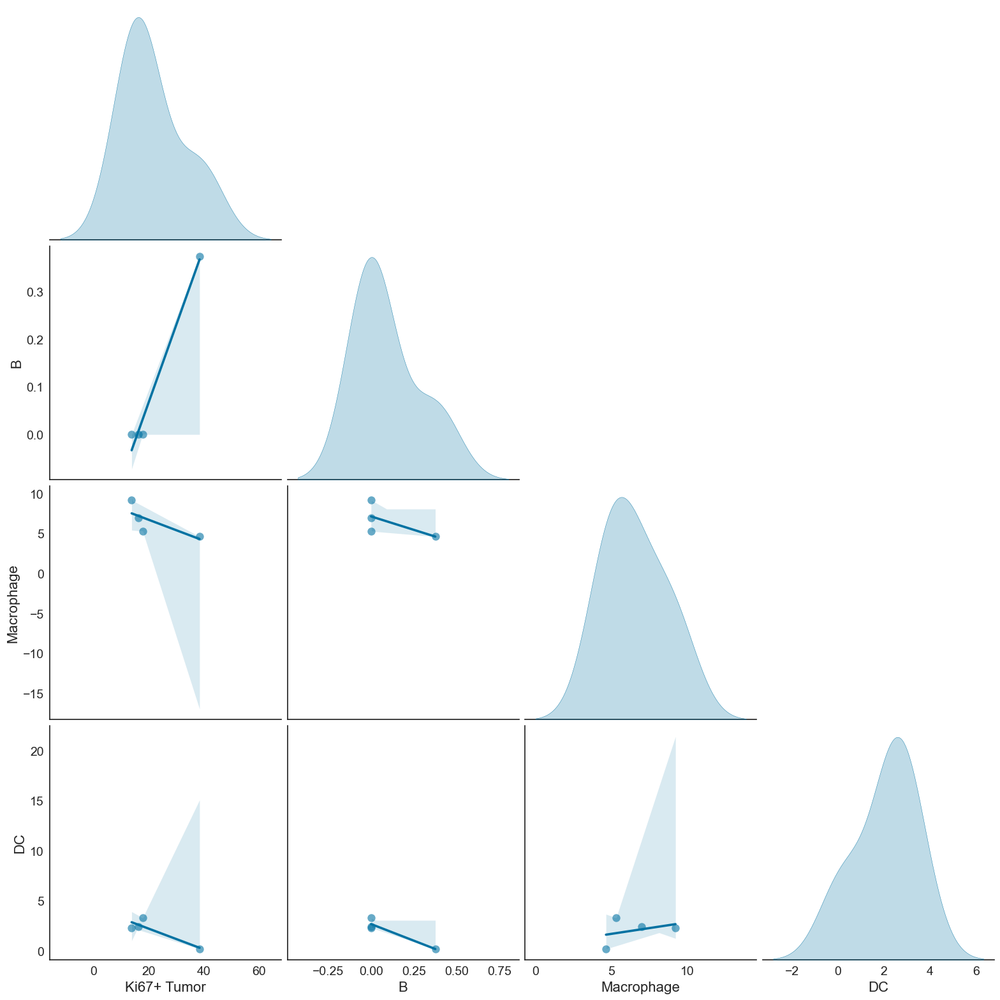

In [50]:
piar1 = all_pair.loc[all_pair['col1']==cell_type]
piar2 = all_pair.loc[all_pair['col2']==cell_type]
piar=pd.concat([piar1,piar2])
piar

#pair_list = list(set(list(piar['col1'].unique())+list(piar['col2'].unique())))
pair_list

sl = pair_list

pl_cor_subplot(mp=mp, \
            sub_list=sl, \
            output_dir = output_dir)

### 4.2.1 QC figures

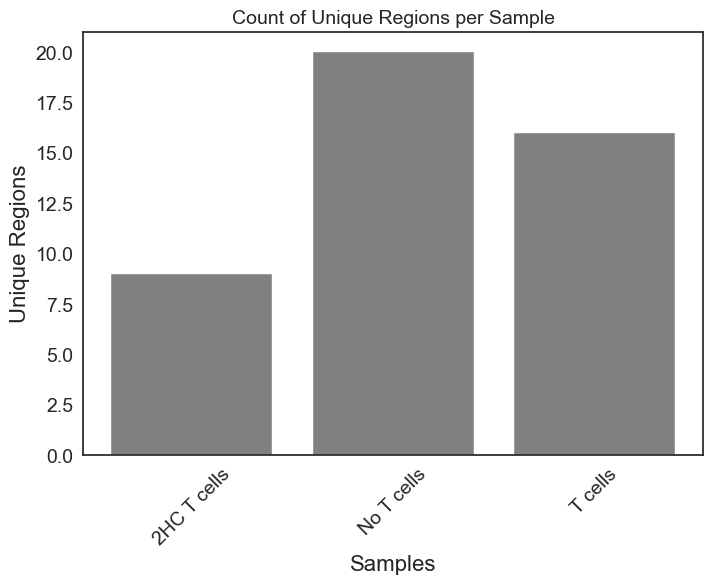

In [19]:
# this is just a QC figure to visualize potential differences in the number of replicates 
# this highlights if the user should be concerned about different replicate numbers when calculating any statistics 
pl_regions_per_sample(data = df, sample_col = "treatment", region_col = "unique_region", bar_color = "grey")

#### Plot percentage of cell types per group

**How does the function work:**
This Python function is designed to visualize the composition of
different cell types in a given dataset. The input to the function is a
pandas dataframe (df) containing information about the samples and their
cell types. The sample_column argument specifies the name of the column
in the dataframe that contains sample identifiers, and cell_type_column
specifies the name of the column containing the cell type information.

If an output_dir is specified, the function generates three different
bar plots of the cell type composition. The first plot shows the
absolute count of each cell type for each sample, where the bars are
stacked. The second plot shows the percentage of each cell type in each
sample. The third plot shows the absolute count of each cell type for
each sample, where the bars are stacked and normalized to 100 percent.

All three plots are saved as PNG files in the specified output_dir.

If no output_dir is specified, the function prints a message saying that
no output directory has been defined.

**What is the biological meaning of this analysis:**

These visualizations are ment to provide a general overview of the
global composition of each individual sample. The function provides
three different variations of bar graphs.

1.  Stacked bar graph showing the absolut count of the category

2.  Bar graph that shows the counts per category side by side

3.  Stacked bar graph showing the percentage of each category per sample

In [20]:
# Arguments for composition visualization function:

data = df # data frame to use

sample_column = "treatment" # column that specifies the sample

cell_type_column = 'original cell type' # column that specifies cell types - other variables will be accepted as well

output_dir = output_dir # directory to save output 

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_plot_pl.py:502: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  df_perc=(st/np.sum(st, axis = 1)[:,None])* 100


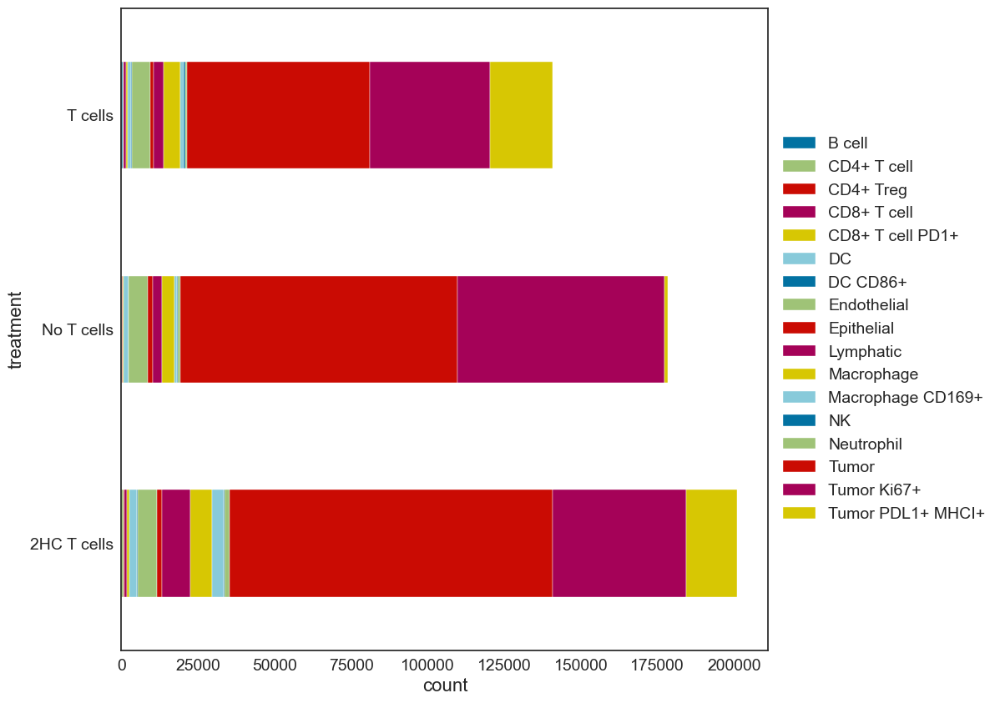

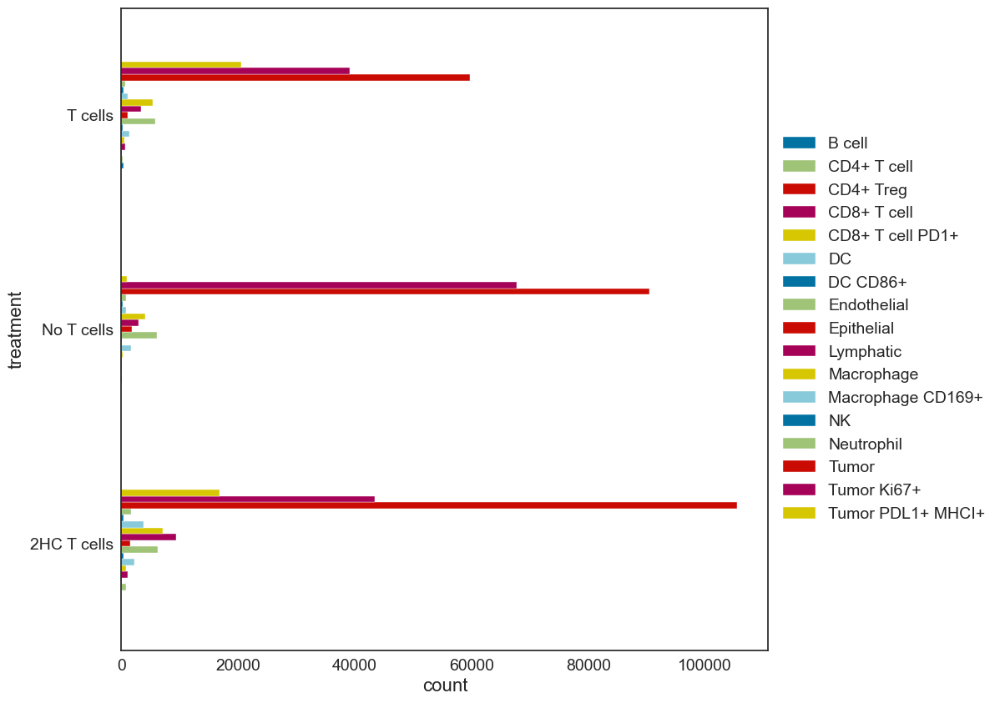

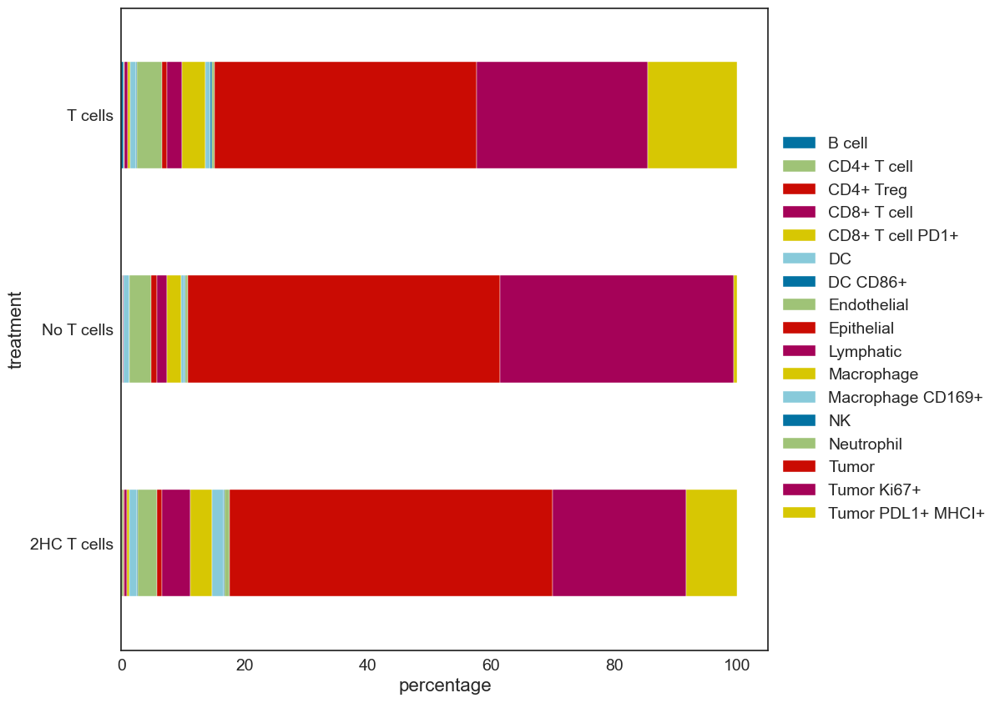

In [21]:
####### Visulize overall cell type composition
pl_cell_type_composition_vis(data = df, \
                          sample_column = sample_column, \
                          cell_type_column = cell_type_column, \
                          output_dir = output_dir)

# 5) Neighborhood and Community Analysis

**How does the function work:**

**What is the biological meaning of this analysis:**

Allocate every cell to a broader group based on its spatial context.
Cellular Neighborhoods (CN) can be understood as common groups of cells
which are shared by multiple regions (e.g. the "generic tumor
neighborhood" is found in every tumor of dataset xxx). This code assigns
the neighborhoods, plots a spatial plot colored by neighborhoods and
generates a heatmap that illustrates which cell type is found in the
generated neighborhoods.

**NOTE: This function modifies the data frame**

The function adds a column called neighborhoods_k (k is replaced with
the value used for k). This column contains the ID of the assigned
neighborhood for each cell. After executing the function, every
neighborhood is represented by a number (starting with 0). In order to
receive biological meaningful names, neigborhoods need to be annotated
based on marker expression with the help of an expert or automated
annotation approach.

In [22]:
########
'''
k is used to compute the neighborhoods of each cell by selecting the k nearest neighbors based on the Euclidean distance between the cells in the feature space. 
Once the neighborhoods have been computed, the n_neighborhoods parameter is used to cluster the neighborhoods using the MiniBatchKMeans algorithm. 
The result is that each neighborhood is assigned to one of n_neighborhoods clusters, allowing the identification of distinct cell groups or niches within the tissue.

k refers to the window size while n_neighborhoods refers to the number of generated neighborhoods
'''

# Arguments for neighborhood analysis:

X = "x" # column containing the x coordinates 

Y = "y" # column containing the y coordinates 

reg = "unique_region" # column containg the unique regions 

cluster_col = "original cell type" # column which is used for clustering - typically cell types (to generate cellular neighborhoods)

# ks = [20] # k=n means it collects n nearest neighbors for each center cell

output_dir = output_dir

k = 20

# set a single value to generate neighborhoods with this value. If you want to generate the elbow plot supply the list with a range of ks
#n_neighborhoods = numbers = list(range(1, 41))# number of generated neighborhoods - value should be biologically meaningful 
n_neighborhoods = 9

#n_neighborhoods = range(1,40)

save_to_csv= True

plot_specific_neighborhoods = [2,4]

/var/folders/6d/0x48qjh15rx9851lpdwvrxvc0000gn/T/ipykernel_973/3055040370.py:2: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  df2 = pd.concat([df,pd.get_dummies(df[cluster_col])],1)


Starting: 1/45 : 2HC T cells
Finishing: 1/45 : 2HC T cells 0.15371394157409668 0.16129159927368164
Starting: 23/45 : 2HC_1
Finishing: 23/45 : 2HC_1 0.3960118293762207 0.5748946666717529
Starting: 26/45 : 2HC_2
Finishing: 26/45 : 2HC_2 0.21281194686889648 0.7938640117645264
Starting: 27/45 : 2HC_3
Finishing: 27/45 : 2HC_3 0.2180471420288086 1.0177342891693115
Starting: 45/45 : 2HC_3_201121_TNTtumors2_4.0
Finishing: 45/45 : 2HC_3_201121_TNTtumors2_4.0 0.004848003387451172 1.027073860168457
Starting: 35/45 : 2HC_3_201124_TNTtumors2_4.0
Finishing: 35/45 : 2HC_3_201124_TNTtumors2_4.0 0.0037560462951660156 1.0307972431182861
Starting: 40/45 : 2HC_3_201125_TNTtumors2_5.0
Finishing: 40/45 : 2HC_3_201125_TNTtumors2_5.0 0.05298304557800293 1.0849688053131104
Starting: 41/45 : 2HC_3_201125_TNTtumors2_6.0
Finishing: 41/45 : 2HC_3_201125_TNTtumors2_6.0 0.02590799331665039 1.1128060817718506
Starting: 29/45 : 2HC_4
Finishing: 29/45 : 2HC_4 0.17290496826171875 1.2852470874786377
Starting: 42/45 : Cnt

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_tools_tl.py:115: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_tools_tl.py:117: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/Users/timnoahkempchen/opt/anaconda3/envs/tissuumaps_env/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


2HC T cells


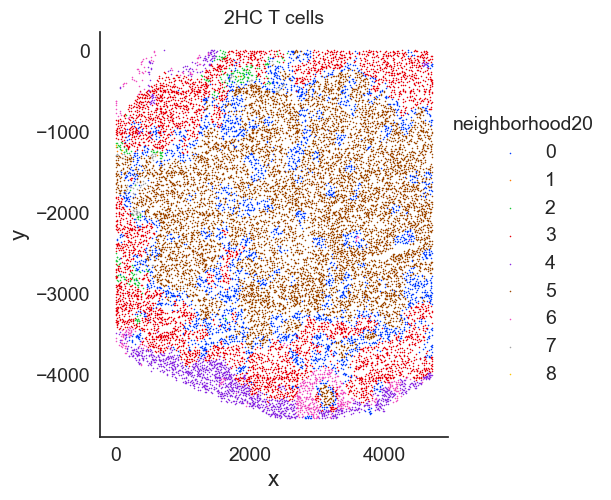

No T cells


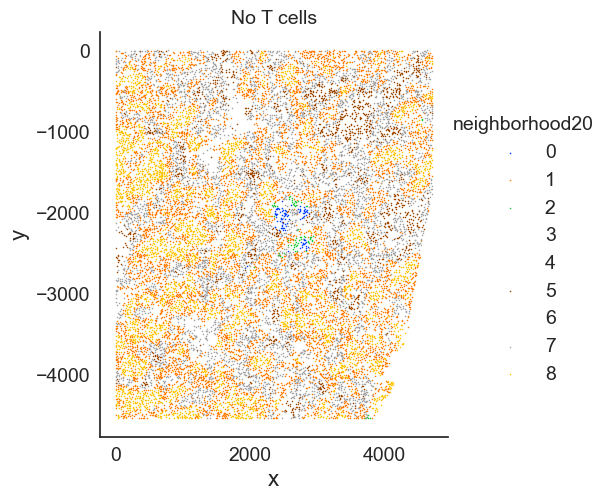

T cells


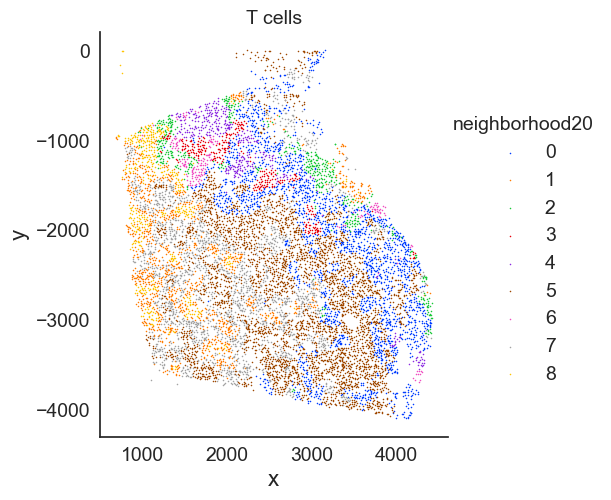

T_1A_9.0


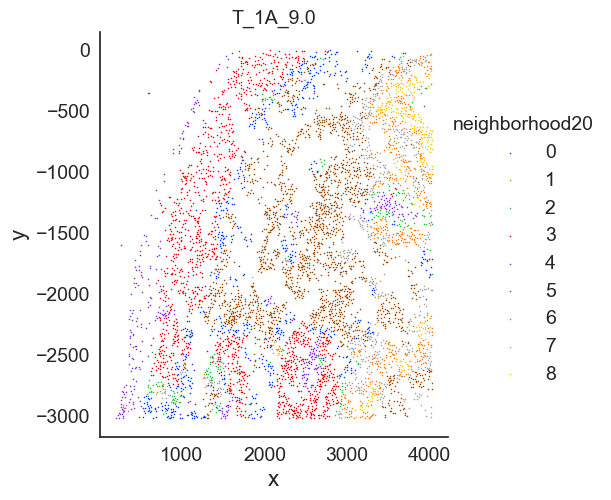

T_1A_10.0


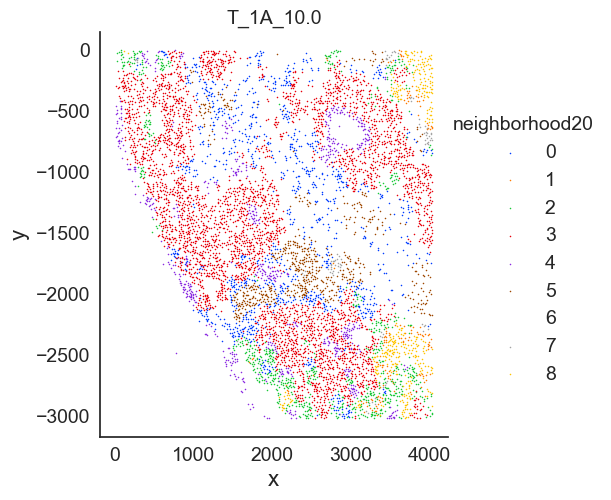

T_1A_11.0


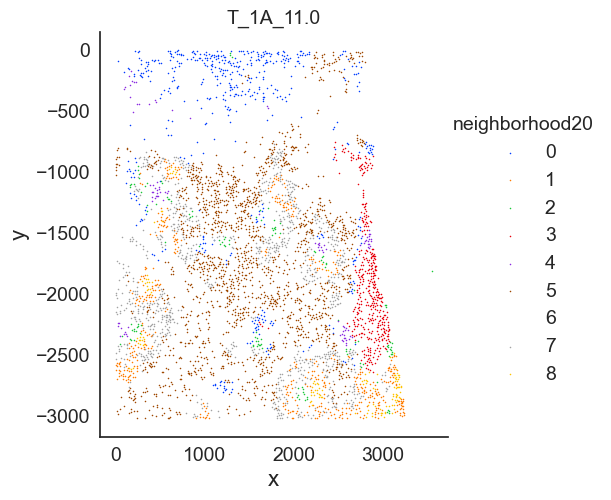

T_1A_12.0


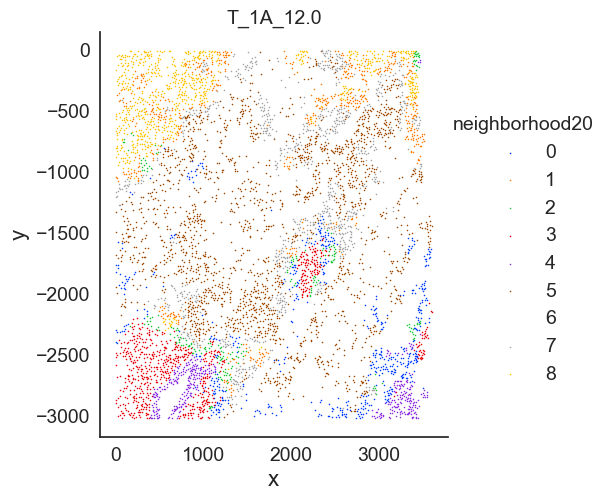

Control_1A_14.0


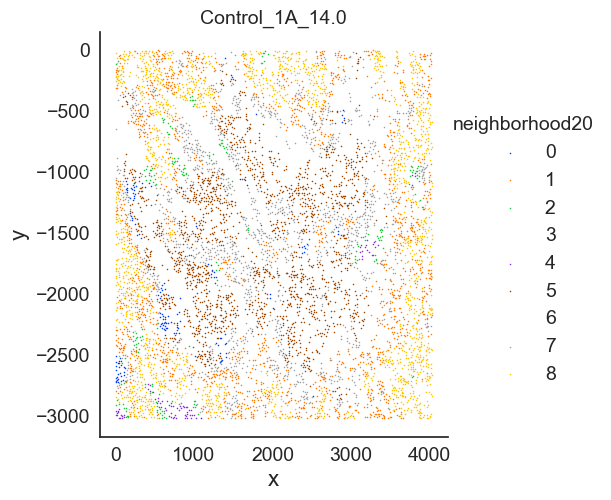

Control_1A_15.0


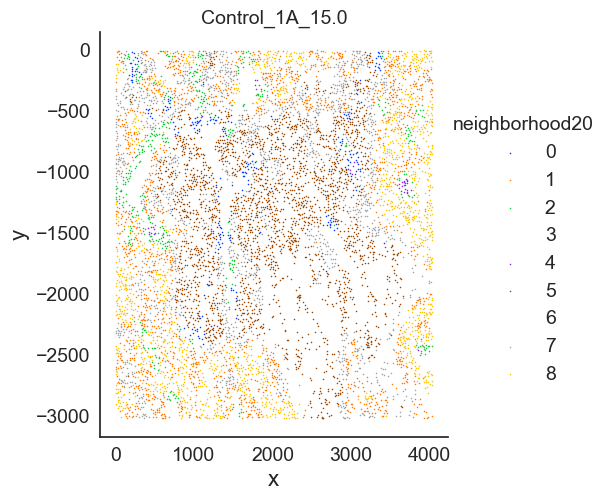

Control_1A_16.0


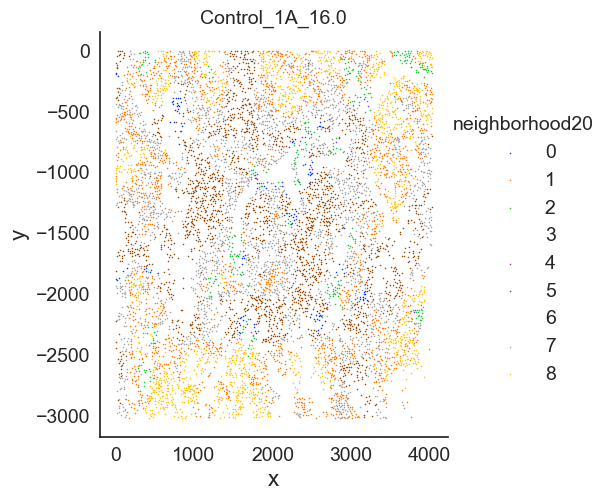

T_1B_14.0


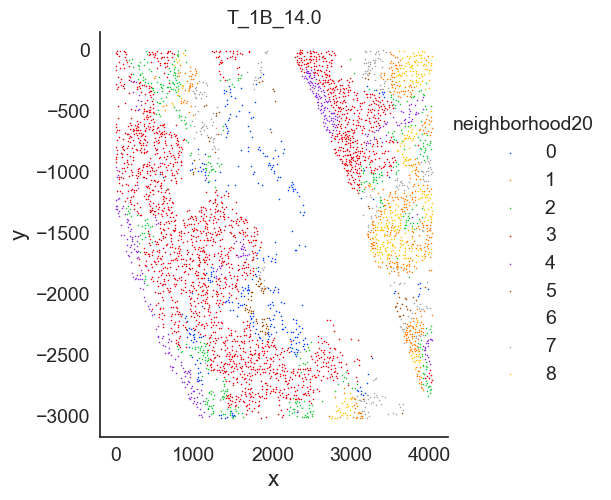

T_1B_15.0


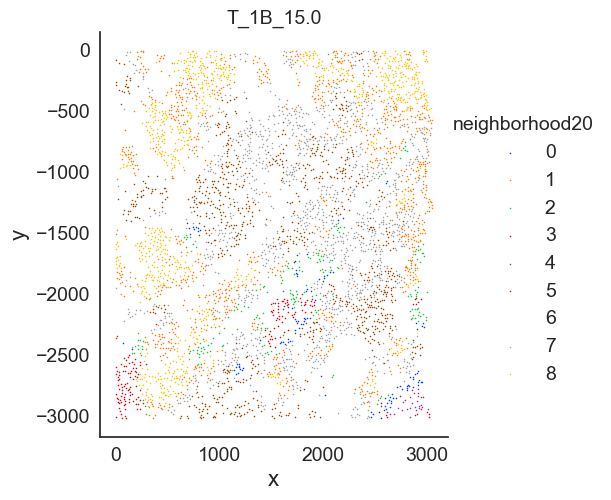

T_1B_16.0


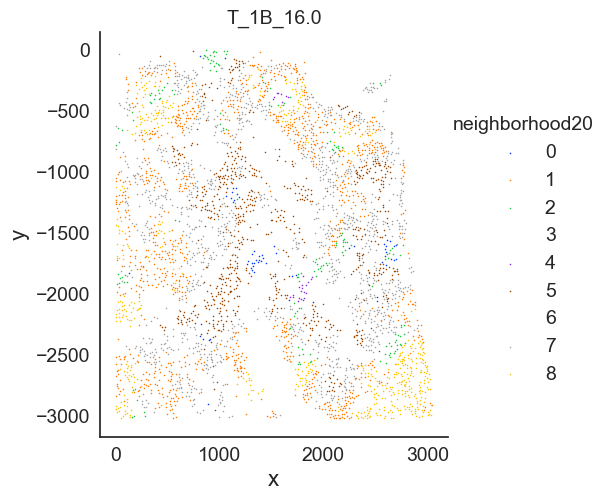

Control_1B_17.0


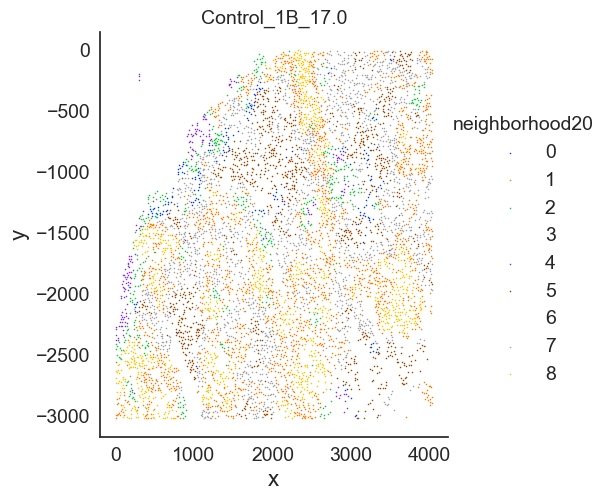

Control_1B_18.0


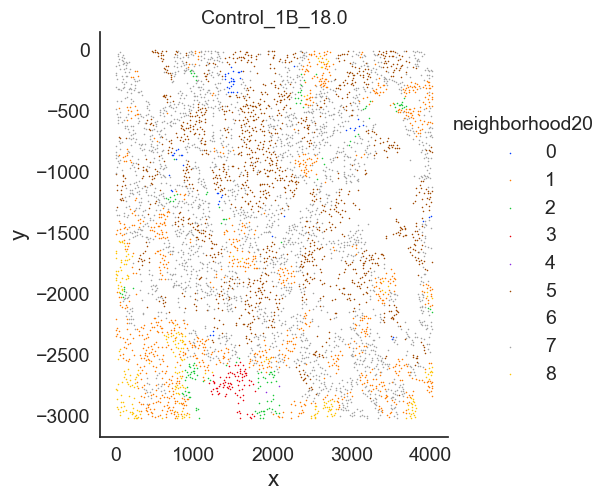

Control_1B_19.0


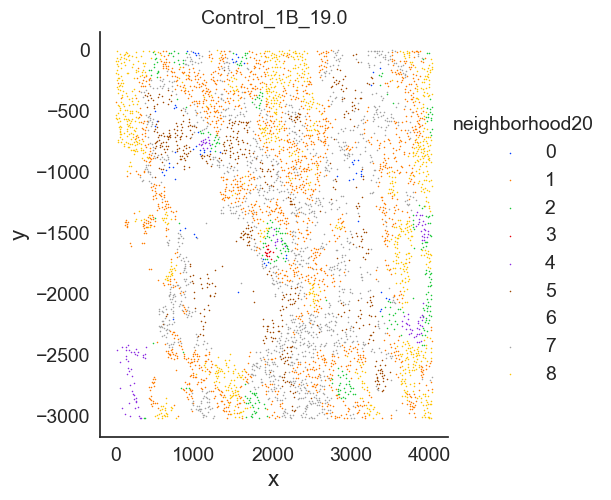

Control_2A_16.0


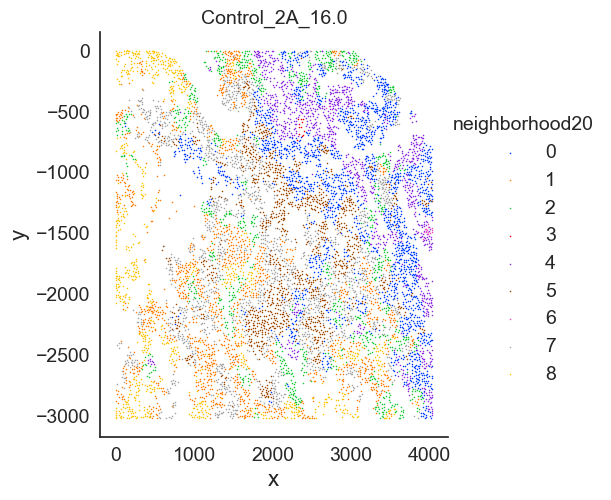

Control_2A_17.0


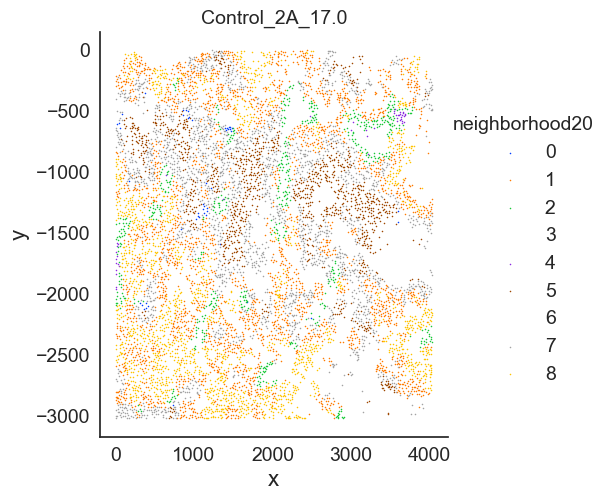

Control_2A_18.0


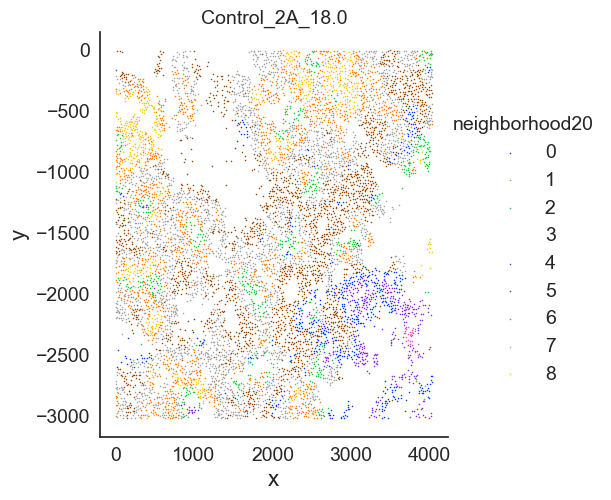

Control_2B_13.0


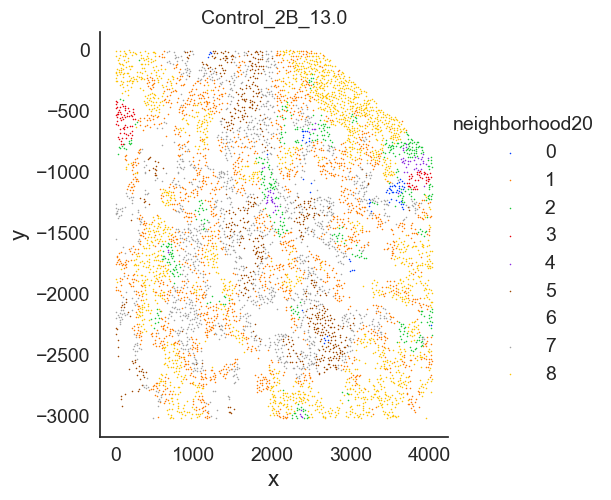

Control_2B_14.0


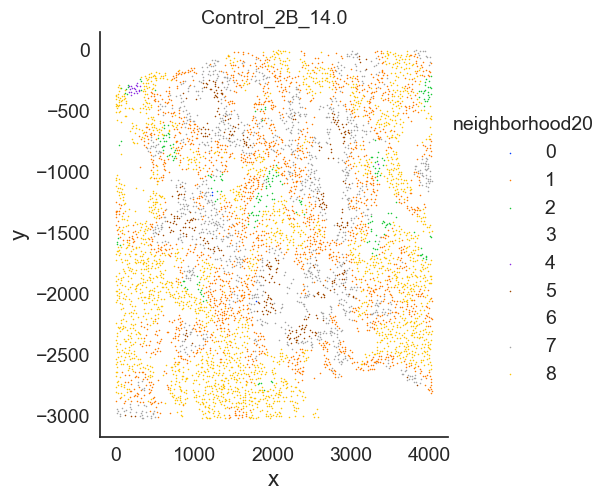

Control_2B_15.0


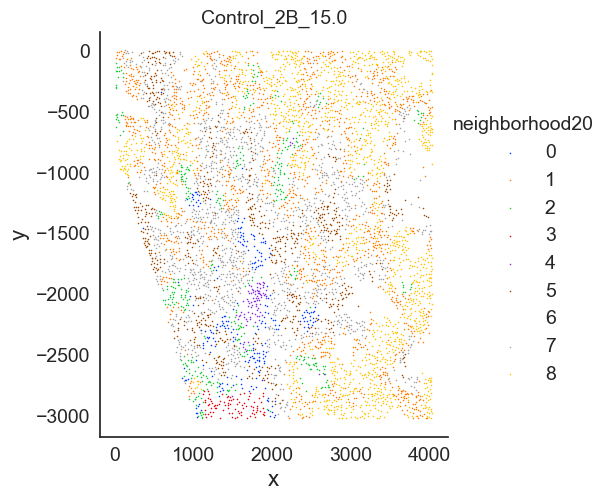

2HC_1


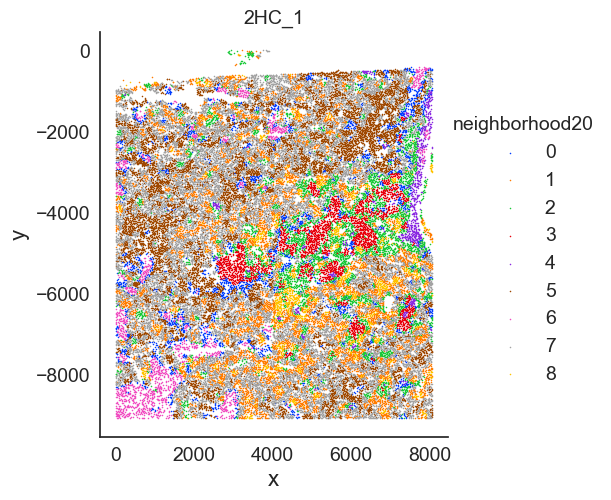

T_1


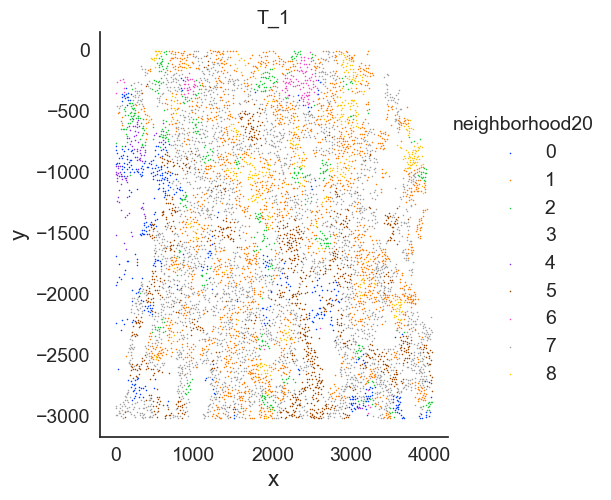

T_2


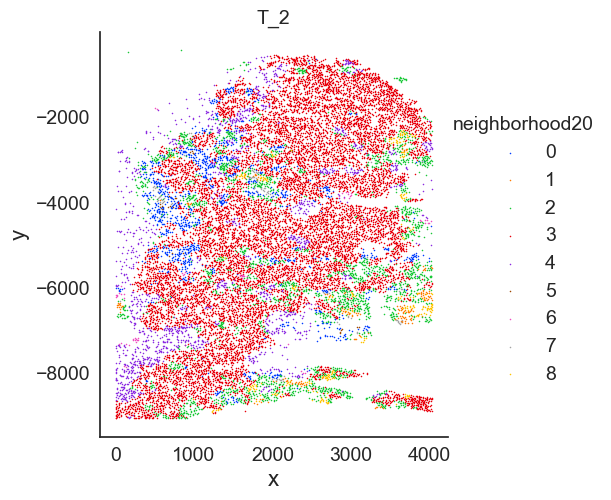

2HC_2


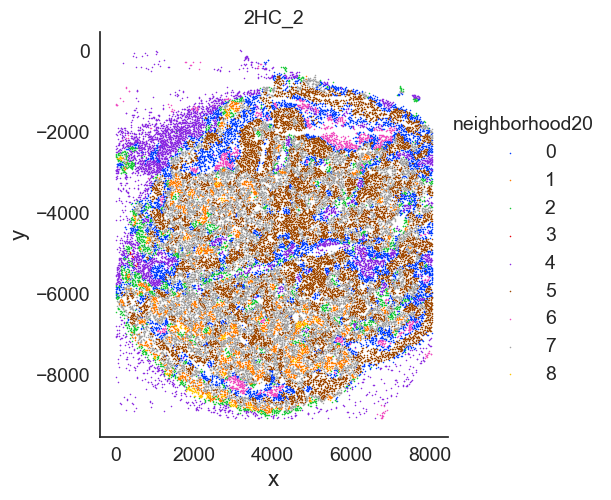

2HC_3


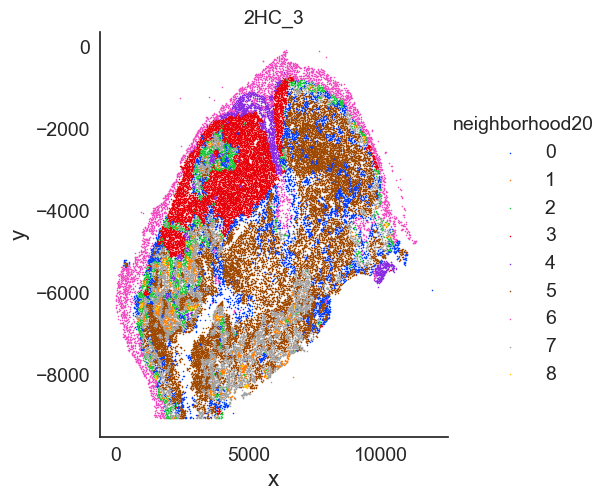

T_3


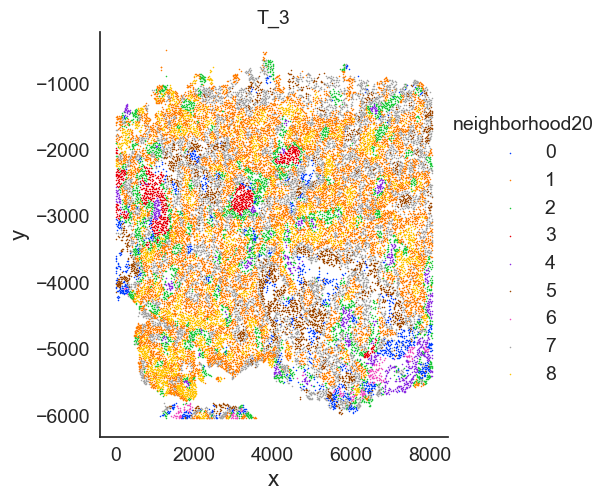

2HC_4


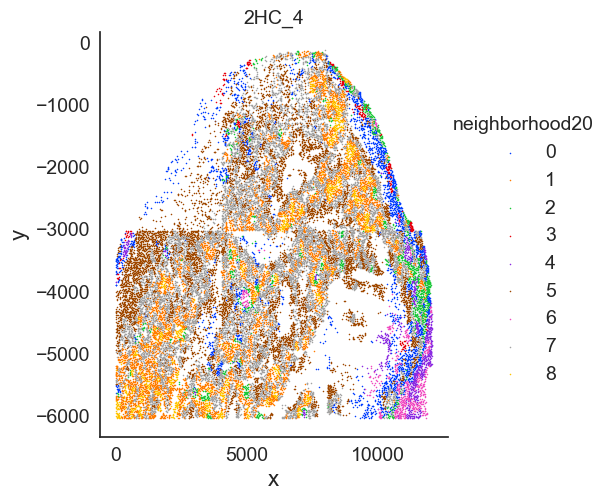

T_4


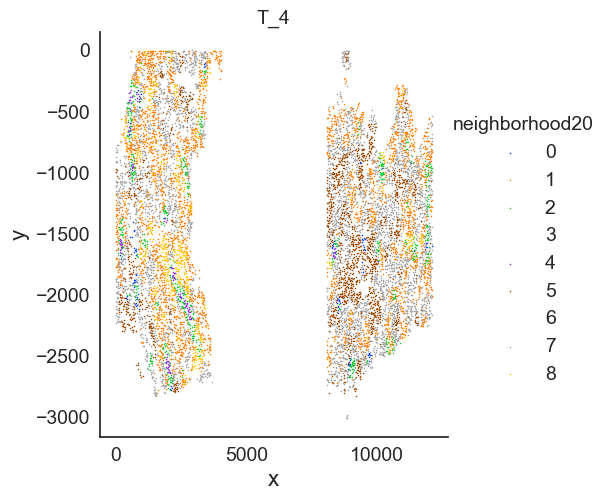

No_Irr_Cntrl_3


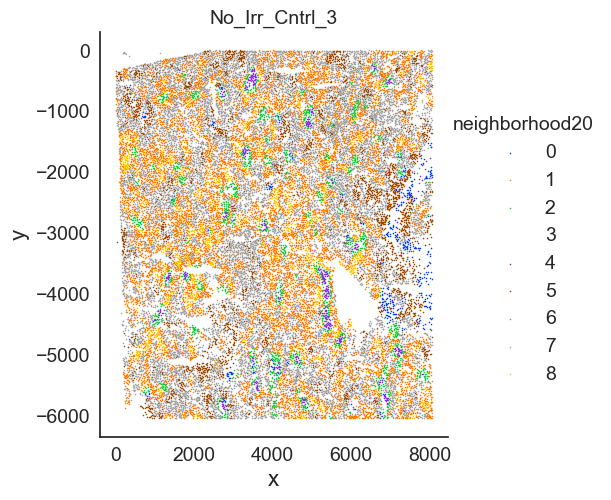

Cntrl_3_201124_TNTtumors2_1.0


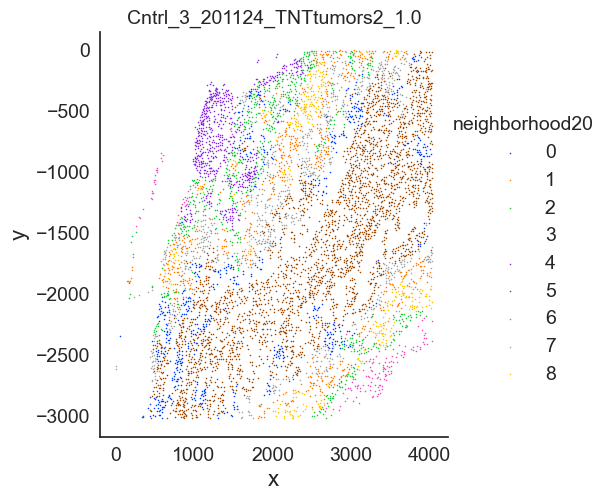

Cntrl_3_201124_TNTtumors2_2.0


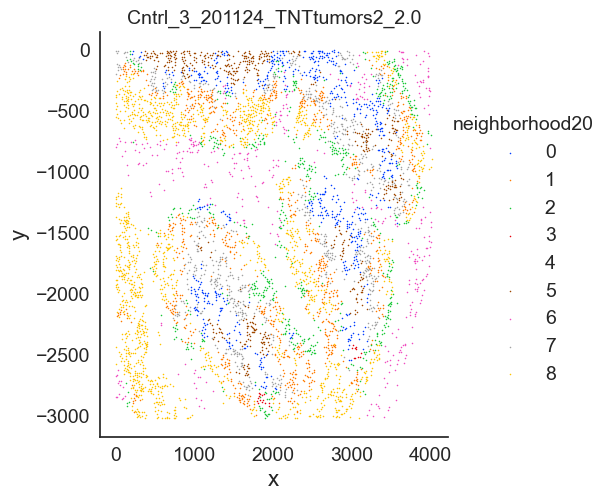

T_3_201124_TNTtumors2_3.0


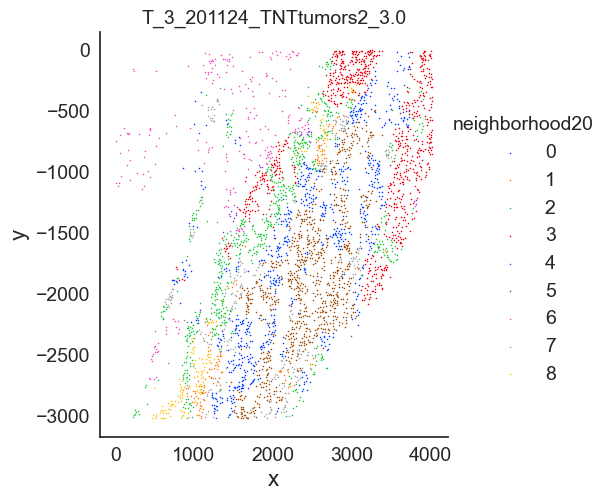

2HC_3_201124_TNTtumors2_4.0


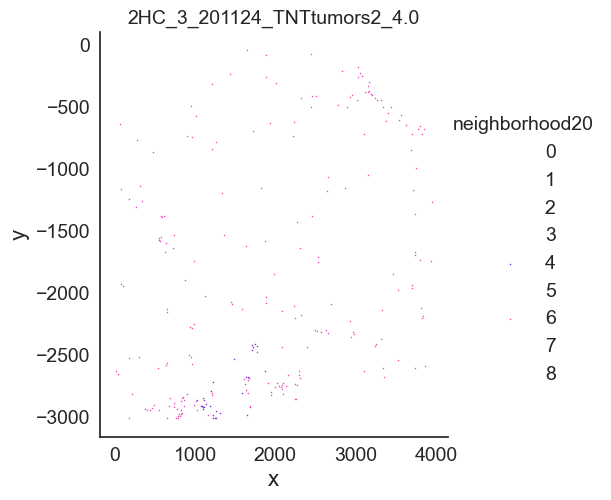

Cntrl_3_201125_TNTtumors2_1.0


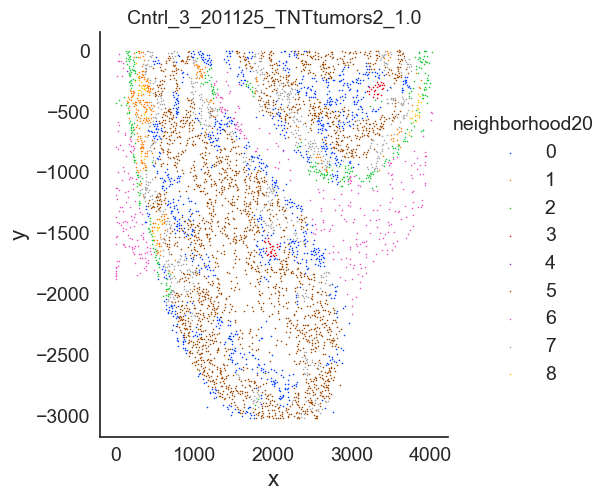

Cntrl_3_201125_TNTtumors2_2.0


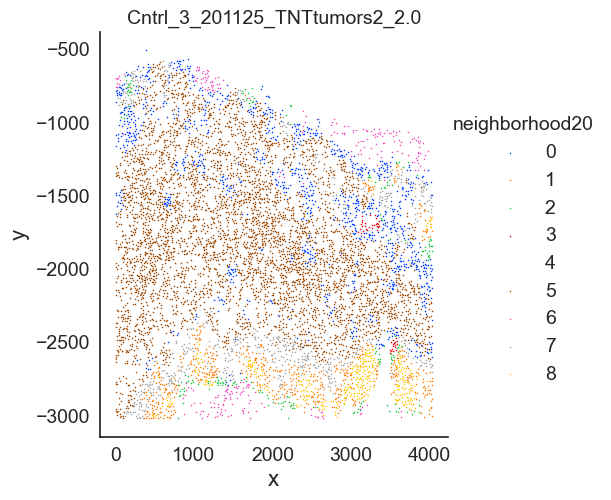

T_3_201125_TNTtumors2_3.0


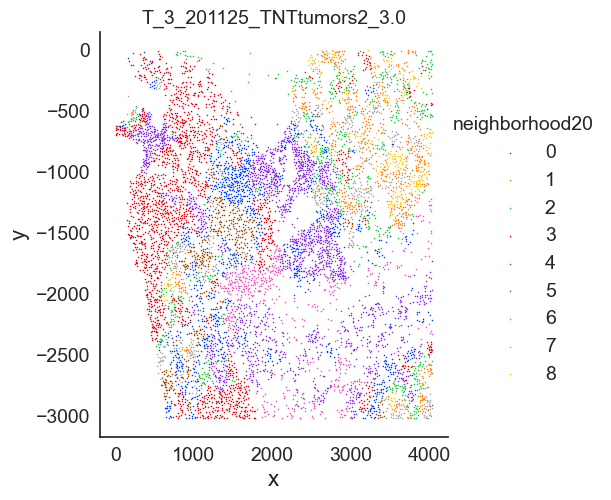

T_3_201125_TNTtumors2_4.0


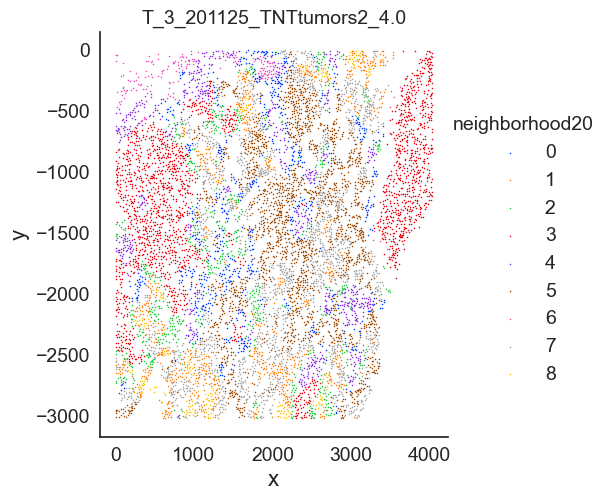

2HC_3_201125_TNTtumors2_5.0


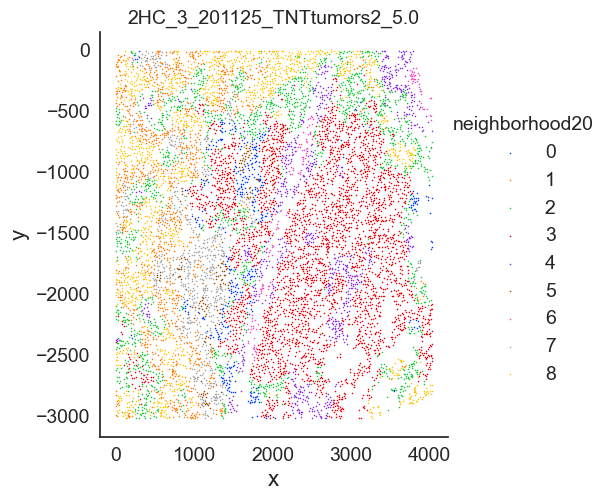

2HC_3_201125_TNTtumors2_6.0


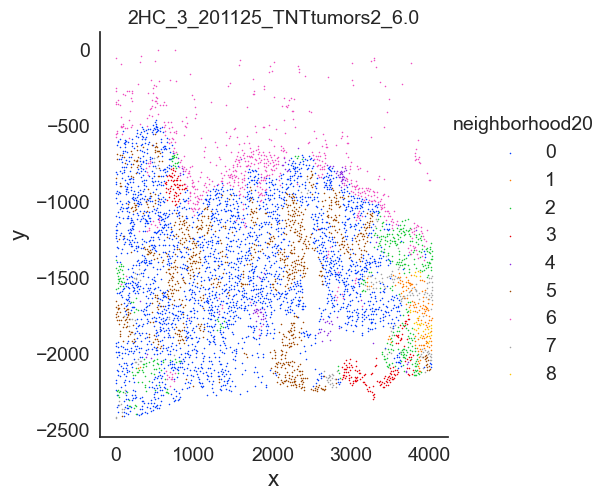

Cntrl_3_201121_TNTtumors2_1.0


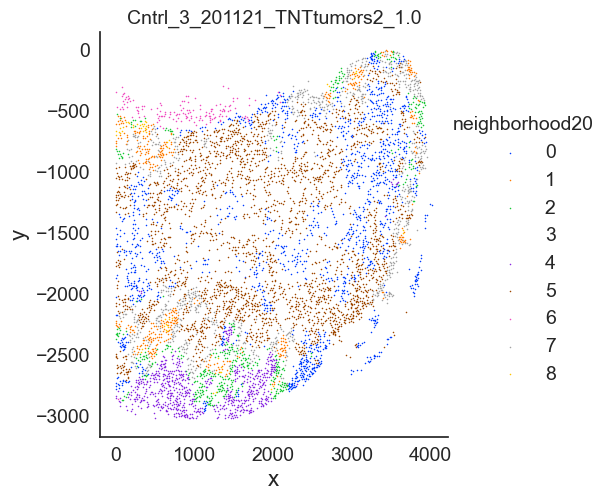

Cntrl_3_201121_TNTtumors2_2.0


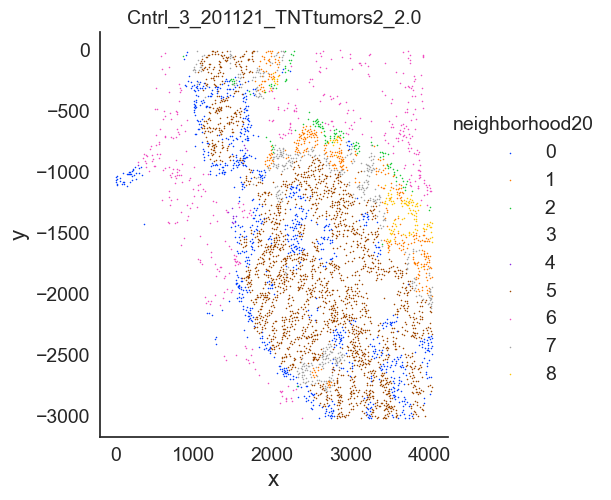

T_3_201121_TNTtumors2_3.0


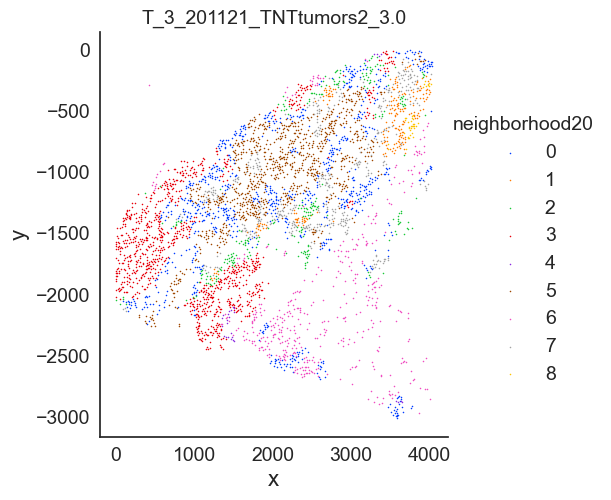

2HC_3_201121_TNTtumors2_4.0


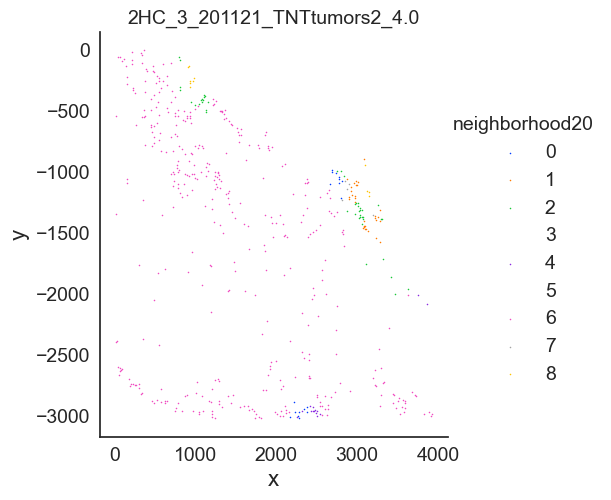

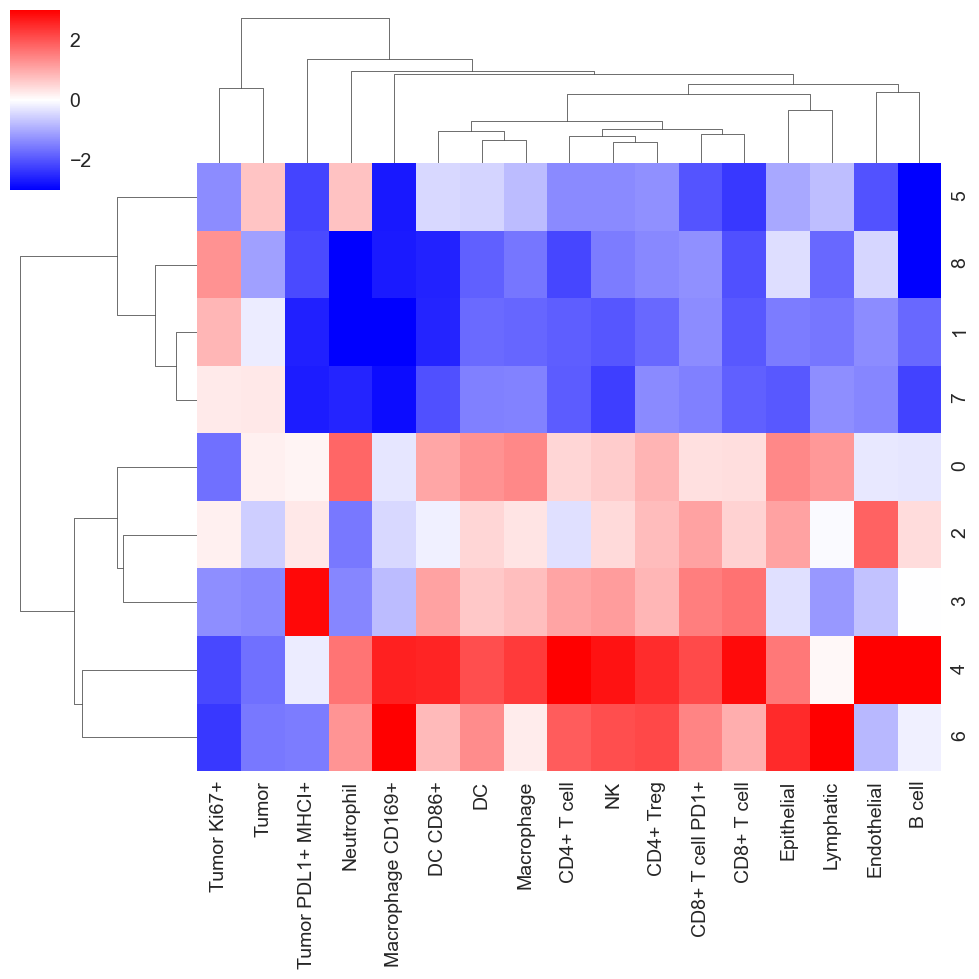

In [23]:
####### Neighborhood analysis 
df2 = pd.concat([df,pd.get_dummies(df[cluster_col])],1)
sum_cols = df2[cluster_col].unique()
values = df2[sum_cols].values

k_centroids = {}

# Previous version of function will be removed in future update 
# Maybe implement a function to test for the optimal neighborhood count


cells_df, k_centroids = tl_neighborhood_analysis_2(data = df2, 
                           values = values, 
                           sum_cols = sum_cols, 
                           X = X, 
                           Y = Y, 
                           reg = reg, 
                           cluster_col = cluster_col, 
                           k = k, 
                           n_neighborhoods = n_neighborhoods,
                           elbow=False) 

pl_neighborhood_analysis_2(data = cells_df, 
                           k_centroids = k_centroids,
                           values = values, 
                           sum_cols = sum_cols, 
                           X = X, 
                           Y = Y, 
                           reg = reg, 
                           output_dir = output_dir, 
                           k = k, 
                           plot_specific_neighborhoods = None)



# I identified redundant elements and removed them 
#cells_df = neighborhood_analysis_2(data = df2, 
#                                 X = X, 
#                                 Y = Y, 
#                                 reg = reg, 
#                                 cluster_col = cluster_col, 
#                                 output_dir = output_dir, 
#                                 k = k, 
#                                 n_neighborhoods = n_neighborhoods, 
#                                 save_to_csv= True, 
#                                 plot_specific_neighborhoods = [2,4], 
#                                 values = values, 
#                                 sum_cols = sum_cols,
#                                 calc_silhouette_score = False)


### 5.1) Annotate neighborhoods

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_plot_pl.py:502: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  df_perc=(st/np.sum(st, axis = 1)[:,None])* 100


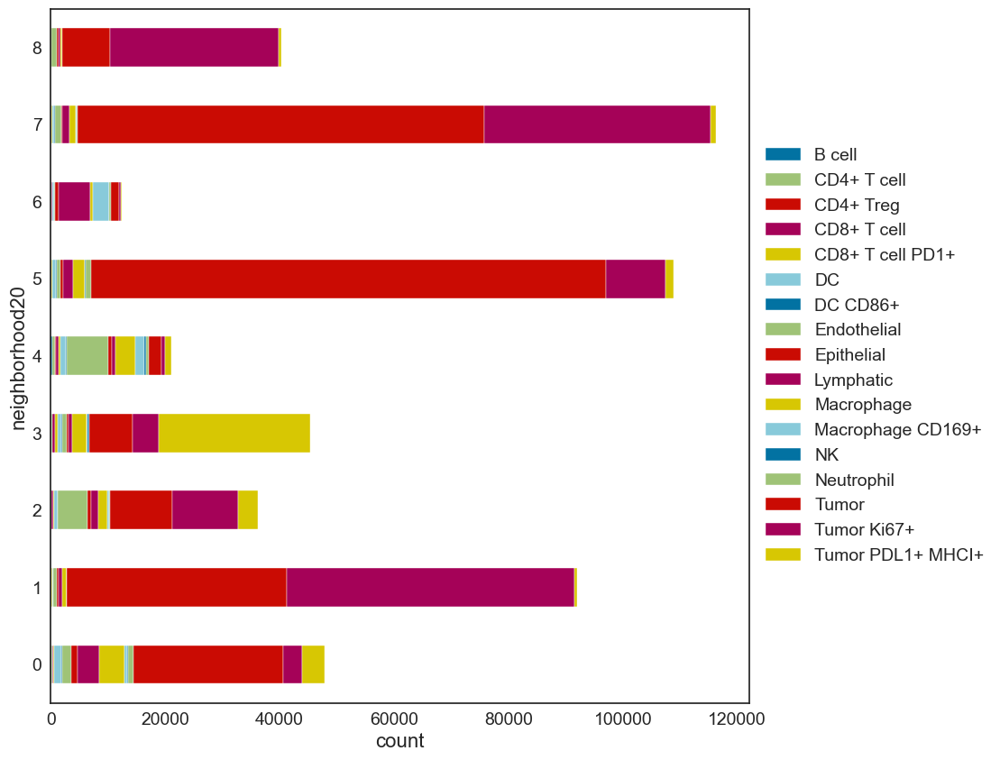

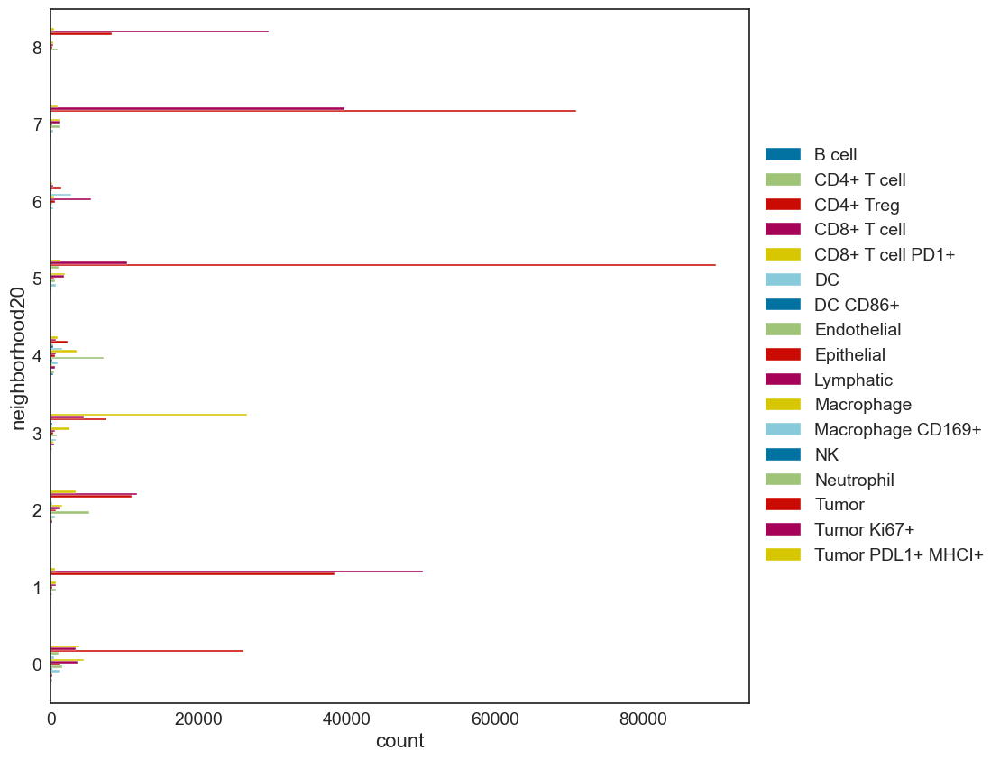

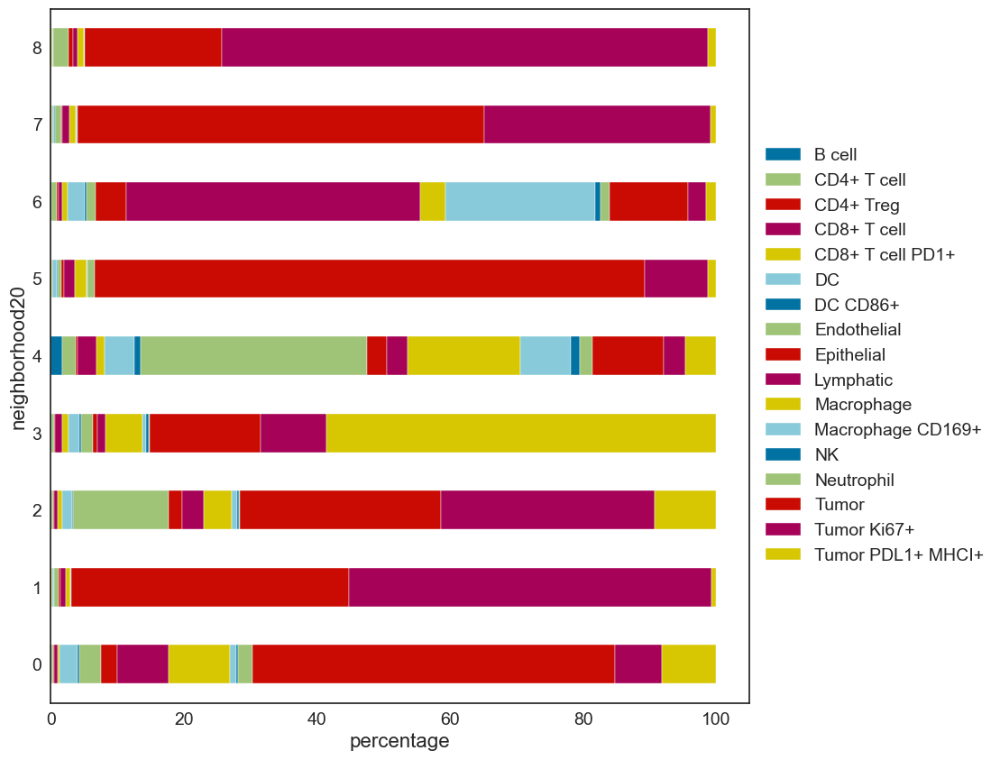

In [24]:
pl_cell_type_composition_vis(data = cells_df, \
                          sample_column = "neighborhood20", \
                          cell_type_column = "original cell type", \
                          output_dir = output_dir)

In [25]:
def rename_rows(df, column, row_dict):
    df[column] = df[column].replace(row_dict)
    return df

In [ ]:
rename_rows(cells_df, "neighborhood11", row_dict)

Create some pie charts to visualize the overall distribution of neighborhoods - note that this looks only good for low replicate numbers 

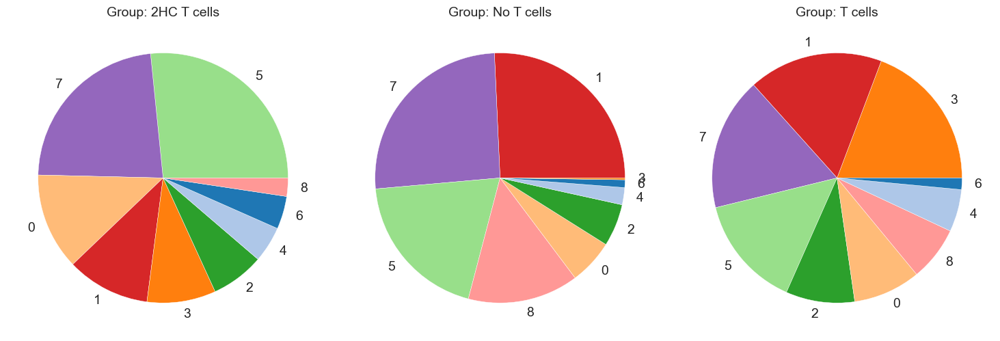

In [27]:
pl_create_pie_charts(cells_df, "treatment", "neighborhood20", show_percentages=False)

## 5.2) Community Analysis

**How does the function work:**

**What is the biological meaning of this analysis:**

This analysis is very similar to the neighborhood analysis but
classifies even broader groups. Instead of cell types neighborhoods are
used for

**NOTE: This function modifies the data frame**

The function adds a column called communities_k (k is replaced with the
value used for k). This column contains the ID of the assigned community
for each cell. After executing the function, every community is
represented by a number (starting with 0). In order to receive
biological meaningful names, communities need to be annotated based on
incorporated neighborhoods with the help of an expert or automated
annotation approach.

In [28]:
# Arguments for community analysis:

data = cells_df

X = X

Y = Y

reg = "unique_region"

cluster_col_commun = "neighborhood20"

# ks_commun = [10] # k=n means it collects n nearest neighbors for each center cell

output_dir = output_dir

k_commun = 100

n_communities_commun = 5

plot_specific_community = [2,4,5]

values = values

sum_cols = sum_cols

Starting: 1/45 : 2HC T cells
Finishing: 1/45 : 2HC T cells 0.5149989128112793 0.5182230472564697
Starting: 23/45 : 2HC_1
Finishing: 23/45 : 2HC_1 1.1589341163635254 1.6973209381103516
Starting: 26/45 : 2HC_2
Finishing: 26/45 : 2HC_2 0.7873687744140625 2.5117218494415283
Starting: 27/45 : 2HC_3
Finishing: 27/45 : 2HC_3 0.782526969909668 3.3206021785736084
Starting: 45/45 : 2HC_3_201121_TNTtumors2_4.0
Finishing: 45/45 : 2HC_3_201121_TNTtumors2_4.0 0.009383916854858398 3.349139928817749
Starting: 35/45 : 2HC_3_201124_TNTtumors2_4.0
Finishing: 35/45 : 2HC_3_201124_TNTtumors2_4.0 0.005977153778076172 3.3551459312438965
Starting: 40/45 : 2HC_3_201125_TNTtumors2_5.0
Finishing: 40/45 : 2HC_3_201125_TNTtumors2_5.0 0.1912081241607666 3.5496199131011963
Starting: 41/45 : 2HC_3_201125_TNTtumors2_6.0
Finishing: 41/45 : 2HC_3_201125_TNTtumors2_6.0 0.09720706939697266 3.658975124359131
Starting: 29/45 : 2HC_4
Finishing: 29/45 : 2HC_4 0.6004898548126221 4.263451814651489
Starting: 42/45 : Cntrl_3_2011

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_tools_tl.py:239: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = sum_cols) for exp in exps],0)
/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_tools_tl.py:241: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([cells[keep_cols],window],1)
/Users/timnoahkempchen/opt/anaconda3/envs/tissuumaps_env/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


2HC T cells


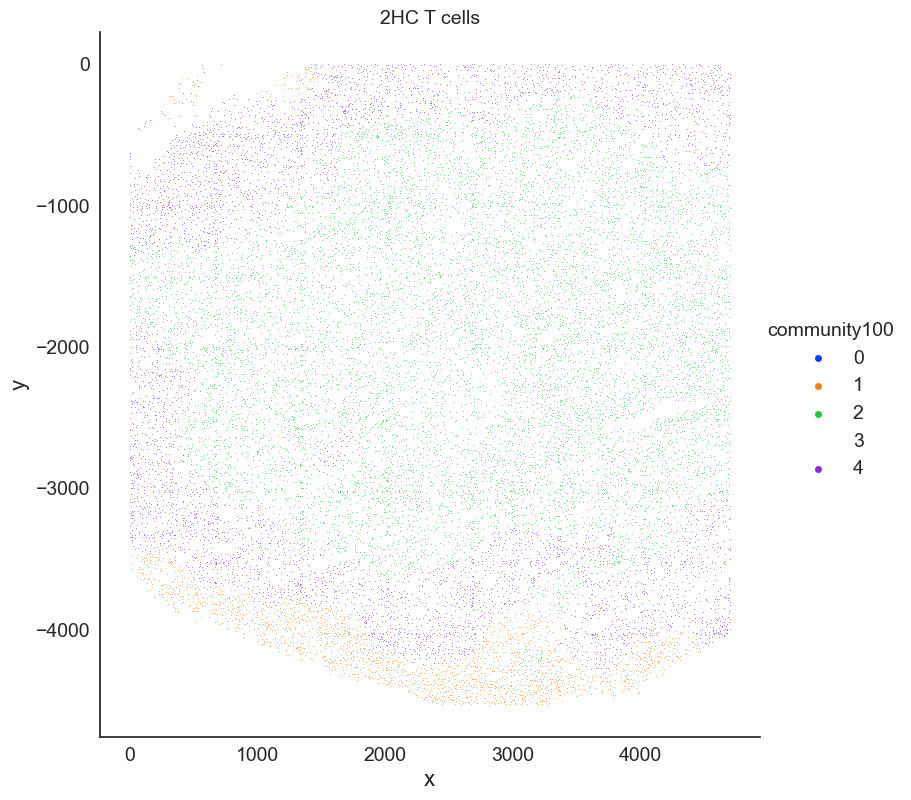

No T cells


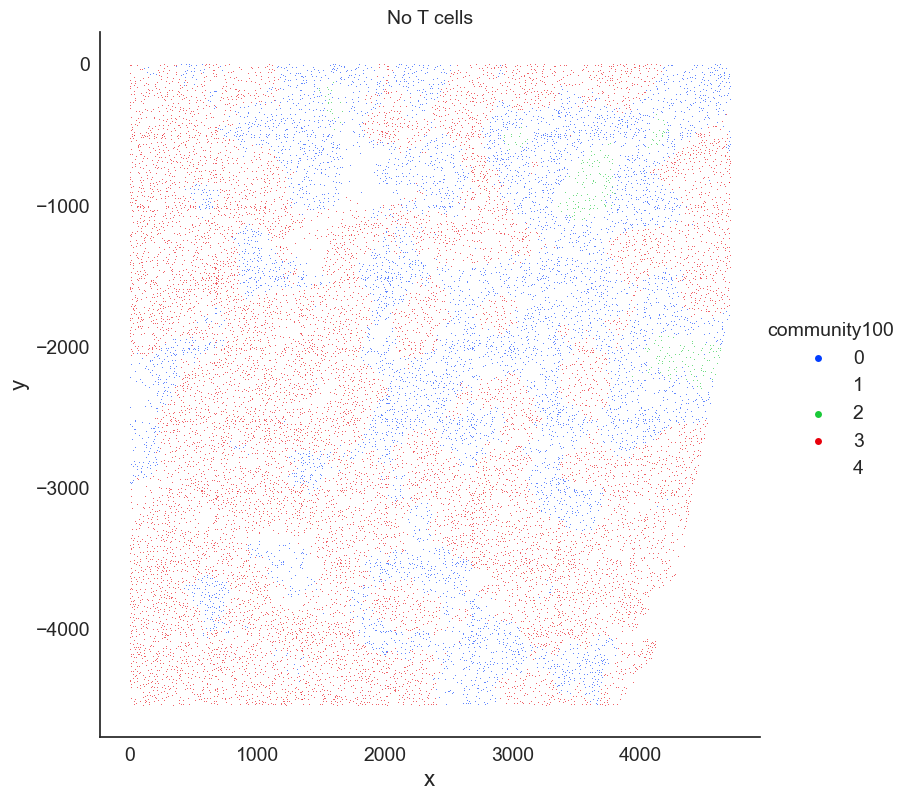

T cells


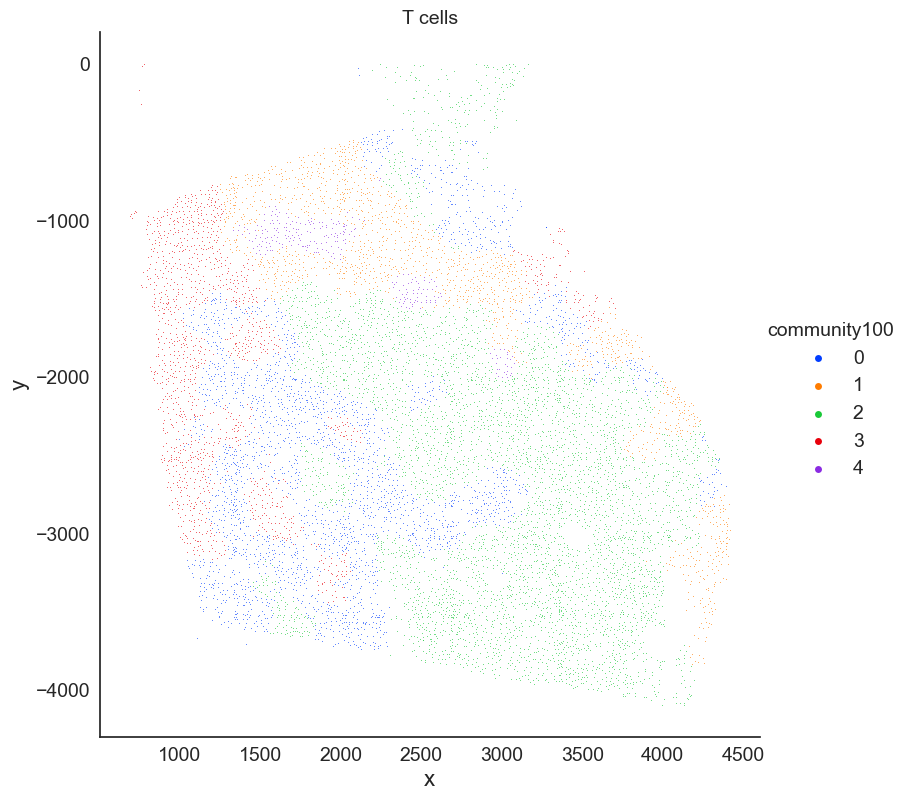

T_1A_9.0


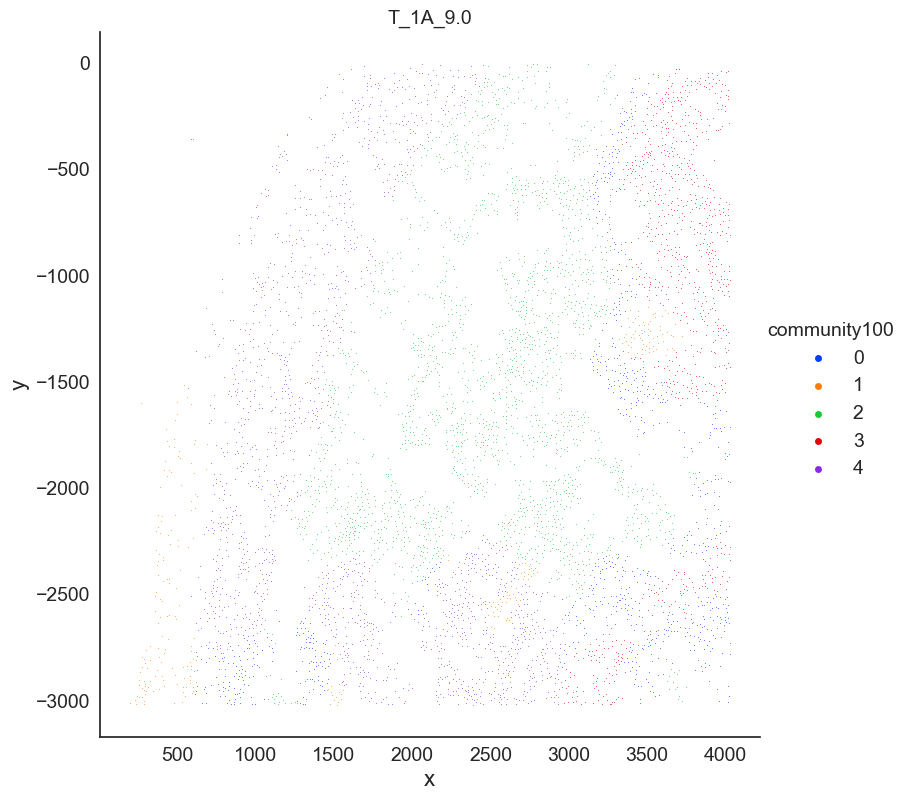

T_1A_10.0


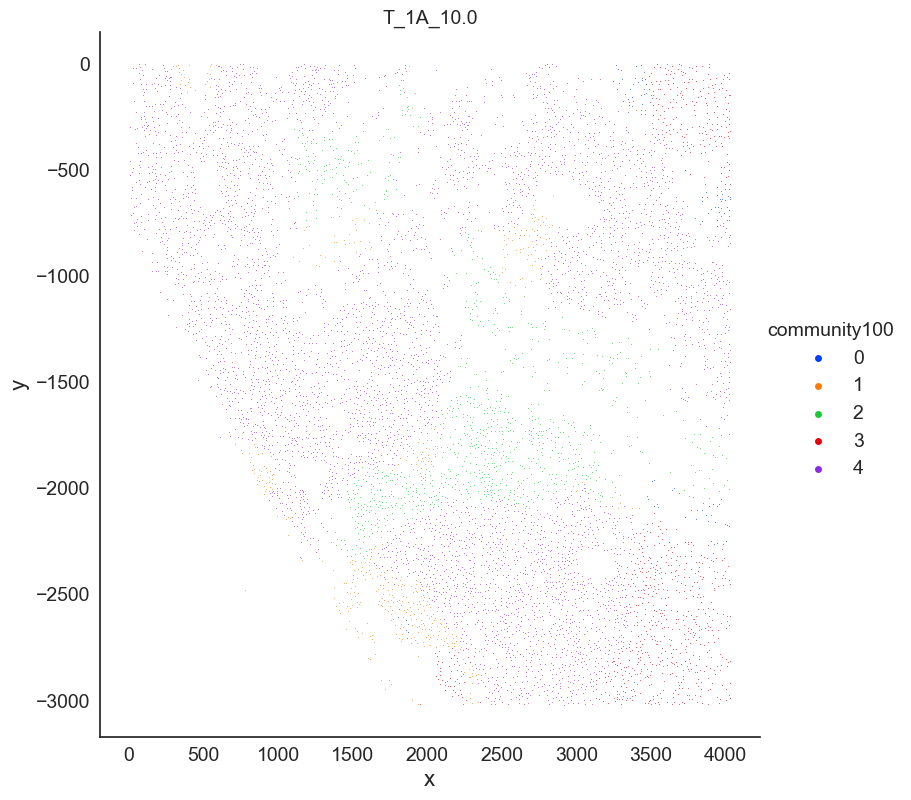

T_1A_11.0


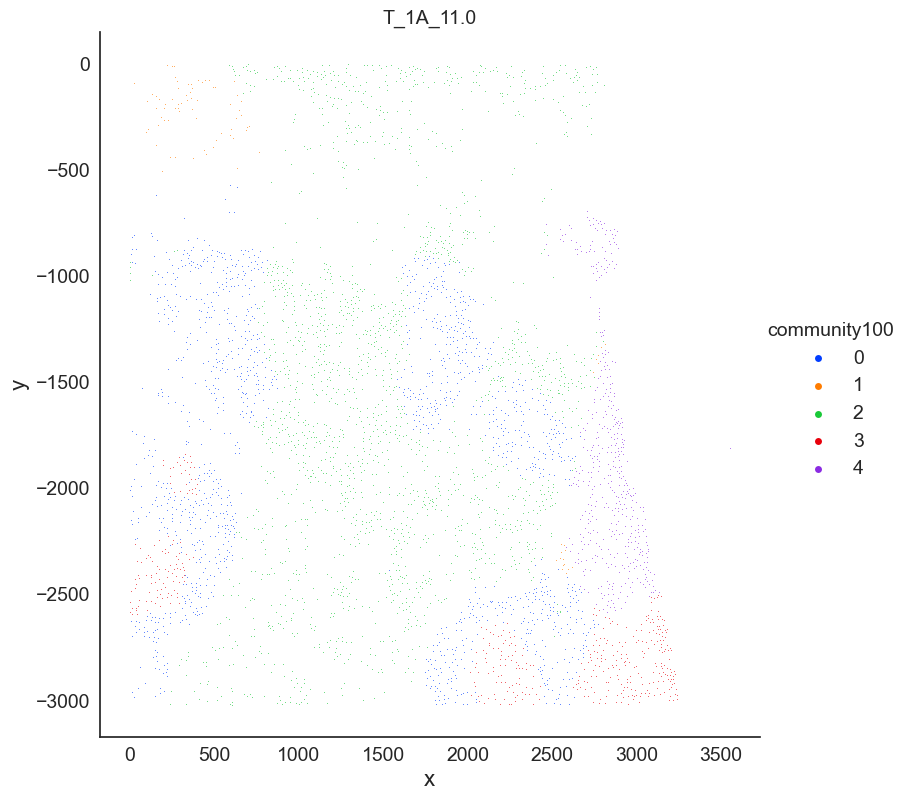

T_1A_12.0


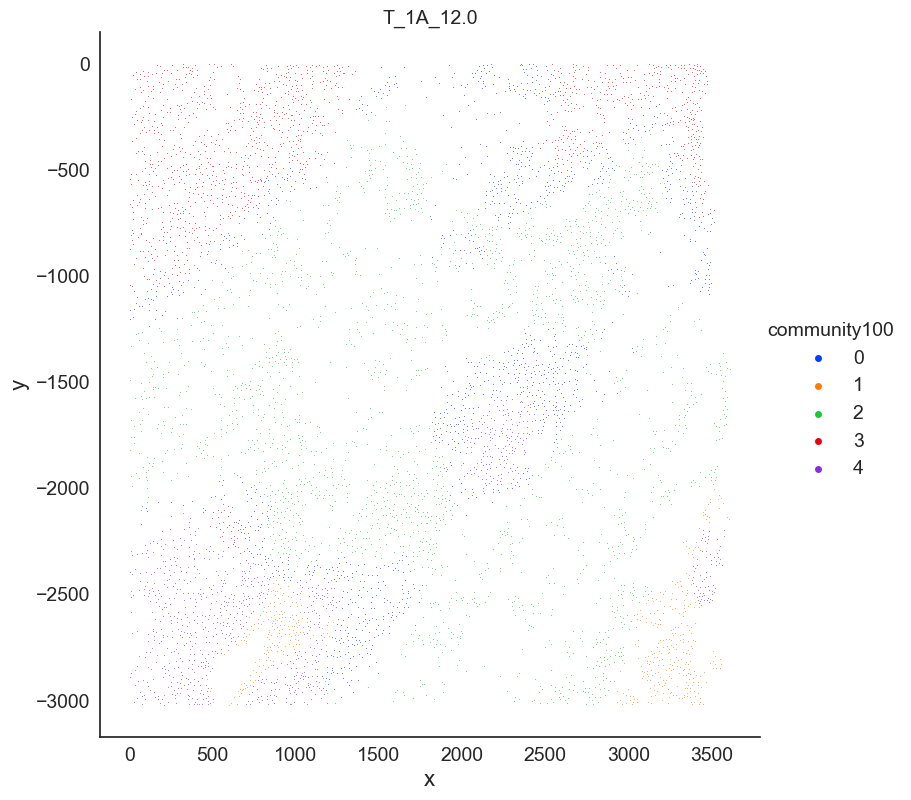

Control_1A_14.0


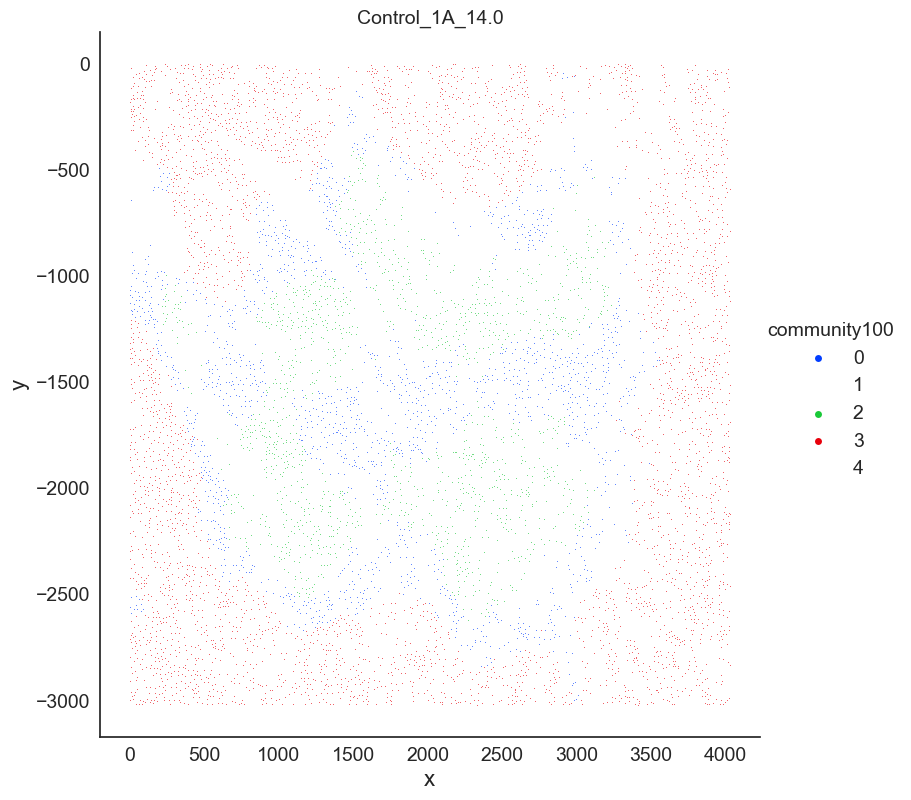

Control_1A_15.0


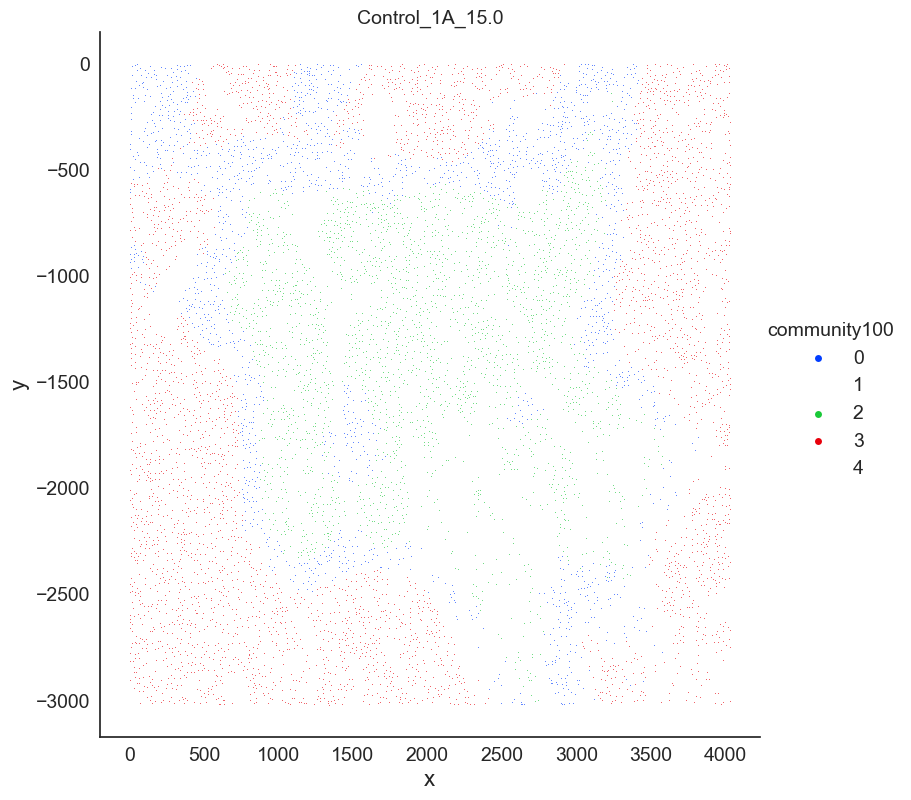

Control_1A_16.0


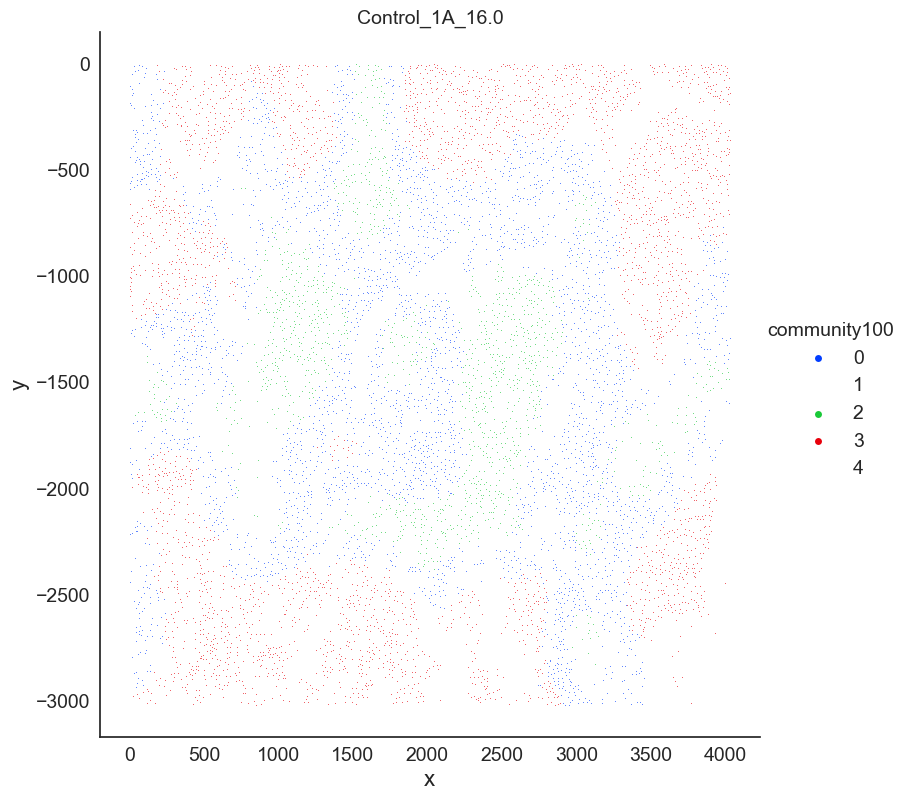

T_1B_14.0


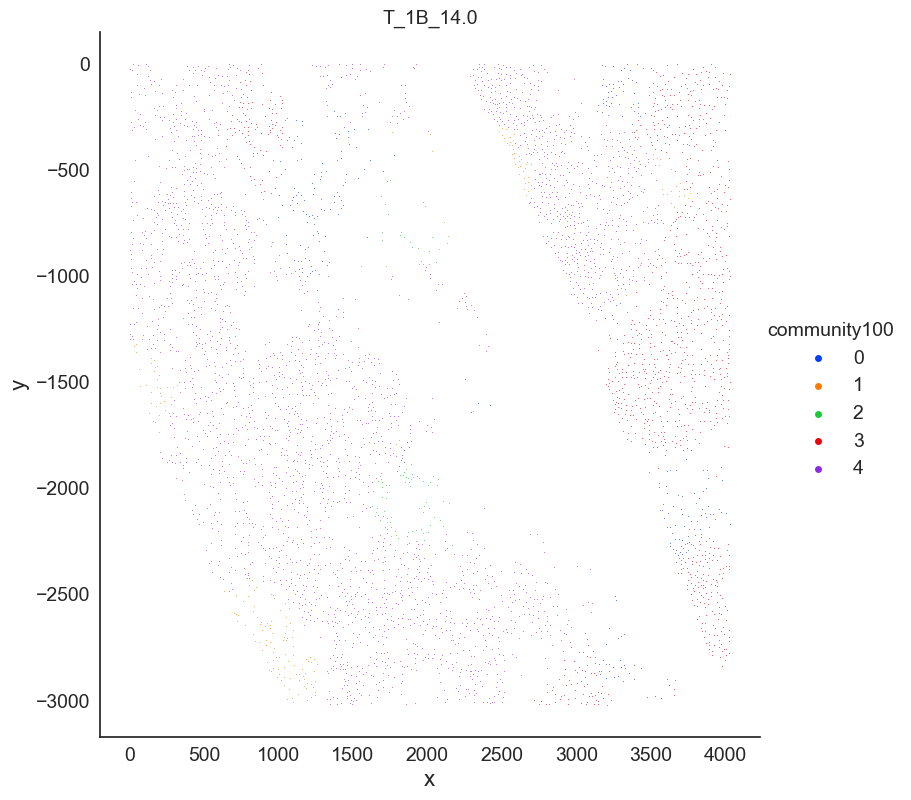

T_1B_15.0


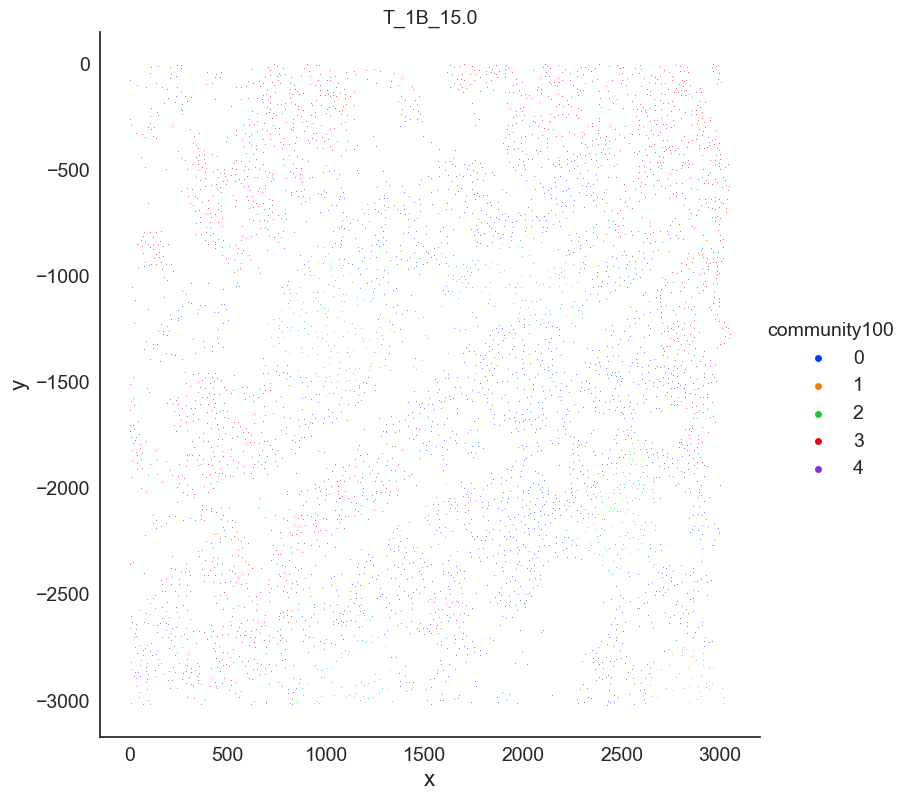

T_1B_16.0


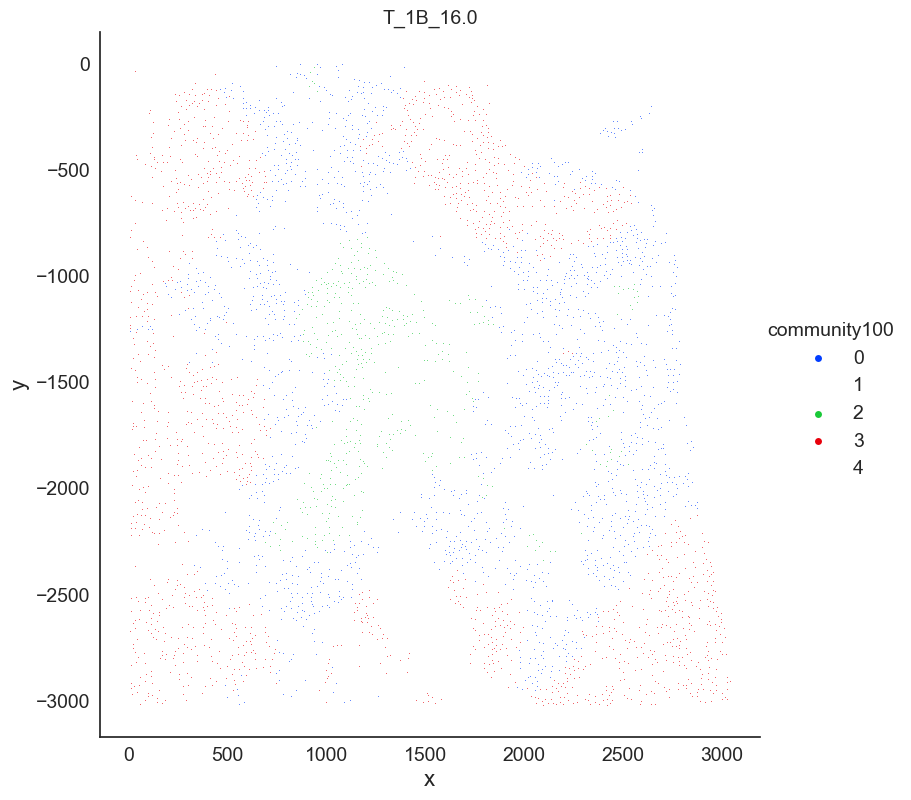

Control_1B_17.0


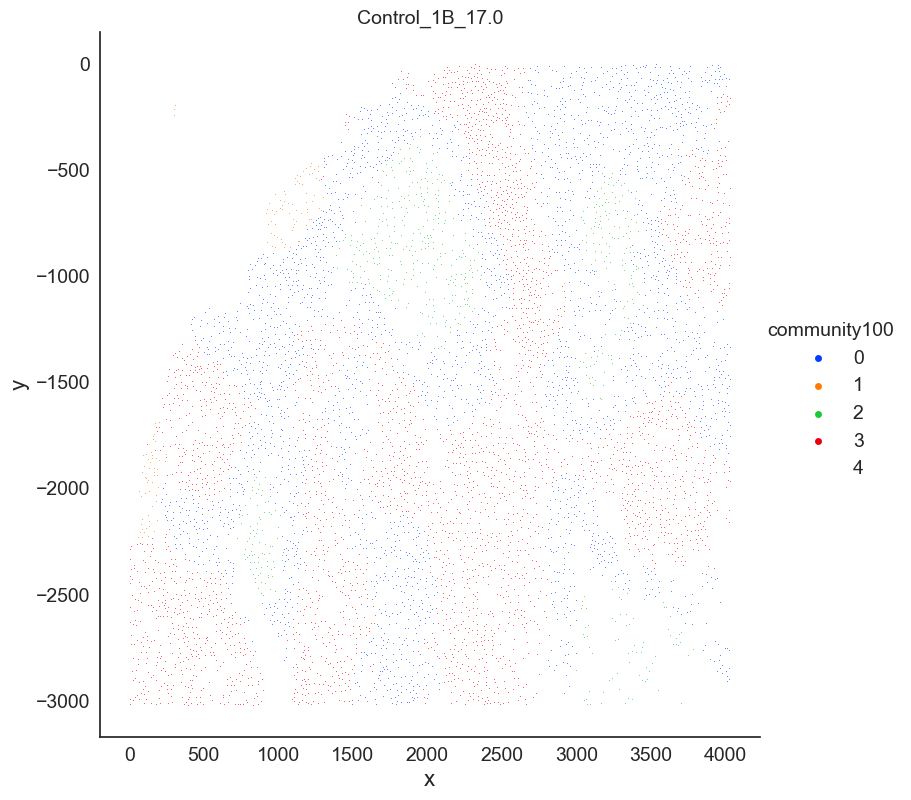

Control_1B_18.0


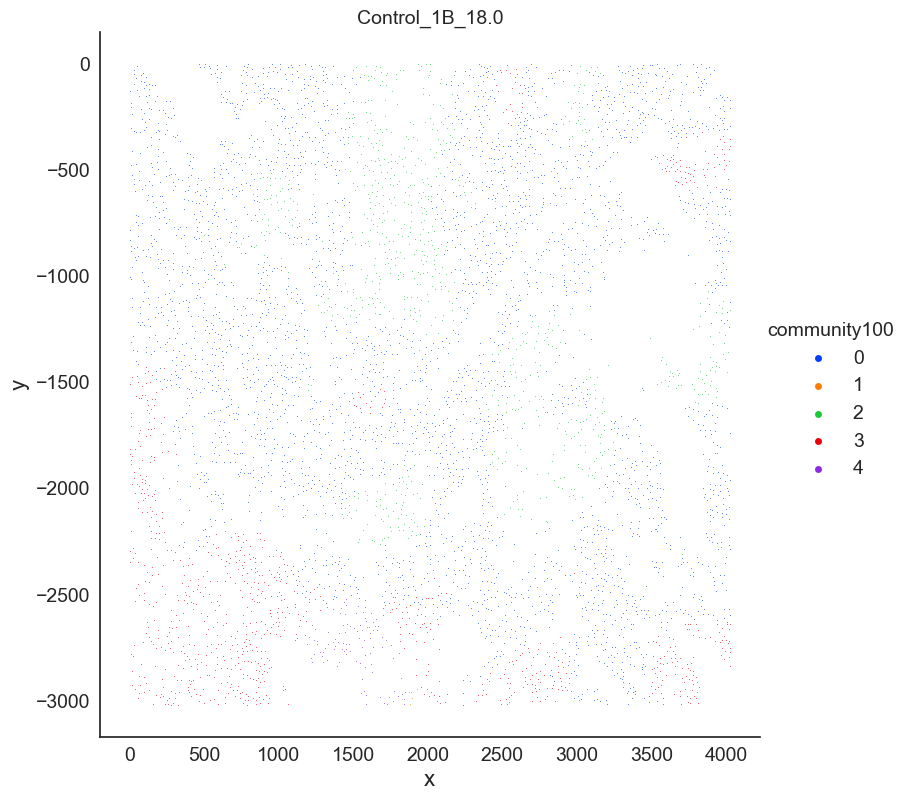

Control_1B_19.0


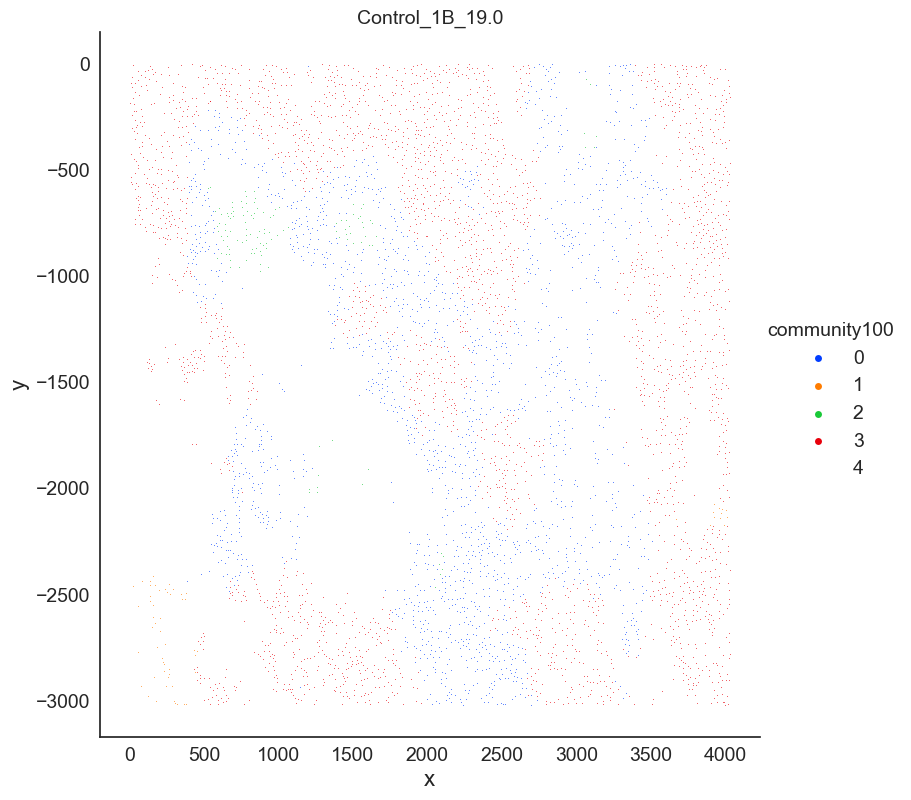

Control_2A_16.0


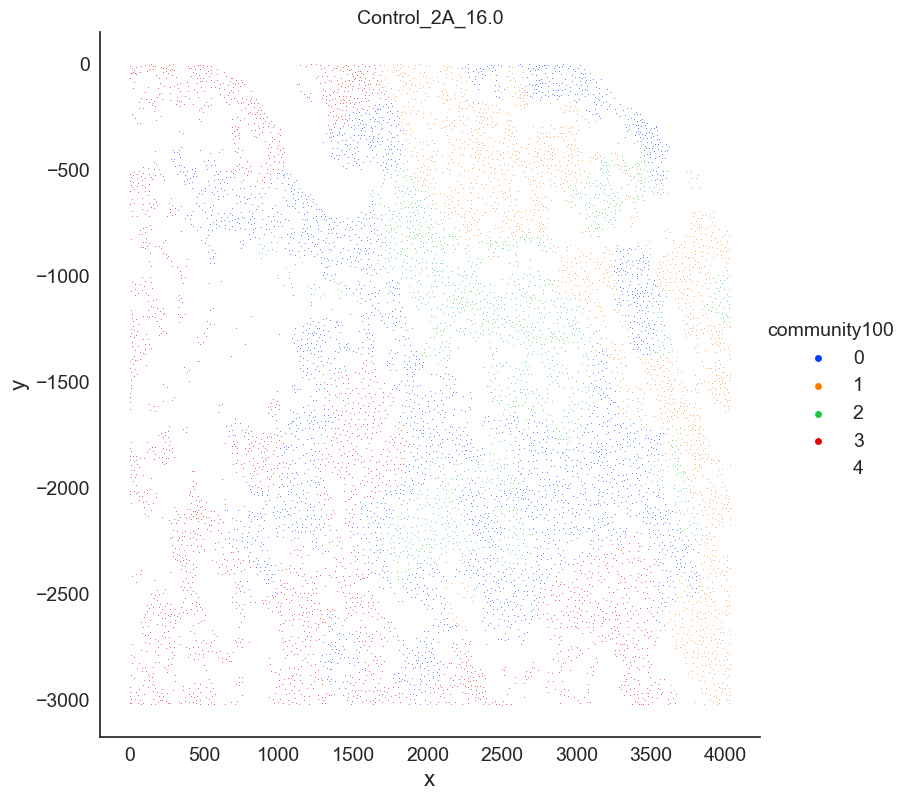

Control_2A_17.0


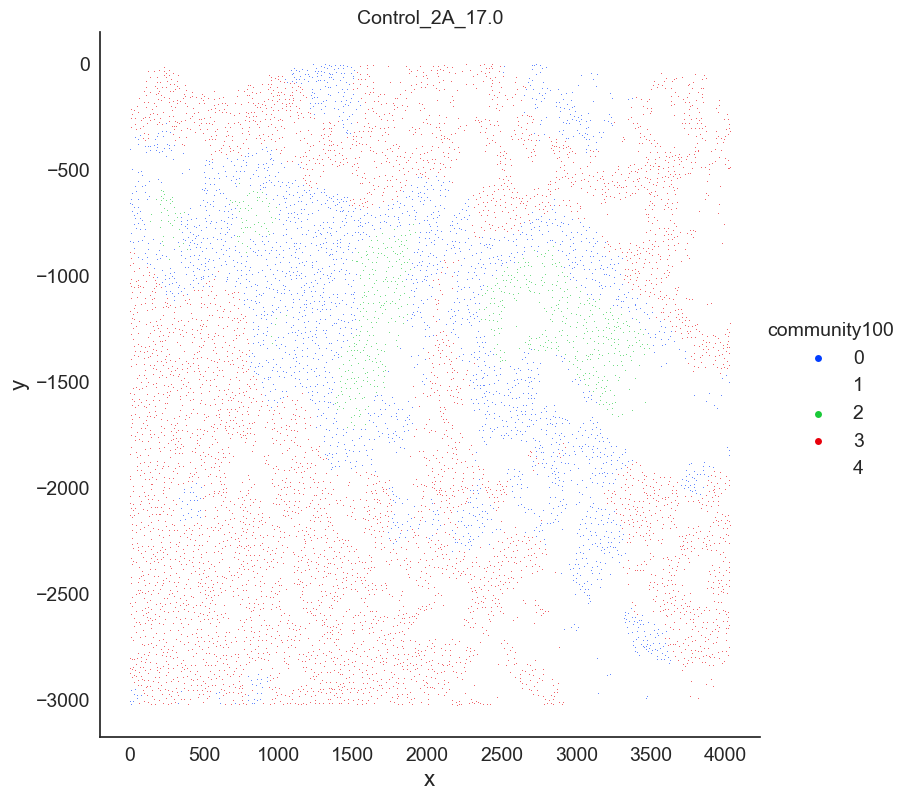

Control_2A_18.0


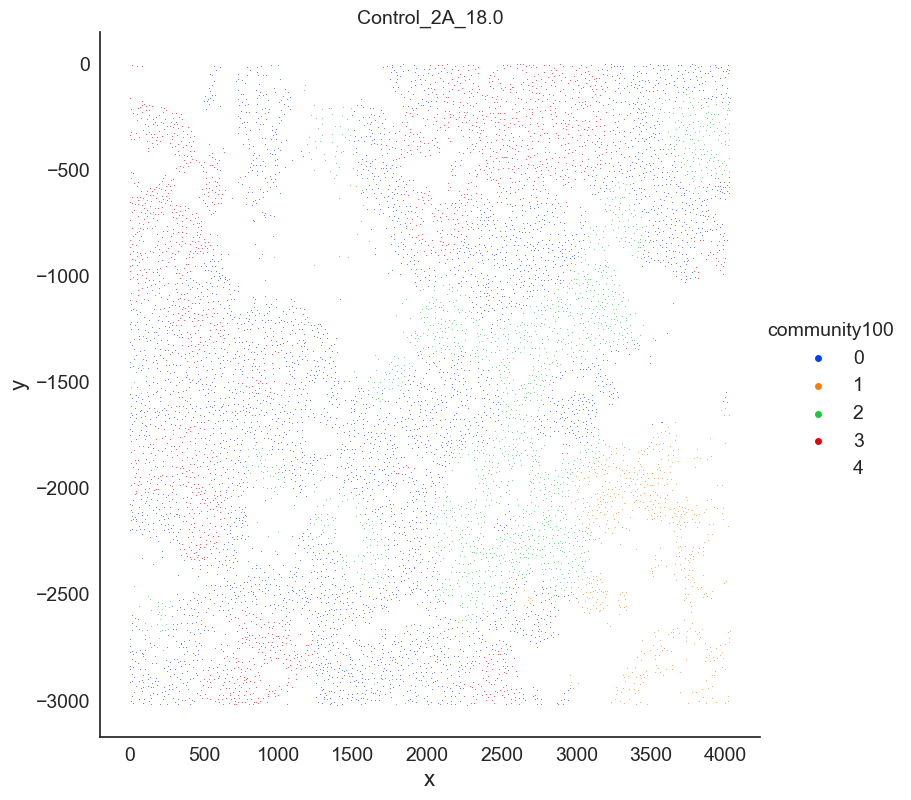

Control_2B_13.0


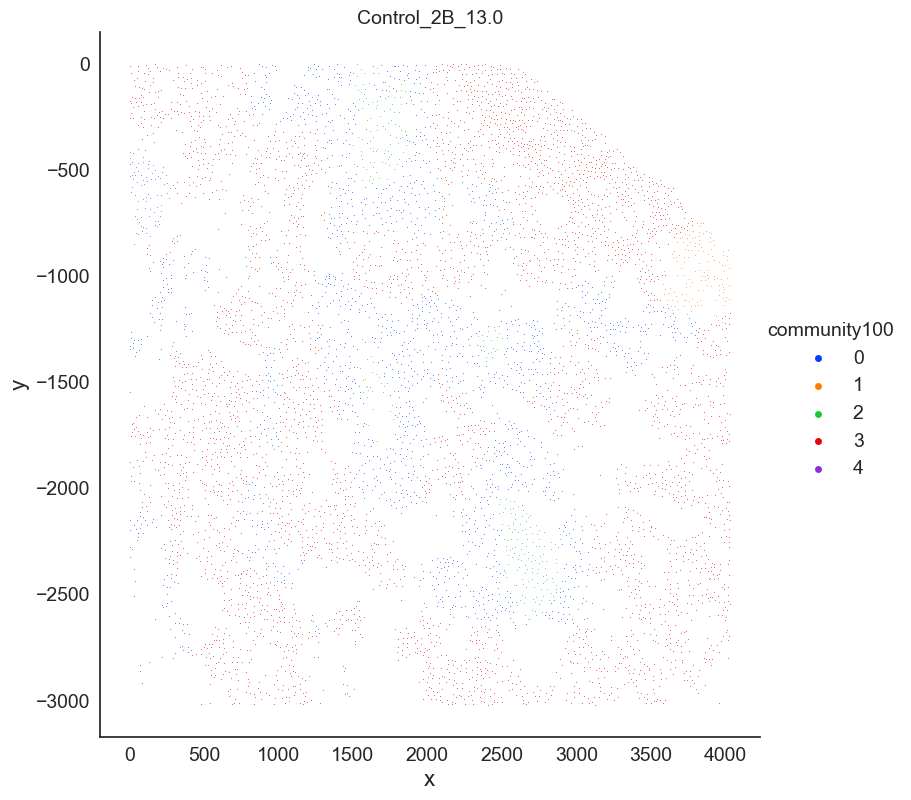

Control_2B_14.0


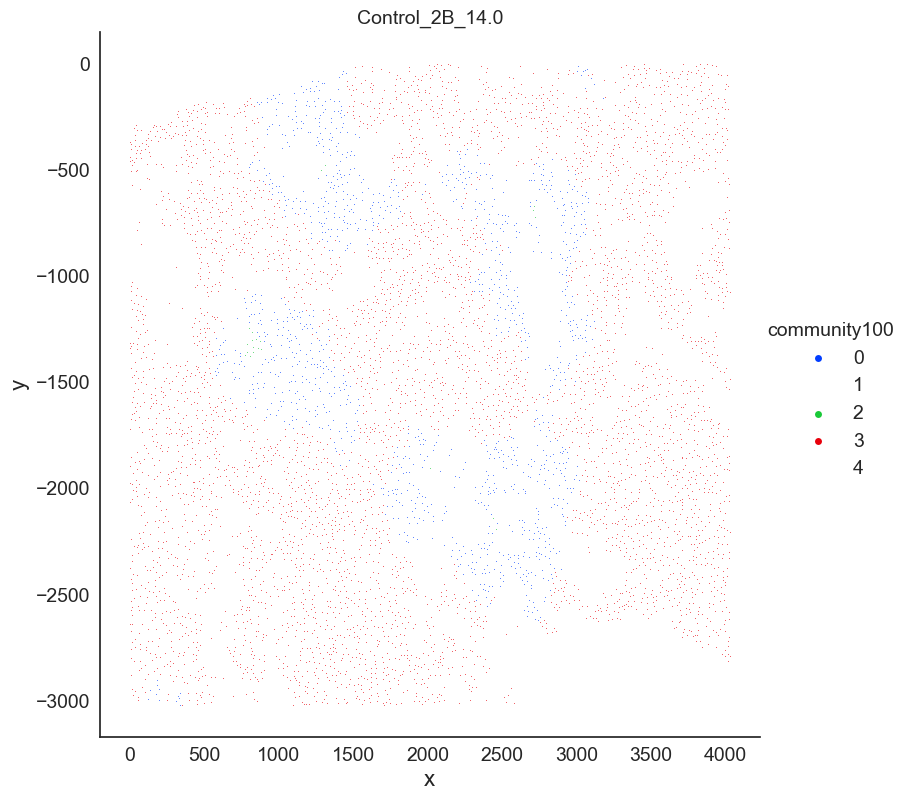

Control_2B_15.0


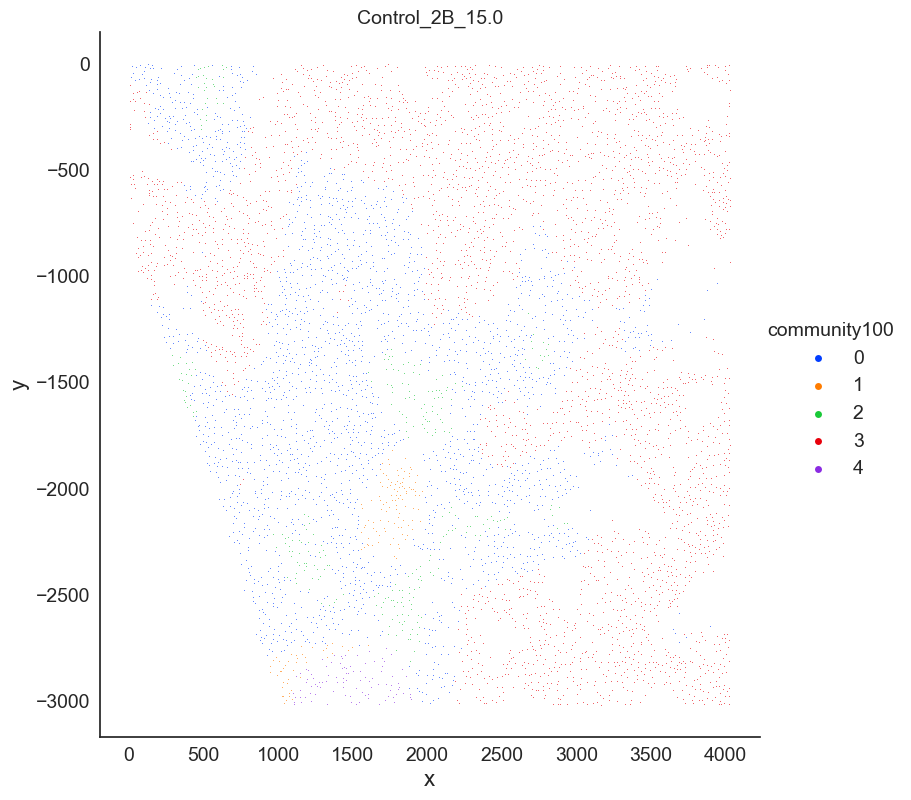

2HC_1


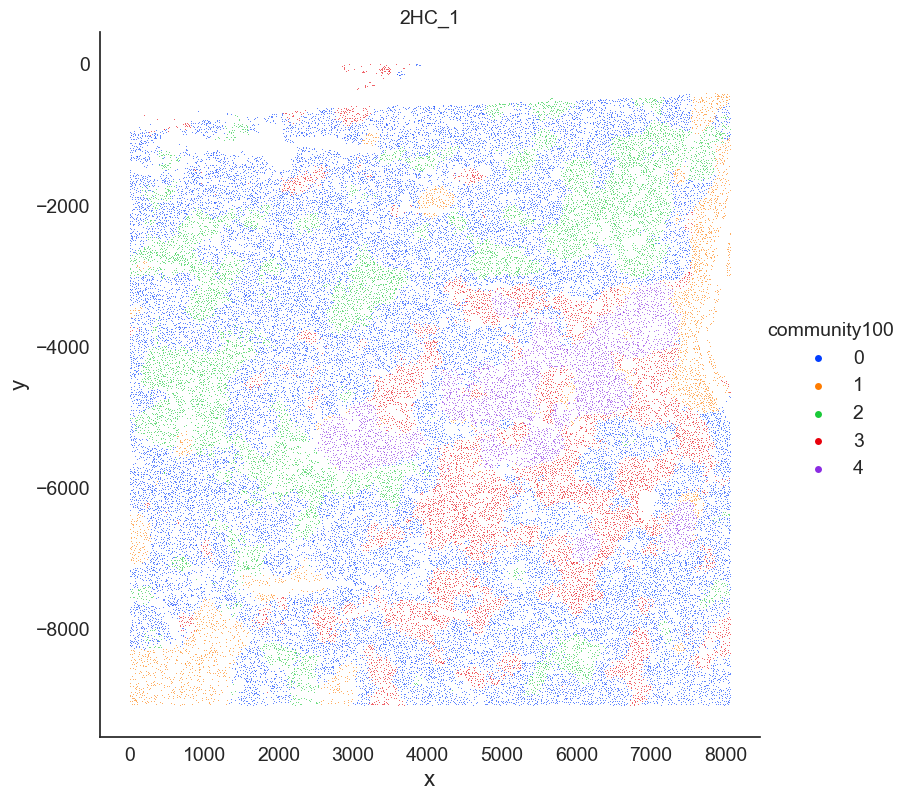

T_1


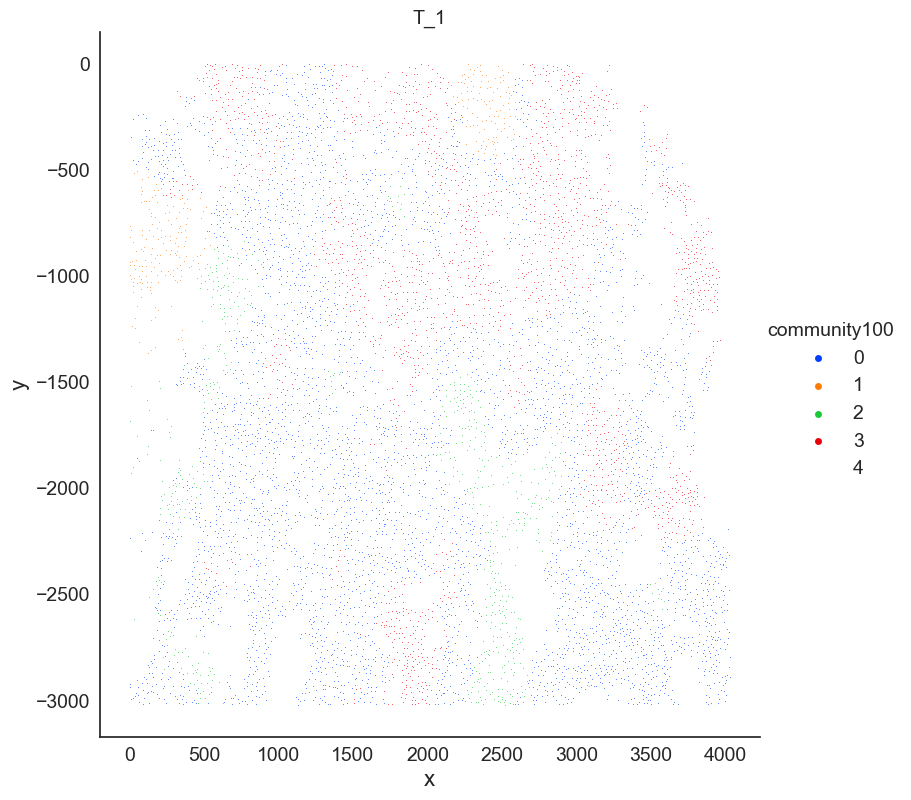

T_2


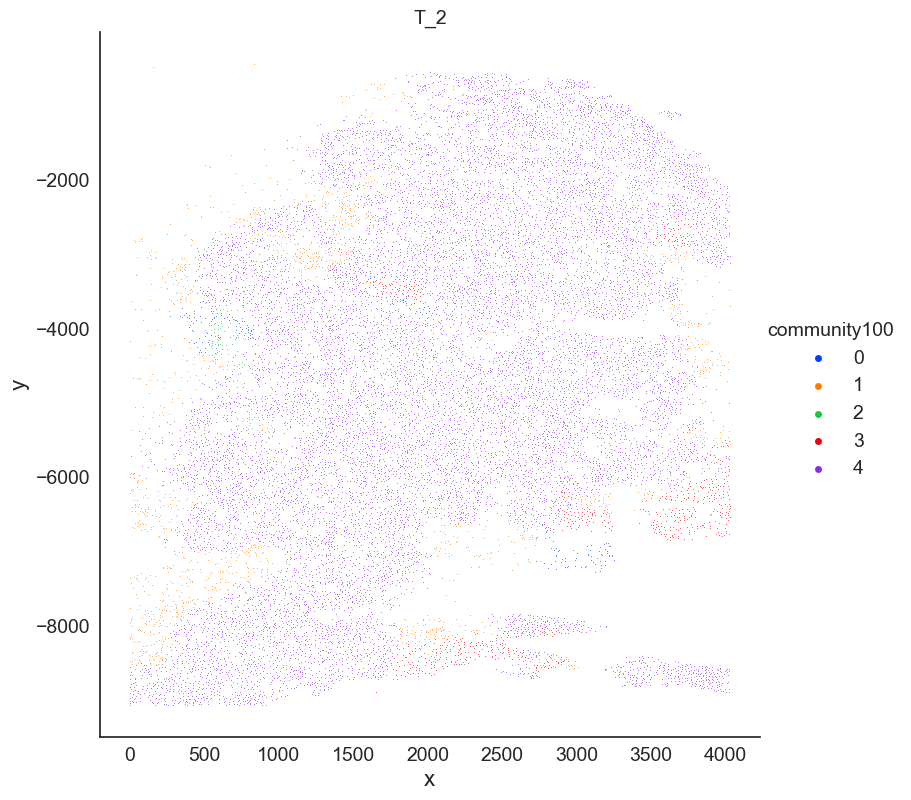

2HC_2


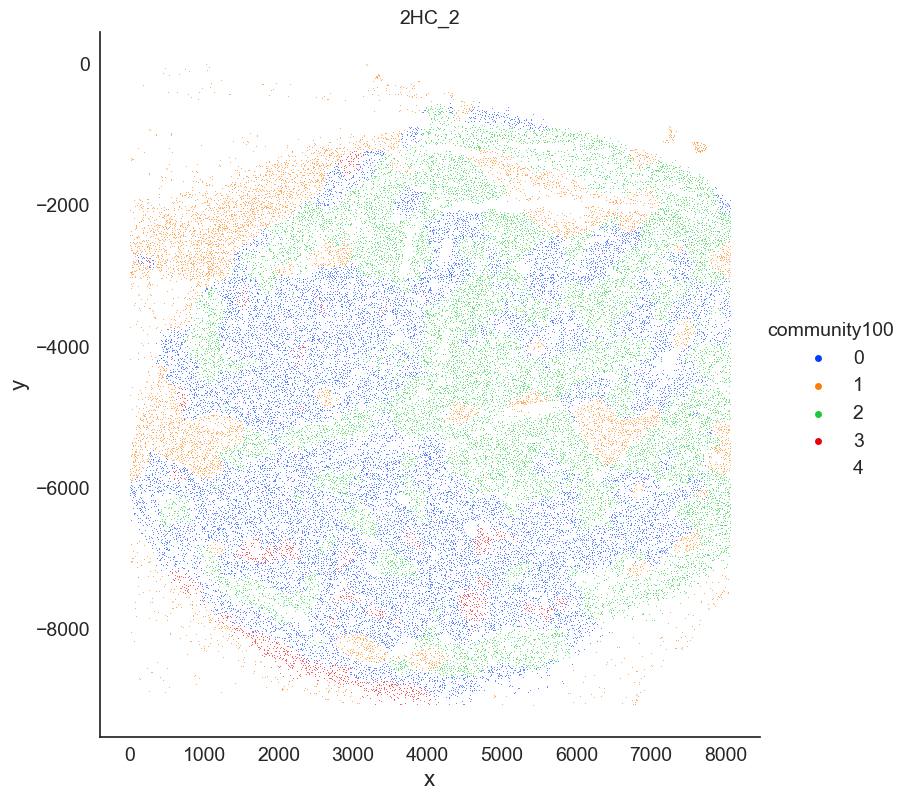

2HC_3


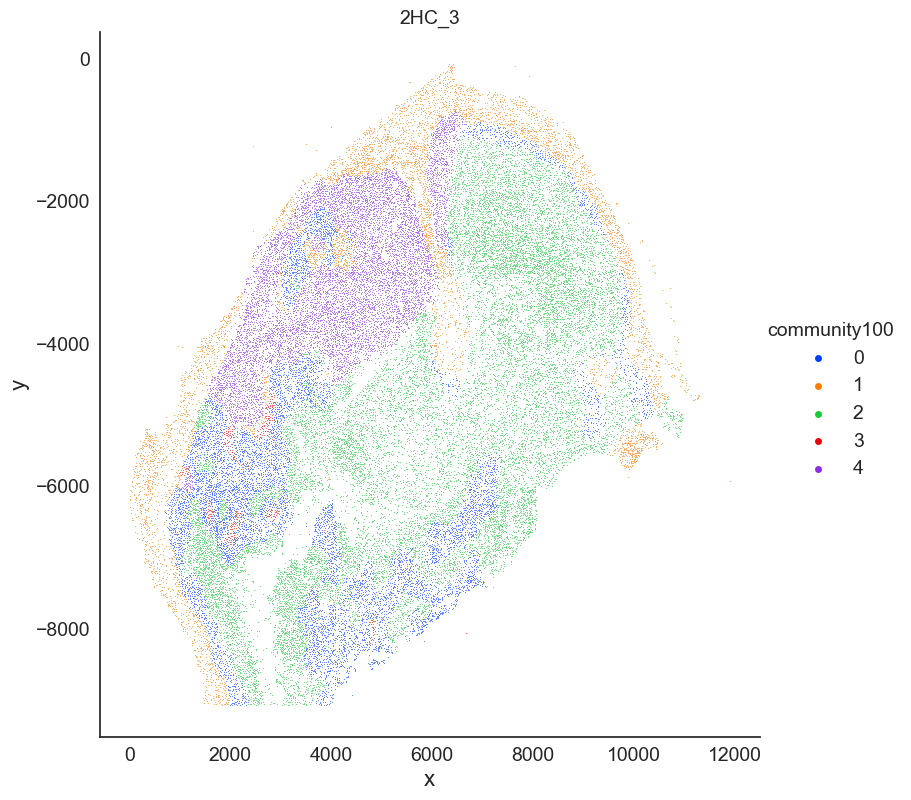

T_3


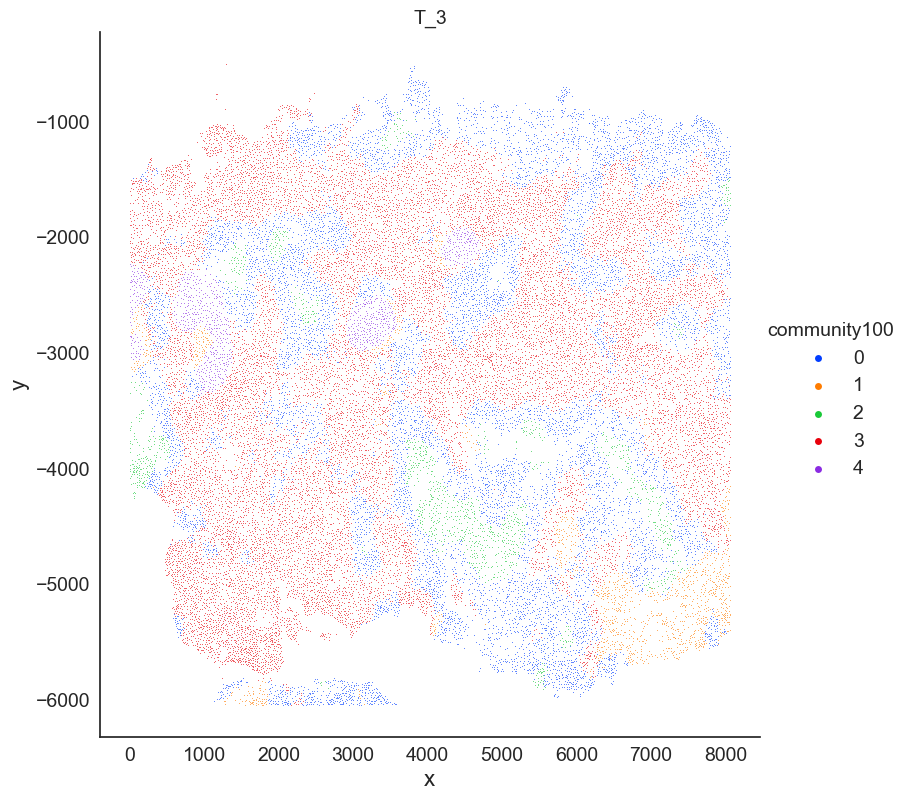

2HC_4


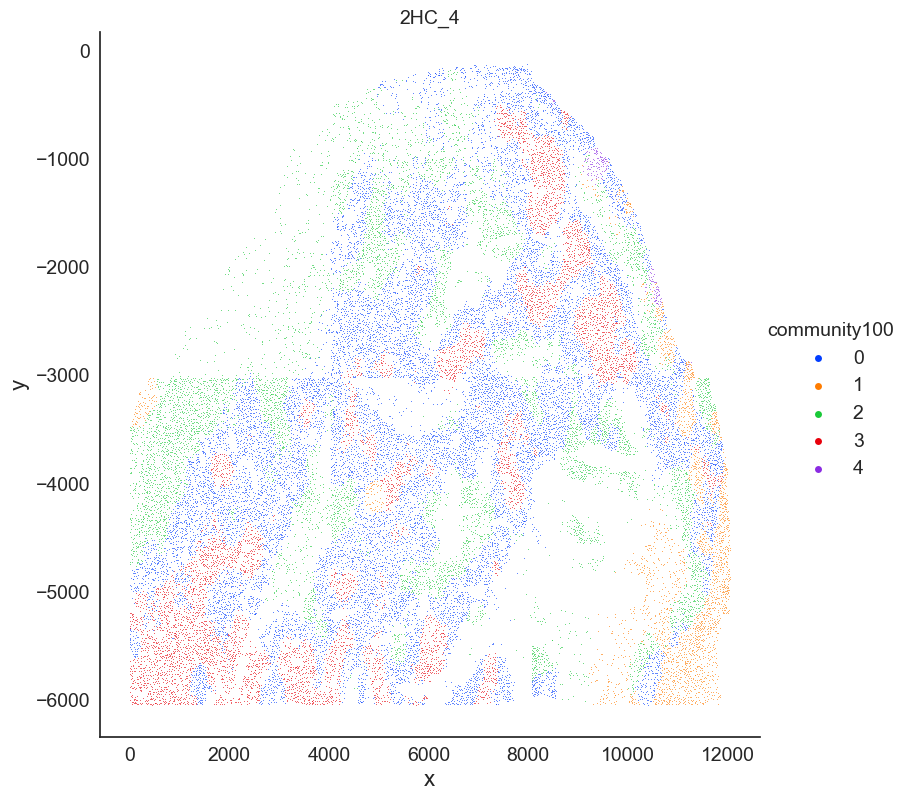

T_4


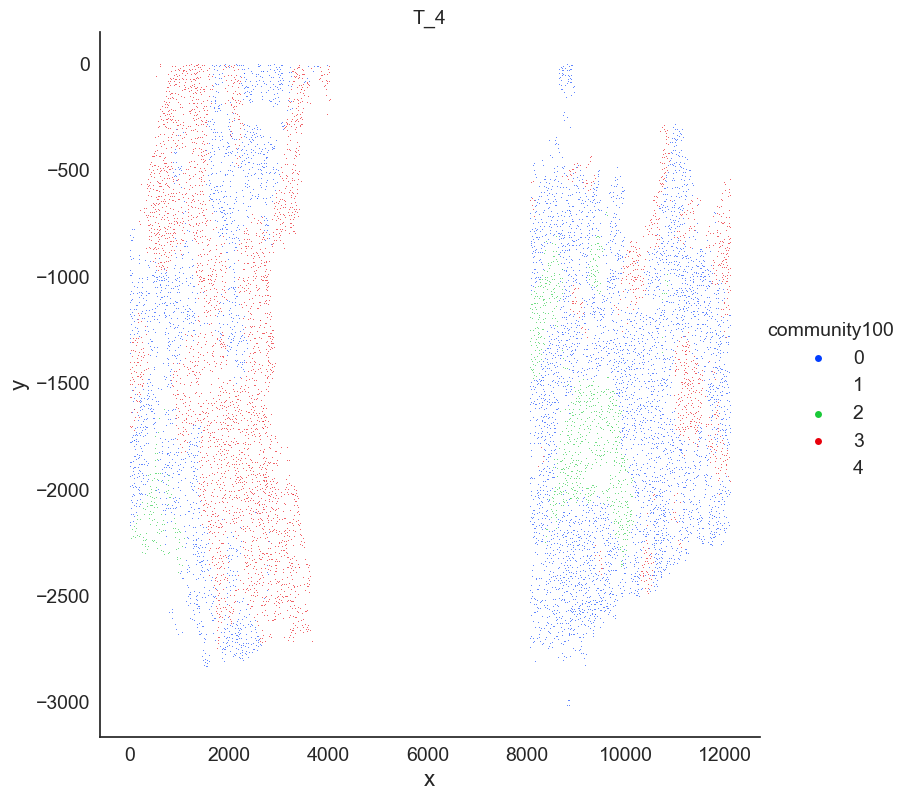

No_Irr_Cntrl_3


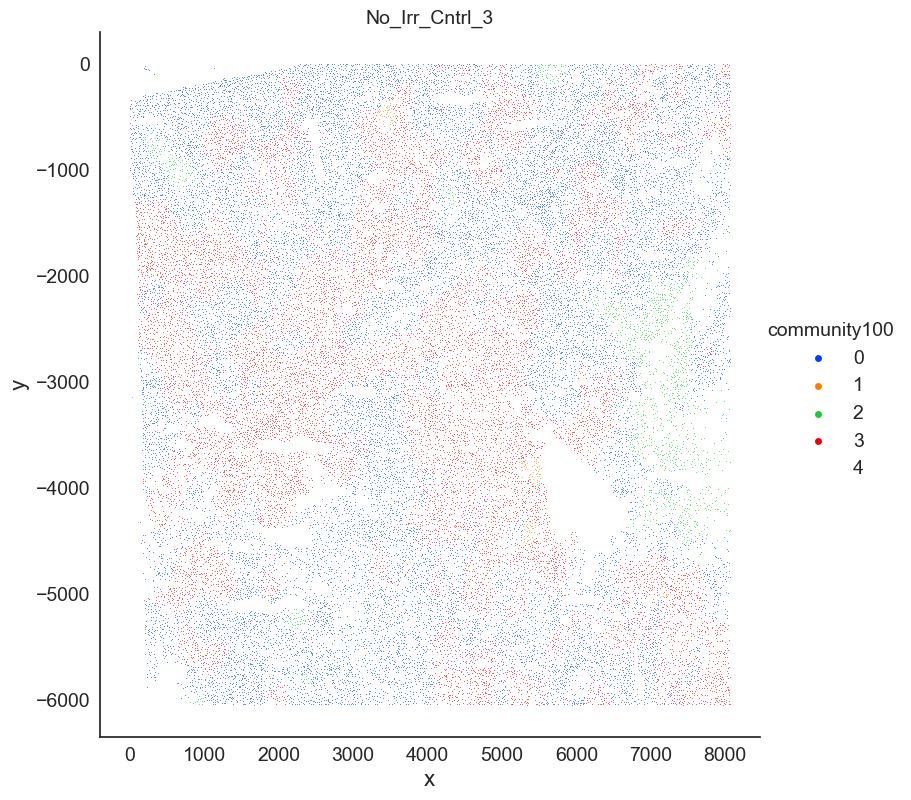

Cntrl_3_201124_TNTtumors2_1.0


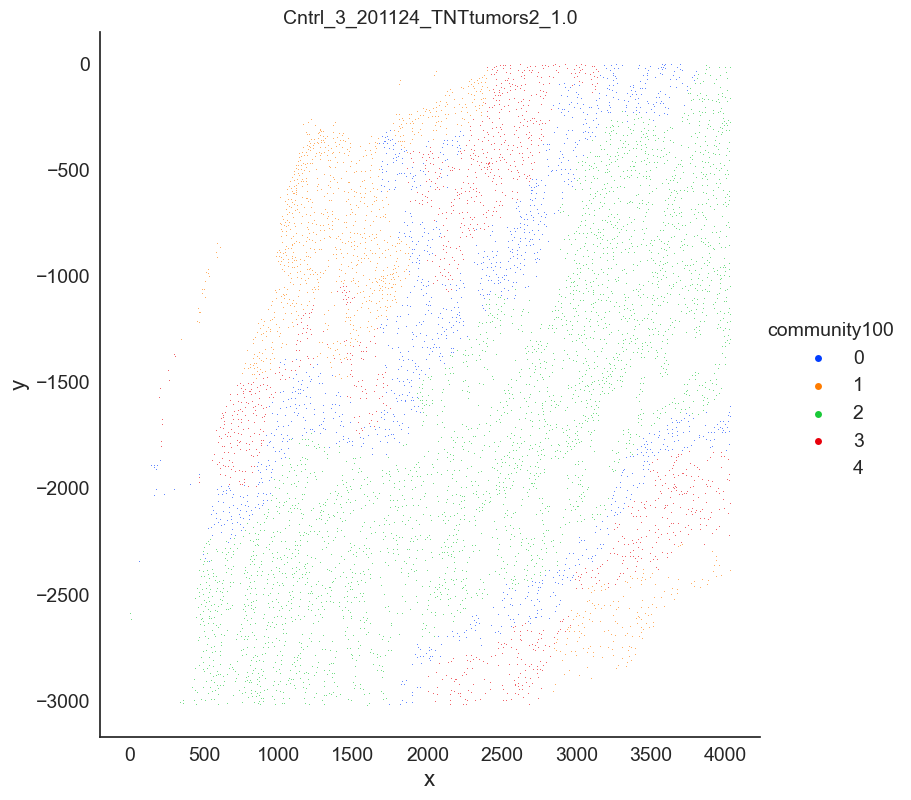

Cntrl_3_201124_TNTtumors2_2.0


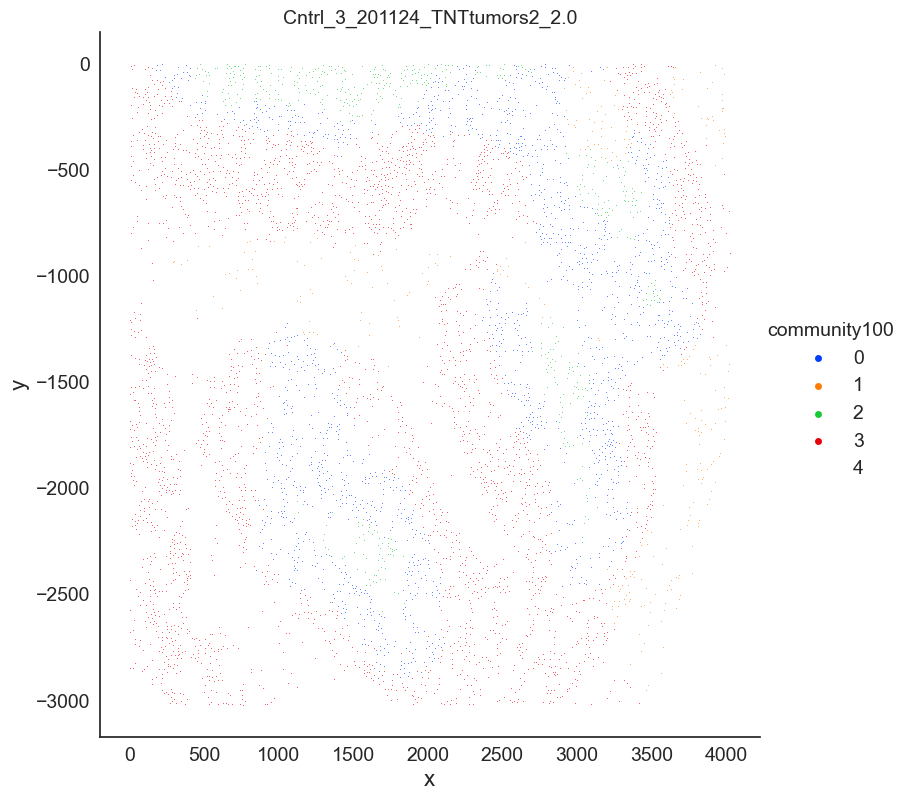

T_3_201124_TNTtumors2_3.0


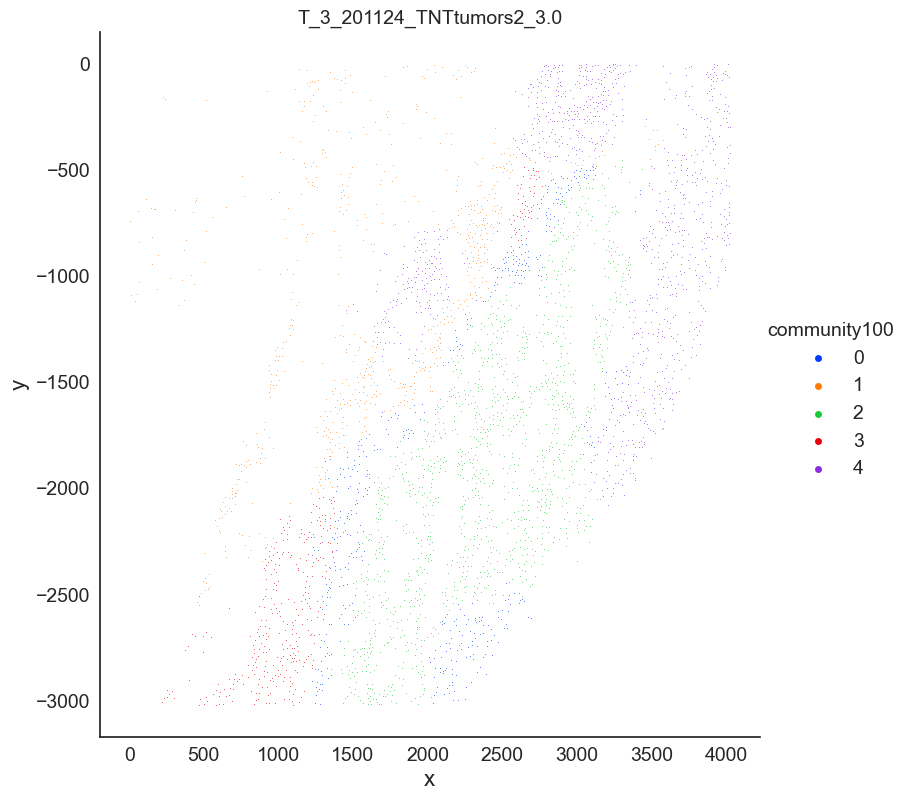

2HC_3_201124_TNTtumors2_4.0


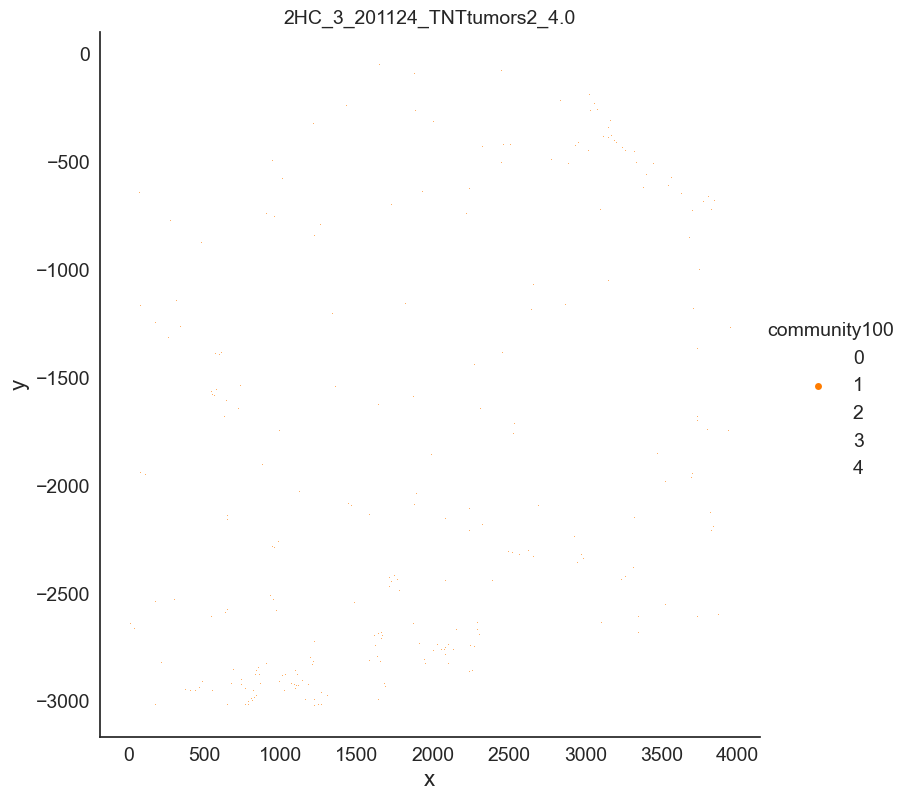

Cntrl_3_201125_TNTtumors2_1.0


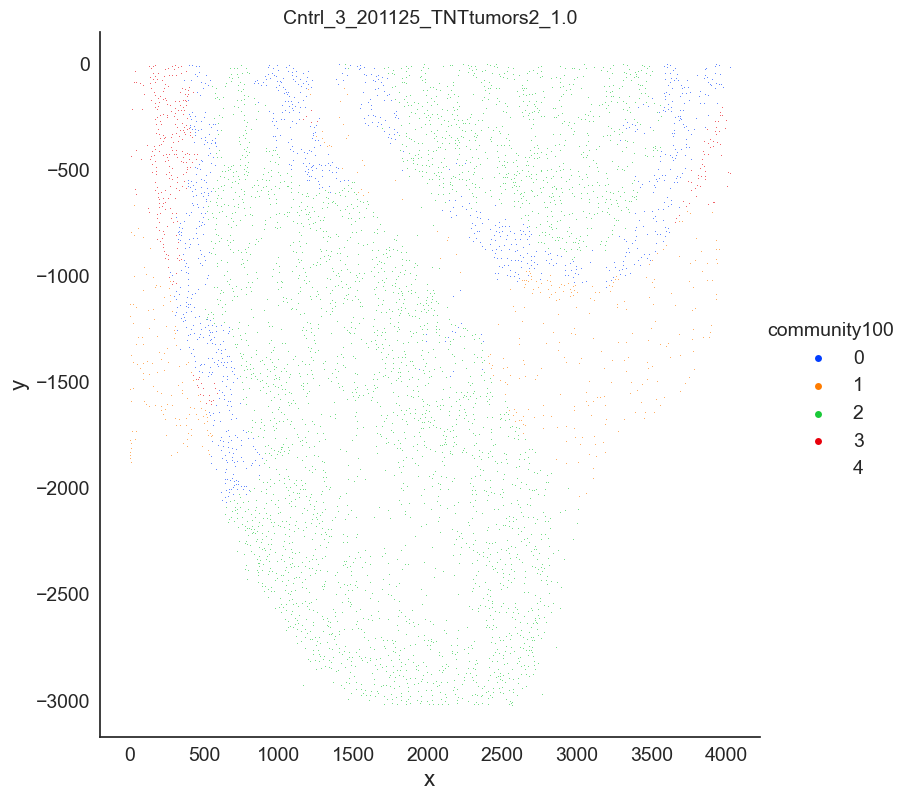

Cntrl_3_201125_TNTtumors2_2.0


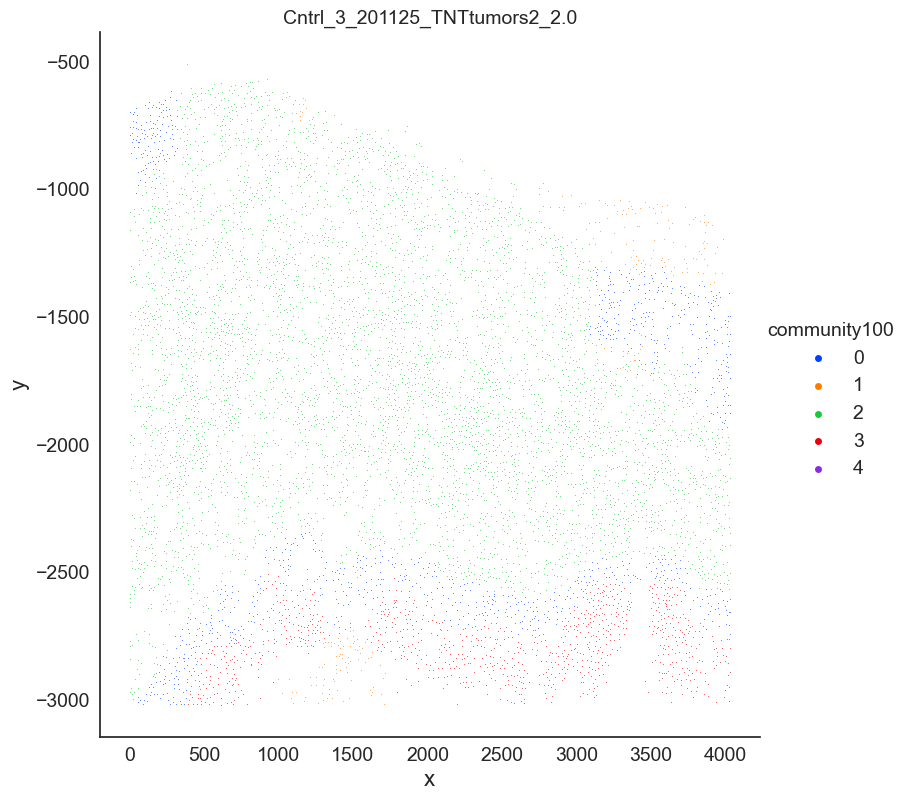

T_3_201125_TNTtumors2_3.0


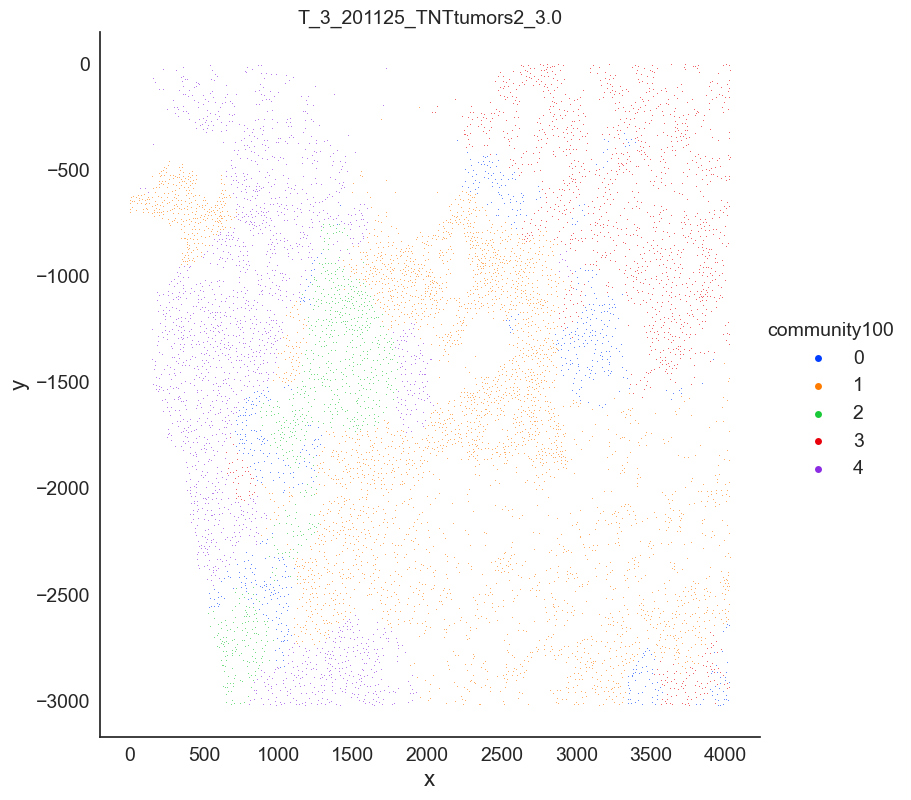

T_3_201125_TNTtumors2_4.0


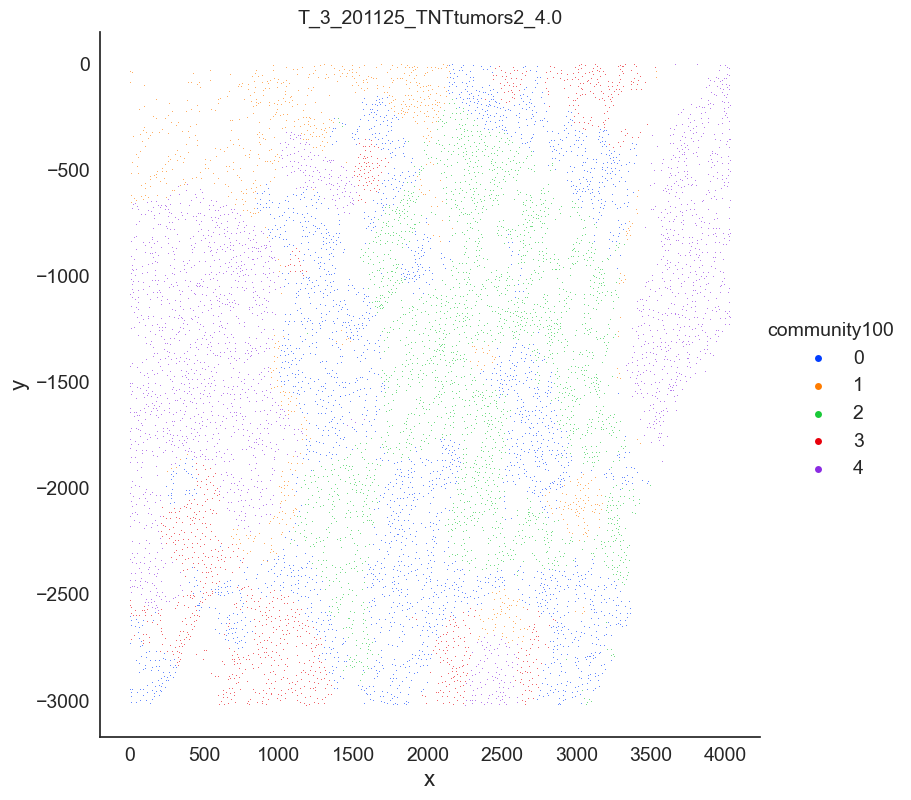

2HC_3_201125_TNTtumors2_5.0


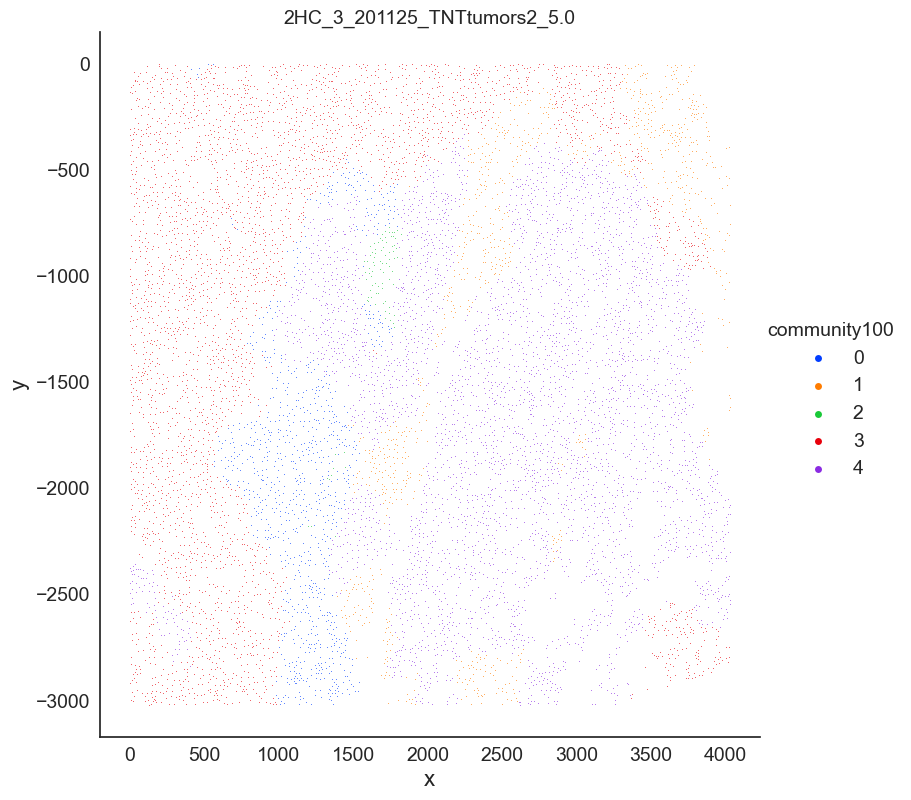

2HC_3_201125_TNTtumors2_6.0


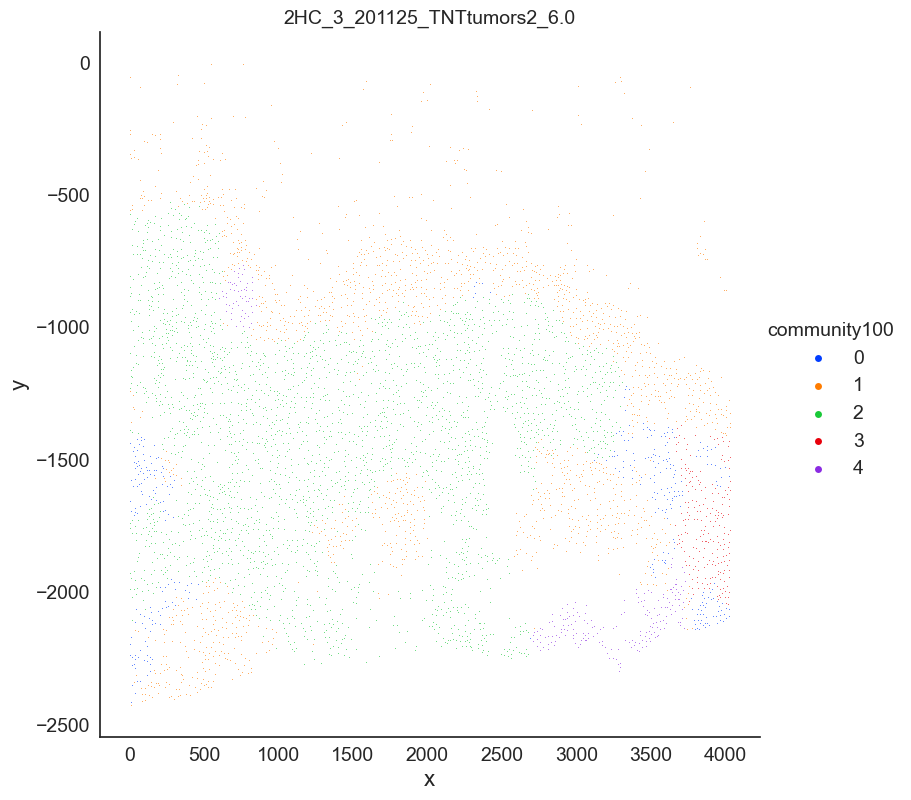

Cntrl_3_201121_TNTtumors2_1.0


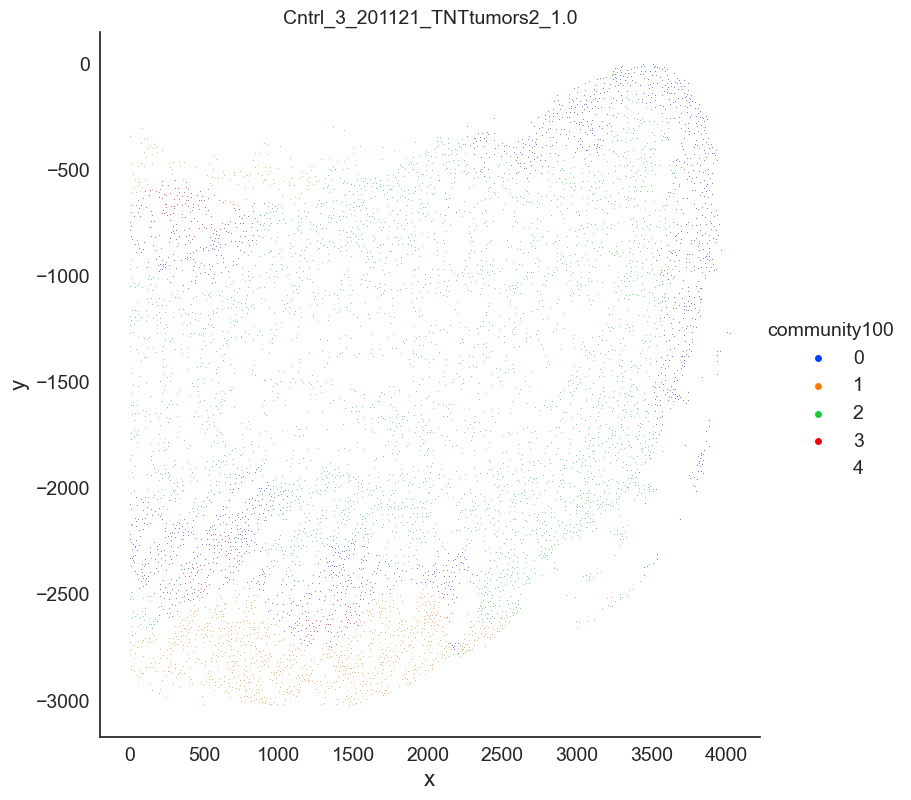

Cntrl_3_201121_TNTtumors2_2.0


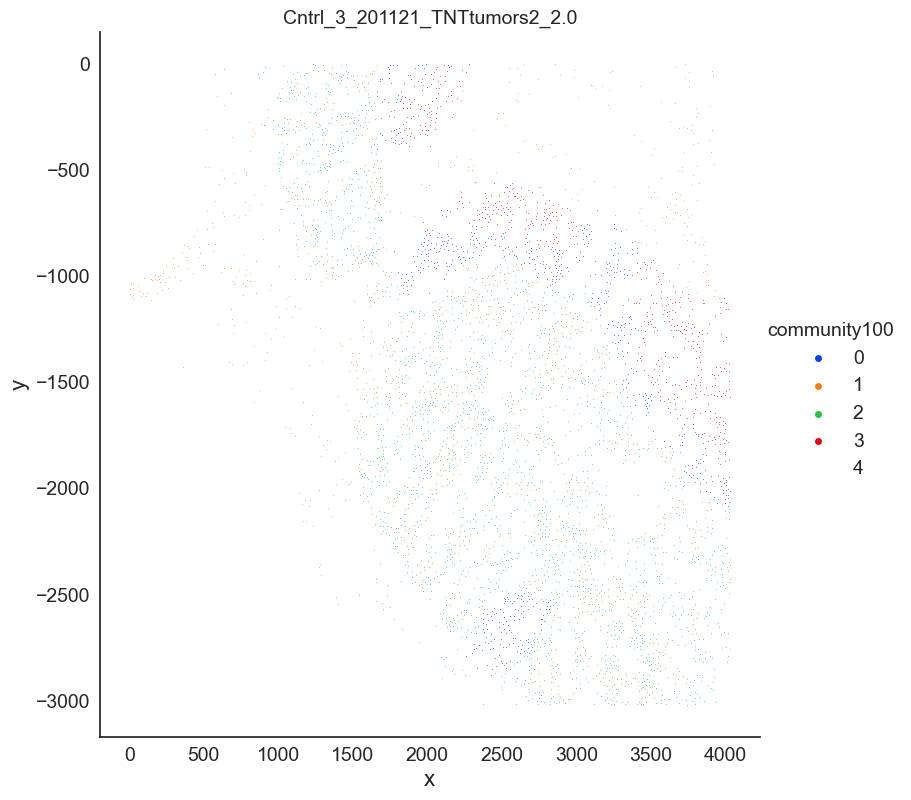

T_3_201121_TNTtumors2_3.0


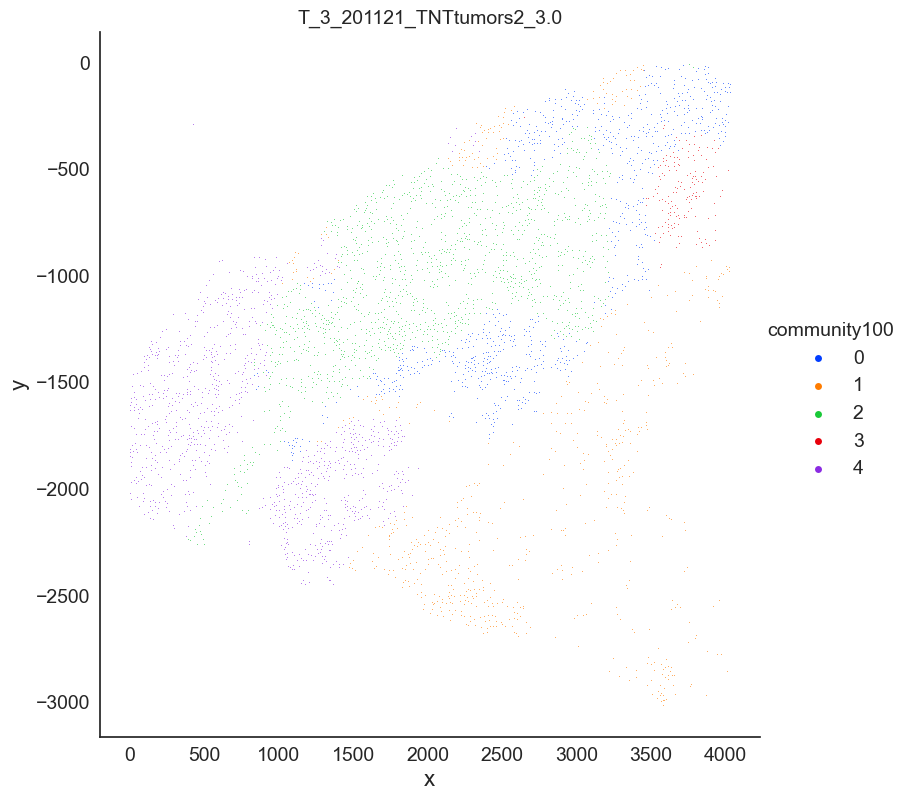

2HC_3_201121_TNTtumors2_4.0


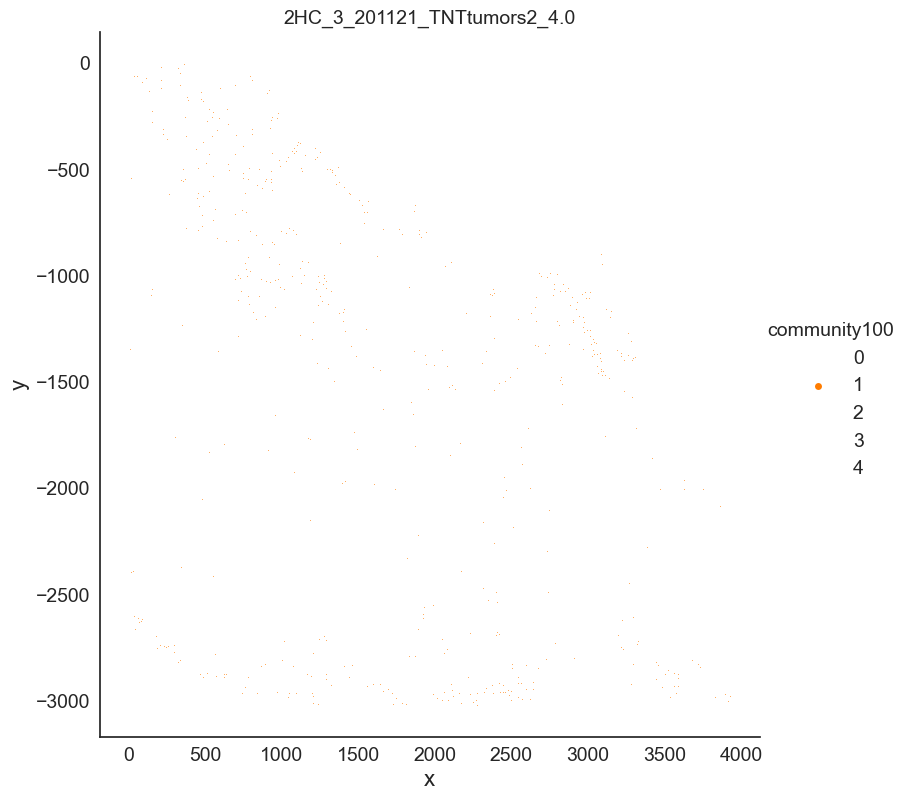

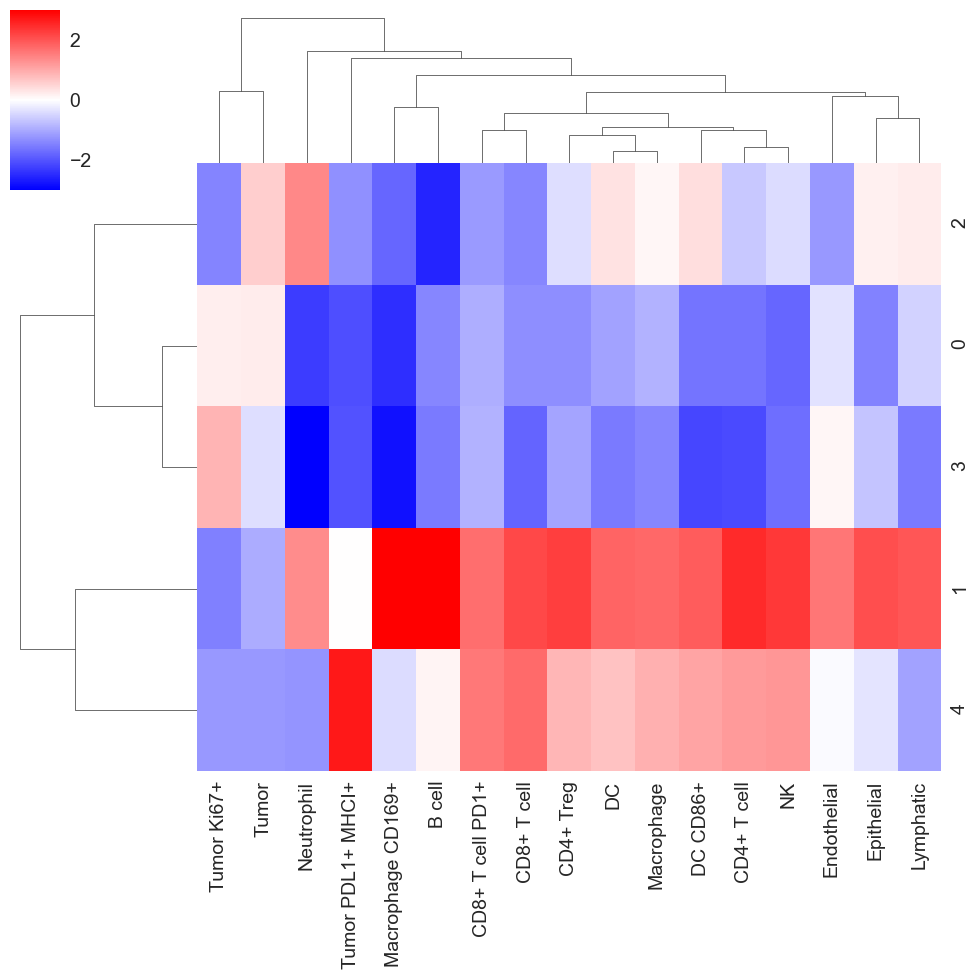

In [29]:
k_centroids = {}

cells_df2, neighborhood_name, k_centroids = tl_community_analysis_2(data = data, 
                        values = values, 
                        sum_cols = sum_cols, 
                        X = X, 
                        Y = Y, 
                        reg = reg, 
                        cluster_col = cluster_col_commun, 
                        k = k_commun, 
                        n_neighborhoods = n_communities_commun,
                        elbow = False)

pl_community_analysis_2(data = cells_df2, 
                        values = values, 
                        sum_cols = sum_cols, 
                        output_dir = output_dir, 
                        X = X, 
                        Y = Y, 
                        reg = reg, 
                        save_path = None, 
                        k = k_commun, 
                        neighborhood_name = neighborhood_name,
                        k_centroids = k_centroids,
                        plot_specific_community = None)



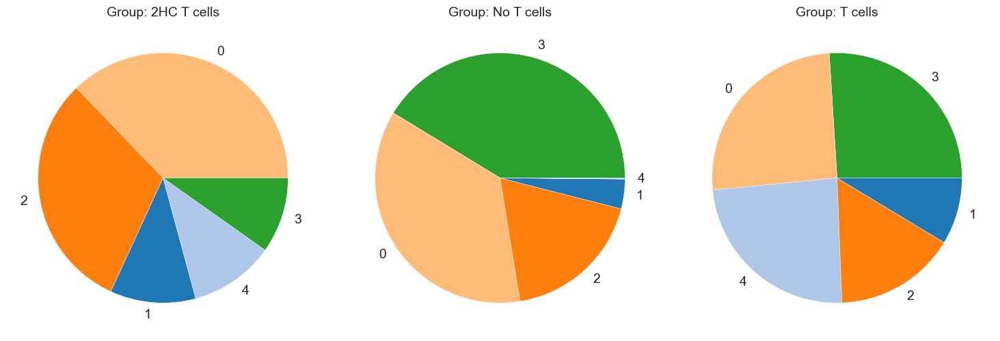

In [30]:
pl_create_pie_charts(cells_df2, "treatment", "community100", show_percentages=False)

Highlight specific neighborhoods to visualize how the spatial distribution differs between replicates. 

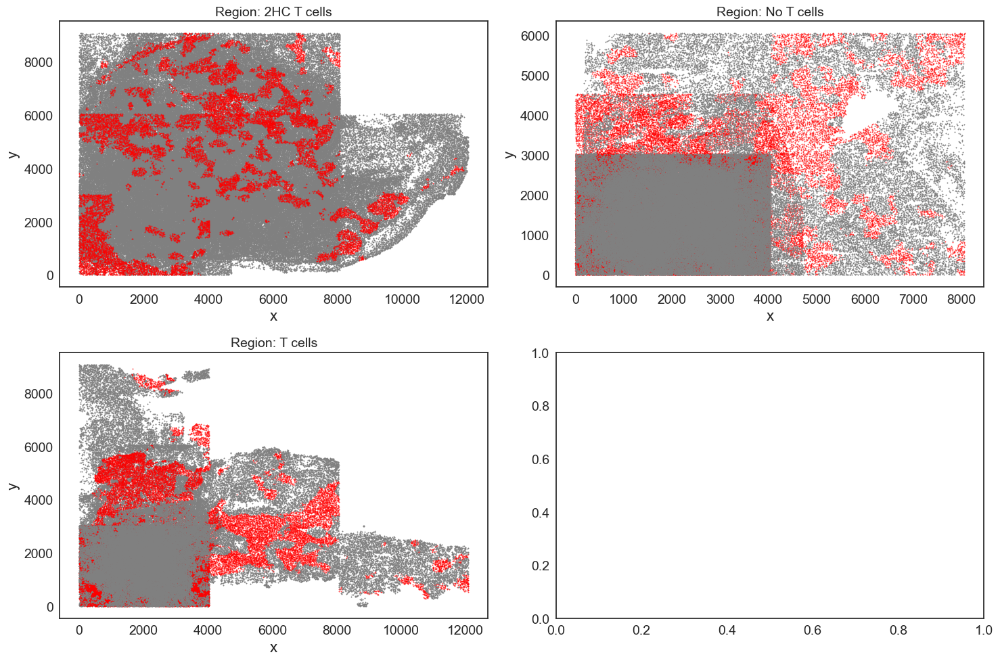

In [31]:
pl_highlighted_dot(cells_df2, 
                   x_col = "x", 
                   y_col = "y", 
                   group_col = 'community100', 
                   highlight_group = 3, 
                   highlight_color = "red", 
                   region_col= "treatment",
                   subset_col=None, 
                   subset_list=None)

Save the df with all calculations performed:

In [32]:
# Save progress 
cells_df2.to_csv(output_dir + "processed_df.csv") # save result for later

KeyboardInterrupt: 

# 4) Analysis dependent on neighborhood analysis

## 4.1) Specify additional column names

## 4.2) Cell Type Differential Enrichment

**How does the function work:**

**hf_cell_types_de_helper**

The hf_cell_types_de_helper function takes a pandas DataFrame (df), as
well as several column names and dictionaries as inputs, and performs
various data transformation operations on the input DataFrame to
generate several outputs.

The function first reads in the input DataFrame df and generates a
unique ID by concatenating two columns specified by the ID_component1
and ID_component2 inputs. It then creates a dictionary called neigh_num
that maps each unique value in the neighborhood_col column of the input
DataFrame to a unique integer index starting from 0. The function then
creates a new column called group by mapping each value in the group_col
column to its corresponding integer value from a dictionary called
group_dict.

The function then creates a new dictionary called pat_dict that maps
each unique value in the donor_tis column of the input DataFrame to a
unique integer index starting from 0. The function assigns these integer
indices to each patient in the donor_tis column, creating a new column
called patients. The function then drops duplicates from the patients
and group columns and creates a new dictionary called pat_to_gp that
maps each patient to their corresponding group.

The function then groups the input DataFrame by patients and calculates
the frequency of each value in the cell_type_col column for each
patient, normalized by the total number of cells for that patient. The
function stores the resulting DataFrame as ct_freq.

Finally, the function groups the input DataFrame by both patients and
neigh_num, and calculates the frequency of each value in the
cell_type_col column for each neighborhood and patient, normalized by
the total number of cells for that patient and neighborhood. The
function stores the resulting DataFrame as all_freqs.

The function returns several outputs, including the transformed input
DataFrame (cells2), the ct_freq and all_freqs DataFrames, as well as the
pat_to_gp and neigh_num dictionaries.

**cell_types_de**

This function performs differential enrichment analysis of cell types
between different neighborhoods in a tissue.

The function takes in several inputs, including cell type frequencies,
patient data, neighborhood data, and an output directory. The function
first normalizes overall cell type frequencies and neighborhood-specific
cell type frequencies, and then calculates differential enrichment for
all cell subsets using linear regression. It creates a heatmap to
visualize the changes in cell type frequencies across different
neighborhoods, with asterisks indicating statistical significance (p \<
0.05).

After correcting p-values for multiple testing, it generates a second
heatmap that is sorted by the sum of absolute values of coefficients in
each row and column. Finally, it saves the heatmap plot as a PNG file in
the specified output directory and returns the sum of absolute values of
coefficients in the sorted dataframe.

-   ct_freq: a pandas DataFrame with cell type frequencies for all
    samples
-   all_freqs: a pandas DataFrame with cell type frequencies and
    neighborhood information for all samples
-   neighborhood_num: the name of the column in all_freqs that contains
    the neighborhood information
-   nbs: a list of integers representing the neighborhoods to analyze
-   patients: a list of patient IDs to include in the analysis
-   group: a pandas Series with group information (0 or 1) for each
    sample
-   cells: a list of cell type names to analyze

cells1: a list of cell type names with neighborhood-specific information
to analyze

neigh_num: a dictionary mapping neighborhood numbers to names

output_dir: a string representing the output directory for the generated
plots

The function then performs several steps:

Normalize the overall cell type frequencies and the
neighborhood-specific cell type frequencies for the specified patient
IDs using the normalize function.

For each neighborhood in nbs, concatenate the normalized
neighborhood-specific cell type frequencies for the specified patient
IDs into a design matrix with a constant, group 0 or 1, and the
normalized overall cell type frequencies. Then, fit a linear regression
model to the neighborhood-specific cell type frequencies, where the
neighborhood-specific cell type frequencies are the outcome and the
design matrix is the predictor.

Store the p-values and coefficients for the group coefficient in each
linear regression model in a dictionary.

Correct the p-values for multiple testing (this step is currently
missing in the code).

Create a heatmap of the coefficients for each cell type and
neighborhood, using the sns.heatmap function.

Sort the rows and columns of the heatmap by the absolute sum of the
coefficients across neighborhoods and cell types.

Add asterisks to the heatmap for any cell type and neighborhood
combination where the p-value is less than 0.05.

Save the heatmap as a PNG file in the specified output directory.

Return the sum of the absolute values of the coefficients in the sorted
heatmap.

**What is the biological meaning of this analysis:**

Identifies cell populations that statistical significantly differ
between CNs

In [33]:
print(df["treatment"].unique())

['2HC T cells' 'No T cells' 'T cells']


In [36]:
# Arguments for cell type differential enrichment analysis:

ID_component1 = 'tissue'

ID_component2 = 'treatment'

neighborhood_col = 'neighborhood20'

group_col = 'treatment'

group_dict = {'2HC T cells':0, 'No T cells':1, "T cells":2}

cell_type_col = 'original cell type'

neighborhood_col_number = 'neigh_num'

review this function - it is too complicated!

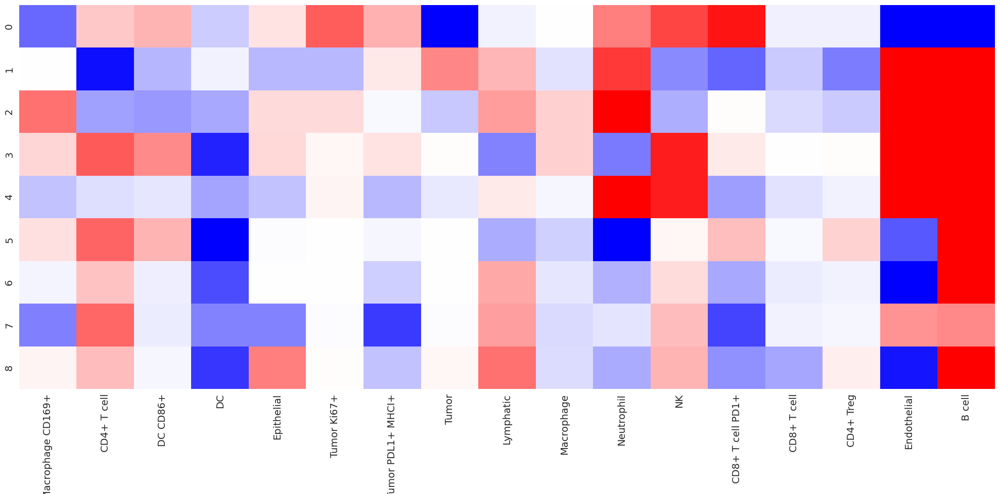

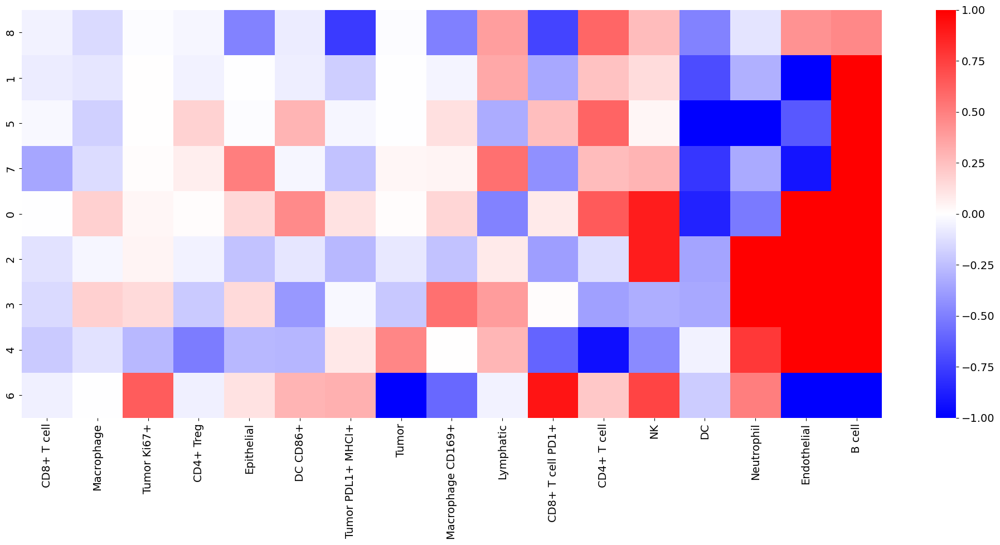

In [37]:
cells2, ct_freq, all_freqs, pat_to_gp, neigh_num = hf_cell_types_de_helper(df = cells_df, \
                                                                        ID_component1 = ID_component1, \
                                                                        ID_component2 = ID_component2, \
                                                                        neighborhood_col = neighborhood_col, \
                                                                        group_col = group_col, \
                                                                        group_dict = group_dict, \
                                                                        cell_type_col = cell_type_col)

nbs = list(cells2[neighborhood_col_number].unique())
patients = list(cells2['patients'].unique()) 
group = pd.Series(pat_to_gp)
cells = list(cells2['original cell type'].unique())
#cells = ['Tumor','CD4+ Treg']

cells1 = cells.copy()
cells1.append('patients')
cells1

dat, pvals = tl_cell_types_de(ct_freq = ct_freq, 
                              all_freqs = all_freqs, 
                              neighborhood_num = neighborhood_col_number, 
                              nbs = nbs, 
                              patients = patients, # change name to unique ID --> patient might be misleading 
                              group = group, 
                              cells = cells, 
                              cells1 = cells1)

pl_cell_types_de(data = dat,
                 pvals = pvals, 
                 neigh_num = neigh_num, 
                 output_dir = output_dir)

## 5.3) Canonical Correlation Analysis (CCA)
**NOT WORKING**

**How does the function work:**

**What is the biological meaning of this analysis:**

Neighborhoods/Communities influence each other. This communication can
be described as correlation. Correlation can either be analyzed on the
single cell level (occurence of cell type A in neighborhood 1 is
negative/positive correlated with its occurence in neighborhood 2 - this
can then also be compared between conditions e.g good/bad prognosis for
cancer type xxx -\> alteratiions in CN communication might be implecated
in better/worse antitumoral immune responses etc...) or on the level of
multiple celltypes.

Canonical Correlation Analysis (CCA) looks at the frequency of multiple
cell types (or neighborhoods). The idea is to build inter-CN
communication networks. These networks can be visualized as graphs.

In [160]:
# Arguments for CCA:

ID_component1 = 'experiment'

ID_component2 = 'treatment'

neighborhood_col = 'neighborhood11'

Get rid of that function

In [161]:
# Prepare IDs this could for example be the combination of patient ID and tissue type. Apart from that, the function assigns a number to each name from the neighborhood column
cells_df = hf_prepare_neighborhood_df2(cells_df, 
                                   neighborhood_column = neighborhood_col, 
                                   patient_ID_component1 = ID_component1, 
                                   patient_ID_component2 = ID_component2) # this is a helper function 


You assigned following identifiers to the column 'patients':
['02_20_2HC T cells' '02_20_No T cells' '02_20_T cells' '04_21_T cells'
 '04_21_No T cells' '08_21_2HC T cells' '08_21_T cells' '08_21_No T cells'
 '11_20_No T cells' '11_20_T cells' '11_20_2HC T cells']

You assigned following numbers to the column 'neigh_num'. Each number represents one neighborhood:
[0 1 2 3 4 5 6 7 8]


In [175]:
# devide IDs/patients into groups
patient_to_group_dict = cells_df.loc[:,['unique_ID',ID_component2]].drop_duplicates().set_index('unique_ID').to_dict()[ID_component2]
print(patient_to_group_dict)
group1_patients = [a for a,Sample in patient_to_group_dict.items() if Sample=='2HC T cells']
#group2_patients = [a for a,Sample_type in patient_to_group_dict.items() if Sample_type=='Resection']
print(group1_patients)

{'02_20_2HC T cells': '2HC T cells', '02_20_No T cells': 'No T cells', '02_20_T cells': 'T cells', '04_21_T cells': 'T cells', '04_21_No T cells': 'No T cells', '08_21_2HC T cells': '2HC T cells', '08_21_T cells': 'T cells', '08_21_No T cells': 'No T cells', '11_20_No T cells': 'No T cells', '11_20_T cells': 'T cells', '11_20_2HC T cells': '2HC T cells'}
['02_20_2HC T cells', '08_21_2HC T cells', '11_20_2HC T cells']


In [166]:
n_perms = 5000 # set number of permutation params

#subsets = ['CD4+ T cell']
subsets = None

In [167]:
# Provide user feedback
print(group1_patients)

# select which neighborhoods and functional subsets
cns = list(cells_df['neigh_num'].unique())
print(cns)

#log (1e-3 +  neighborhood specific cell type frequency) of functional subsets) ('nsctf')
if subsets != None:
    nsctf = np.log(1e-3 + cells_df.groupby(['unique_ID','neigh_num'])[subsets].mean().reset_index().set_index(['neigh_num','unique_ID']))
    print(nsctf)
else:
    nsctf = np.log(1e-3 + cells_df.groupby(['unique_ID','neigh_num']).mean().reset_index().set_index(['neigh_num','unique_ID']))
    print(nsctf)

cca = CCA(n_components=1,max_iter = 5000)
func = pearsonr


['02_20_2HC T cells', '08_21_2HC T cells', '11_20_2HC T cells']
[0, 1, 2, 3, 4, 5, 6, 7, 8]
                             Unnamed: 0     KLRG1       CD69      CD19  \
neigh_num patients                                                       
0         02_20_2HC T cells    9.235788  7.622347  10.104120  5.006724   
1         02_20_2HC T cells    9.112745  7.862552  10.194202  5.199118   
2         02_20_2HC T cells    8.834374  7.138586  10.133552  4.776140   
3         02_20_2HC T cells    8.615779  7.013810  10.153202  4.777084   
4         02_20_2HC T cells    9.235342  6.963066   9.822205  5.244150   
...                                 ...       ...        ...       ...   
          11_20_T cells       12.188685  0.084351   6.958789 -0.132251   
5         11_20_T cells       12.243522  0.096618   7.133827 -0.232696   
6         11_20_T cells       12.137346  0.043143   7.037732 -0.572000   
7         11_20_T cells       12.210852  0.100569   7.042902 -0.399684   
8         11_20_T ce

/var/folders/6d/0x48qjh15rx9851lpdwvrxvc0000gn/T/ipykernel_74563/1069085352.py:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  nsctf = np.log(1e-3 + cells_df.groupby(['patients','neigh_num']).mean().reset_index().set_index(['neigh_num','patients']))
/Users/timnoahkempchen/opt/anaconda3/envs/spatial_analysis_environment/lib/python3.10/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


In [168]:
nsctf.index

MultiIndex([(0, '02_20_2HC T cells'),
            (1, '02_20_2HC T cells'),
            (2, '02_20_2HC T cells'),
            (3, '02_20_2HC T cells'),
            (4, '02_20_2HC T cells'),
            (5, '02_20_2HC T cells'),
            (6, '02_20_2HC T cells'),
            (7, '02_20_2HC T cells'),
            (8, '02_20_2HC T cells'),
            (0,  '02_20_No T cells'),
            (1,  '02_20_No T cells'),
            (2,  '02_20_No T cells'),
            (3,  '02_20_No T cells'),
            (4,  '02_20_No T cells'),
            (5,  '02_20_No T cells'),
            (6,  '02_20_No T cells'),
            (7,  '02_20_No T cells'),
            (8,  '02_20_No T cells'),
            (0,     '02_20_T cells'),
            (1,     '02_20_T cells'),
            (2,     '02_20_T cells'),
            (3,     '02_20_T cells'),
            (4,     '02_20_T cells'),
            (5,     '02_20_T cells'),
            (6,     '02_20_T cells'),
            (7,     '02_20_T cells'),
            

In [170]:
# Run CCA
stats_group = tl_Perform_CCA(cca = cca, 
                          n_perms = n_perms, 
                          nsctf = nsctf, 
                          cns = cns, 
                          subsets = subsets, 
                          group = group1_patients)


0 1
0 2
0 3
0 4
0 5
0 6
0 7
0 8
1 2
1 3
1 4
1 5
1 6
1 7
1 8
2 3
2 4
2 5
2 6
2 7
2 8
3 4
3 5
3 6
3 7
3 8
4 5
4 6
4 7
4 8
5 6
5 7
5 8
6 7
6 8
7 8


In [171]:
# OPTIONAL

# print the name/number key for every neighborhood 
# Display DataFrames

# Using Zip method
ans = zip(cells_df.neighborhood11,cells_df.neigh_num)

# Converting it into list
ans = list(ans)

# Converting it into dictionary
ans = dict(ans)

# Display ans
print("Result of apply:\n",ans,"\n")


Result of apply:
 {5: 0, 7: 1, 8: 2, 2: 3, 6: 4, 0: 5, 1: 6, 3: 7, 4: 8} 



Original key list is : [0, 1, 2, 3, 4, 5, 6, 7, 8]
Categories (9, int64): [0, 1, 2, 3, ..., 5, 6, 7, 8]
Original value list is : ['#58BEEF', '#92E97C', '#B3063B', '#61992A', '#026FF7', '#B8F640', '#8147EC', '#877134', '#116505']
Resultant dictionary is : {0: '#58BEEF', 1: '#92E97C', 2: '#B3063B', 3: '#61992A', 4: '#026FF7', 5: '#B8F640', 6: '#8147EC', 7: '#877134', 8: '#116505'}


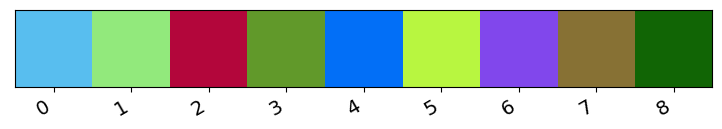

In [172]:
# OPTIONAL

# This function provides a random color palette - If you want a specific color for your neighborhoods, just provide a list of color
# provide a list with names colors are mapped on (usually cell types, categories or neighborhoods)
neighb_names = cells_df['neigh_num'].unique()

# provide a list of colors (same length as names list) or generate a random collection of colors
neighb_colors = hf_generate_random_colors(n = len(neighb_names))


# combine both lists into a dictionary 
color_dic_neighb = hf_assign_colors(neighb_names, neighb_colors)


KeyError: 9

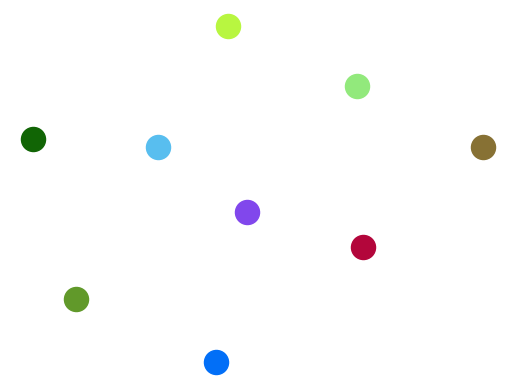

In [174]:
# Visulize CCA
pl_Visulize_CCA_results(CCA_results = stats_group, 
                     save_fig = False, 
                     output_dir = output_dir, 
                     save_name = "CCA_vis.png", 
                     p_thresh = 0.05, 
                     colors = color_dic_neighb)


## 5.4) Tensor decomposition
**NOT WORKING**

**How does the function work:**

Description from original paper:

The tensor of CN-cell type distributions for each patient, with dimensions patients x cell types x CNs, was produced by computing the frequency of each cell type in each CN in the non-follicular compartments (i.e., all CNs except CN-5). This tensor was split along the patient direction by patient group (CLR and DII). Non-negative Tucker decomposition as implemented in the Tensorly Python package was applied to each tensor (Kossaifi et al., 2019). The ranks in each dimension (2,6,6) were selected by a visual elbow point method assessing the decomposition loss (Figure S6C). Several random-starts were utilized to ensure stability. The cell type modules correspond to the factors in cell-type space. The CN modules correspond to the factors in CN space. The interactions comprising a tissue module correspond to each 6x6 slice of the 2x6x6 core tensor.

**What is the biological meaning of this analysis:**

From the original publication:

We motivate our use of tensor methods for describing differences in the variation across patients' joint CNCT compositions by discussing the limitations of traditional PCA for this purpose. One possibility for describing the differences, between patient groups, in variation across patients' joint CN-CT compositions, would have been to first perform PCA (by flattening each patient's 2D matrix to a 1D vector), and subsequently describe how the identified axes were different. However, this would have eliminated the information that CNs and CTs form two distinct but coupled views of the iTME. This coupling corresponds exactly to the fact that the underlying biological programs drive multiple distinct CTs to be found together in multiple distinct CNs. For example, multiple CTs might share combinations of cytokine receptors, and cytokine gradients might promote combinations of CNs. An example which illustrates how underlying biology could give rise to the tensor decomposition output is depicted as a schematic in the Figure below: (1) The tissue is formed by the interaction of CN 'recruitment factors' (for example, cytokines) shared by multiple CNs to recruit cell types by interacting with cognate 'cellular localization factors' (for example, cytokine receptors) shared by multiple cell types (Panel 1, top aspect). The term factor should be viewed in a statistical sense and could represent more complicated programs than a single ligand or receptor. Different factors can interact to different extents (Panel 1, lower aspect). (2) Different interacting pairs of recruitment and localization factors are found together in the tissue, giving rise to the observed distribution of CNs and cell types (Panel 2). In the left region, the blue and red CNs share a recruitment factor (heart-shaped indentation), so share a common cell type (green) with a cognate localization factor (heart). In the right region, the orange and the gray cells share a localization factor (circle), so are found in multiple CNs. The green CN uses multiple recruitment factors, one shared with the yellow CN. Distinct interacting pairs of recruitment and localization factors co-occur across patients (red and blue found together, and yellow and green found together), each co-occurring collection of interacting pairs corresponding to a tissue module. These recruitment and localization factors are inferred from the tensor decomposition output, visualized as tissue modules comprised of CN modules and cell type (CT) modules, with interactions between them represented as edges (Panel 3). Note that there is a common collection of CT modules and CN modules that are present to different extents in each tissue module. The contribution of each CN module and CT module to each tissue module is represented by its shading(Panel 3). In tissue module 1 (top box), the CN module in the first row is interpreted as the recruitment factor with a circular indentation. This is because it contains yellow and green CNs, and there is a strong edge with the CT module containing the orange and grey cell types, and a weak edge with the CT module containing the blue cell type. The CN module with just the green CN (row 2) is interpreted as the recruitment factor with the square indentation. This is because that CN module does not contain any other CNs and has only one edge with one CT module containing the blue cell type. Since the red and green CNs are not found in the same patients, the CN module with the red and blue CNs and its cognate CT module with just the green cell type are faint in tissue module 1 and form tissue module 2. Note that the CN modules and the cell type modules are identified by their mutual dependence.


In [176]:
# Prepare IDs this could for example be the combination of patient ID and tissue type. Apart from that, the function assigns a number to each name from the neighborhood column
cells_df = hf_prepare_neighborhood_df2(cells_df, 
                                   neighborhood_column = neighborhood_col, 
                                   patient_ID_component1 = ID_component1, 
                                   patient_ID_component2 = ID_component2) # this is a helper function 


You assigned following identifiers to the column 'patients':
['02_20_2HC T cells' '02_20_No T cells' '02_20_T cells' '04_21_T cells'
 '04_21_No T cells' '08_21_2HC T cells' '08_21_T cells' '08_21_No T cells'
 '11_20_No T cells' '11_20_T cells' '11_20_2HC T cells']

You assigned following numbers to the column 'neigh_num'. Each number represents one neighborhood:
[0 1 2 3 4 5 6 7 8]


In [178]:
# devide IDs/patients into groups
patient_to_group_dict = cells_df.loc[:,['unique_ID',ID_component2]].drop_duplicates().set_index('unique_ID').to_dict()[ID_component2]
group1_patients = [a for a,Sample_type in patient_to_group_dict.items() if Sample_type == '2HC T cells']
# group2_patients = [a for a,Sample_type in patient_to_group_dict.items() if Sample_type=='Resection']

# Provide user feedback
print(group1_patients)
group1_patients = ['reg002_2HC_d5']

list(cells_df["original cell type"].unique())
list(cells_df['neighborhood11'].unique())

# select the cts
cts = list(cells_df["original cell type"].unique()) # In theory you could select all cell types 
#cts =['Macrophage CD169+',   # It is very likely that a user wants to select specific cell types 
# 'CD4+ T cell',
# 'DC',
# 'Stromal',
#  'Tumor Ki67+',
#  'Tumor PDL1+ MHCI+',
#  'Tumor',
# 'Macrophage',
# 'Neutrophil',
# 'NK',
# 'CD8+ T cell PD1+',
# 'CD8+ T cell',
# 'CD4+ Treg',
# 'B cell']



# select the cns
cns = list(cells_df['neigh_num'].unique())
#cns = [0, 1, 2, 3, 4, 5, 6]

['02_20_2HC T cells', '08_21_2HC T cells', '11_20_2HC T cells']


In [180]:
# Build the tensors for each patient group
counts = cells_df.groupby(['unique_ID','neigh_num',"original cell type"]).size()

#initialize the tensors

dat1 = tl_build_tensors(df = cells_df, group = group1_patients, cns = cns, cts = cts, counts = counts)
#dat2 = build_tensors(df = cells_df, group = group2_patients, cns = cns, cts = cts)

0 reg002_2HC_d5
0 0
0 Macrophage CD169+


KeyError: ('reg002_2HC_d5', 0, 'Macrophage CD169+')

In [83]:
# The following tries different numbers of CN modules/CT modules to determine suitable rank for decomposition

pl_evaluate_ranks(dat1,2)
plt.show()
#evaluate_ranks(dat2,2)
#plt.show()

pl_plot_modules_heatmap(dat1, cns, cts)
#plot_modules_heatmap(dat2, cns, cts)

# Set a save path MOVE THIS TO TOP OF SCIPT COMBINE WITH OUTPUT 
save_path = '/Users/timnoahkempchen/Downloads/'

color_dic = sns.color_palette('bright',30) # Choose some random colors to demonstrate that function in working 
pl_plot_modules_graphical(data = dat1, color_dic = color_dic, cns = cns, cts = cts, save_name = 'T cell', save_path = output_dir, scale = 0.4)


IndexError: index 11 is out of bounds for axis 0 with size 11

# 6) Analysis dependent on community analysis

## 6.1) Specify additional information

In [182]:
data = cells_df2

col_list = data.columns

# Spatial context 
n_num = 75
ks=[n_num]
cluster_col = 'community100'
sum_cols=cells_df2[cluster_col].unique()
keep_cols = col_list
X='x'
Y='y'
#Neigh = Neighborhoods(cells_df2,ks,cluster_col,sum_cols,keep_cols,X,Y,reg=Reg,add_dummies=True)
#windows = Neigh.k_windows()
reg = "unique_region"

#Choose the windows size to continue with
#w = windows[n_num]

#n_neighborhoods=7
#n2_name = 'neigh_ofneigh'
#k_centroids = {}

#km = MiniBatchKMeans(n_clusters = n_neighborhoods,random_state=0)
#labels = km.fit_predict(w[sum_cols].values)
#k_centroids[n_num] = km.cluster_centers_
#w[n2_name] = labels


## Spatial context analysis

**How does the function work:**

**What is the biological meaning of this analysis:**

The idea is to map where possible interactions might occur. The basic
assumption is that local processes of CNs interact than two or more CNs
contact.

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_helperfunctions_hf.py:243: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  self.cells = pd.concat([keep,dumz],1)


Starting: 1/45 : 2HC T cells
Finishing: 1/45 : 2HC T cells 0.2781708240509033 0.2814788818359375
Starting: 23/45 : 2HC_1
Finishing: 23/45 : 2HC_1 0.854957103729248 1.1552882194519043
Starting: 26/45 : 2HC_2
Finishing: 26/45 : 2HC_2 0.5062301158905029 1.6849331855773926
Starting: 27/45 : 2HC_3
Finishing: 27/45 : 2HC_3 0.5359218120574951 2.241278886795044
Starting: 45/45 : 2HC_3_201121_TNTtumors2_4.0
Finishing: 45/45 : 2HC_3_201121_TNTtumors2_4.0 0.008176326751708984 2.265066385269165
Starting: 35/45 : 2HC_3_201124_TNTtumors2_4.0
Finishing: 35/45 : 2HC_3_201124_TNTtumors2_4.0 0.0051920413970947266 2.2704267501831055
Starting: 40/45 : 2HC_3_201125_TNTtumors2_5.0
Finishing: 40/45 : 2HC_3_201125_TNTtumors2_5.0 0.12771892547607422 2.4002439975738525
Starting: 41/45 : 2HC_3_201125_TNTtumors2_6.0
Finishing: 41/45 : 2HC_3_201125_TNTtumors2_6.0 0.0718240737915039 2.4840691089630127
Starting: 29/45 : 2HC_4
Finishing: 29/45 : 2HC_4 0.46843814849853516 2.9556899070739746
Starting: 42/45 : Cntrl_3_2

/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_helperfunctions_hf.py:310: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([pd.DataFrame(out_dict[(exp,k)][0],index = out_dict[(exp,k)][1].astype(int),columns = self.sum_cols) for exp in self.exps],0)
/Users/timnoahkempchen/Desktop/SAP2/Functions_grouped/SAP_helperfunctions_hf.py:312: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  window = pd.concat([self.cells[self.keep_cols],window],1)
/Users/timnoahkempchen/opt/anaconda3/envs/spatial_analysis_environment/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Original key list is : [1 4 2 0 3]
Original value list is : ['#A1AFEF', '#E2D987', '#88048D', '#17B3D2', '#169B5A']
Resultant dictionary is : {1: '#A1AFEF', 4: '#E2D987', 2: '#88048D', 0: '#17B3D2', 3: '#169B5A'}


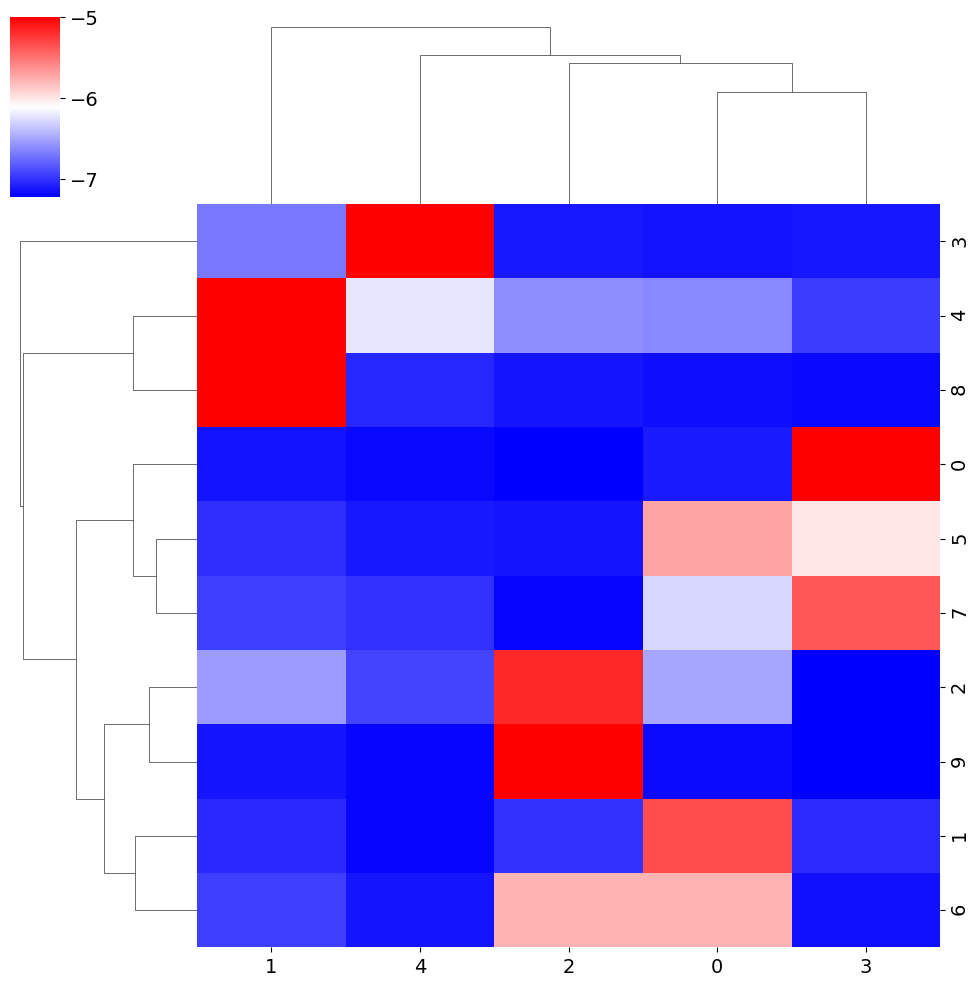

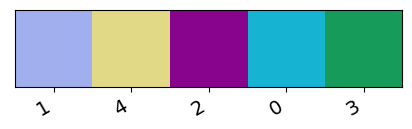

In [183]:
windows, sum_cols = tl_Create_neighborhoods(df = data,
                     n_num = n_num,
                     cluster_col = cluster_col,
                     X = X,
                     Y = Y,
                     regions = reg,
                     sum_cols = None,
                     keep_cols = None,
                     ks = [n_num])

w, k_centroids = tl_Chose_window_size(windows,
                      n_num = n_num,
                      n_neighborhoods = 10,
                      n2_name = 'neigh_ofneigh', sum_cols = sum_cols)

pl_Niche_heatmap(k_centroids, w, n_num, sum_cols)


names = cells_df2[cluster_col].unique()
colors = hf_generate_random_colors(n = len(names))

color_dic = hf_assign_colors(names, colors)

color_dic=color_dic
l=list(color_dic.keys())



plot_list = list_n = [ 0, 3, 2]

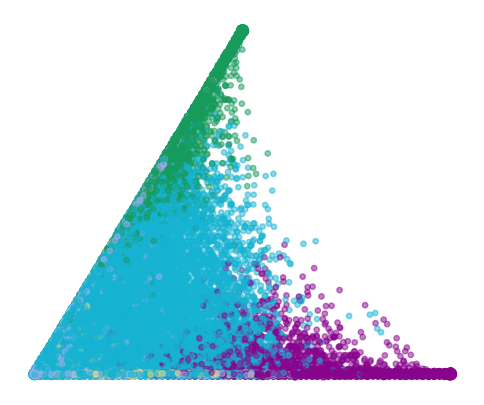

FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/homes/admin/Tim/Docker_pipeline_dokumentation/Datasets/drive-download-20230601T235403Z-001/results/d3Boxplot_cell_type_per_sample.png'

<Figure size 640x480 with 0 Axes>

In [184]:
pl_Barycentric_coordinate_projection(w, 
                                      plot_list = plot_list, 
                                      threshold = 10, 
                                      output_dir = output_dir, 
                                      save_name = save_name, 
                                      col_dic = color_dic,
                                      l = l,
                                      cluster_col = cluster_col,
                                      n_num = n_num,
                                      SMALL_SIZE = 14, 
                                      MEDIUM_SIZE = 16, 
                                      BIGGER_SIZE = 18,
                                      figsize=(6,5))


**CN combination map**

![image.png](attachment:image.png)

The graph shows differnet combinations of neightborhoods as well as
single neighborhoods. The circles indicate the size of this specific
modules and edges indicate the relationship of the individual CNs.

This is a Python function that plots a combination map of nodes and
edges using the NetworkX and Matplotlib libraries. The function takes in
a graph object called g, which is then used to calculate the positions
of each node using the graphviz_layout function from the
nx.drawing.nx_pydot module. The height variable is set to 8, which
appears to determine the vertical spacing between nodes.

The function then sets the figure size to 40x20 using figsize(40,20),
and loops through each node in the graph. For each node, the function
determines its color based on the number of incoming edges and plots a
scatter point with size determined by the value in the simp_freqs list
that corresponds to the node. If the node is in the tops list, it is
marked with an asterisk. The function then plots squares below the node
for each element in the node, with color determined by the palt
dictionary.

The function then loops through each edge in the graph and plots a line
between the two nodes, with the color and thickness of the line
determined by the number of incoming edges to the second node.

Finally, the function turns off the axis labels and displays the plot
using plt.show(). The commented-out sections appear to contain code for
adding additional information to the plot, such as profiles below each
node and highlighting specific edges, but they are not currently being
used.

6 0.04052384292398892


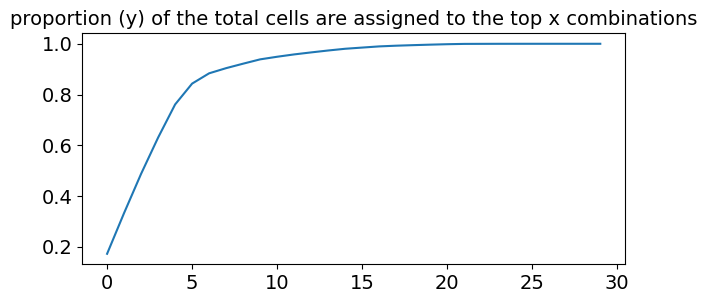

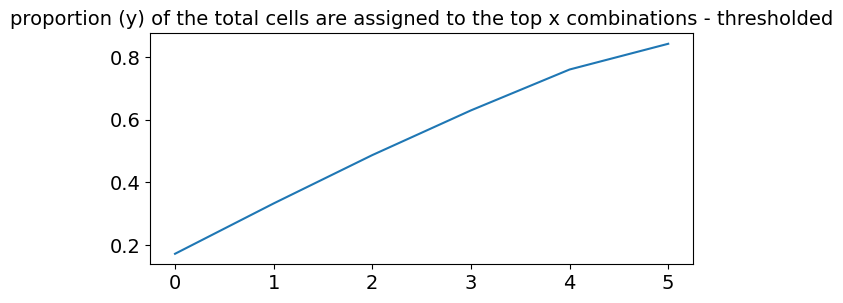

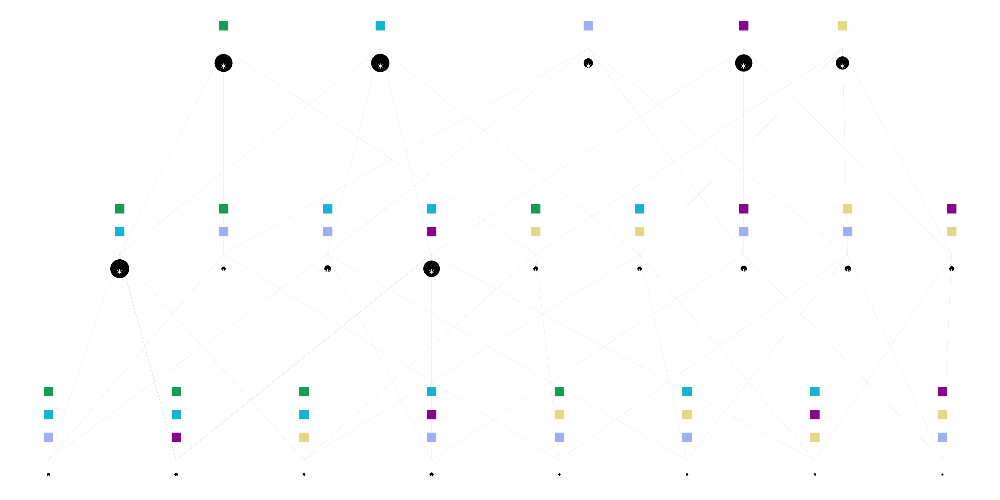

In [185]:
simps, simp_freqs, simp_sums = tl_calculate_neigh_combs(w, 
                                                     l,
                                                     n_num, 
                                                     threshold = 0.85, 
                                                     per_keep_thres = 0.85)

g, tops, e0, e1 = tl_build_graph_CN_comb_map(simp_freqs)

pl_generate_CN_comb_map(graph = g, 
                     tops = tops, 
                     e0 = e0, 
                     e1 = e1, 
                     l = l,
                     simp_freqs = simp_freqs,
                     color_dic = color_dic)

Plot CN combination map for selected neighborhoods 

FileNotFoundError: [Errno 2] No such file or directory: '/Volumes/homes/admin/Tim/Docker_pipeline_dokumentation/Datasets/drive-download-20230601T235403Z-001/results/d3All_comm_spatial_contexts.pdf'

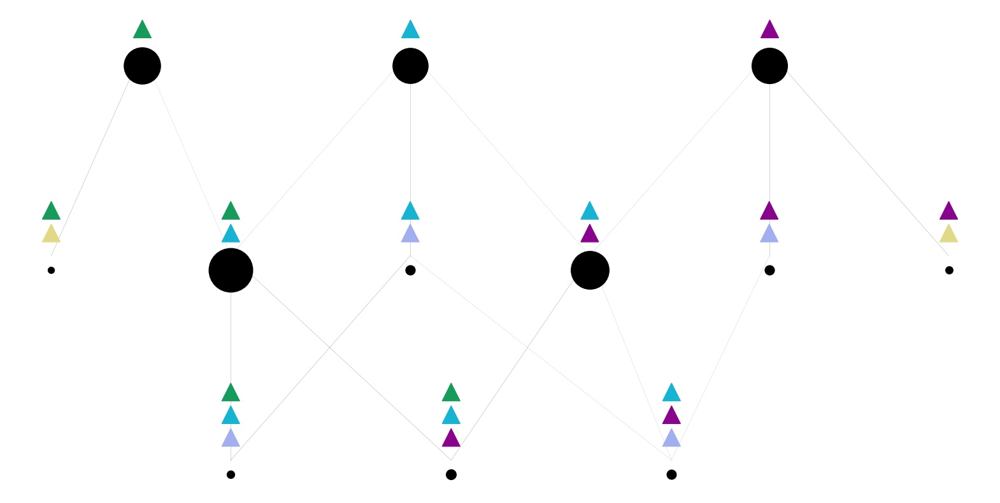

In [187]:
pl_get_network(ttl_per_thres=0.9,
            comb_per_thres=0.005,
            neigh_sub = plot_list,
            save_name='All_comm',
            save_path = output_dir,
            sub_col = cluster_col, 
            color_dic = color_dic,
            windows = windows,
            n_num = n_num,
            l = l)


### Statistics

**NOT WORKING**

In [101]:
simp_df_tissue1, simp_df_tissue2 = tl_spatial_context_stats(windows,
n_num, total_per_thres = 0.9,\
comb_per_thres = 0.005,\
tissue_column = 'region',\
subset_list = ["Resection"],\
plot_order = ['Resection','Biopsy'],\
pal_tis = {'Resection':'blue','Biopsy':'orange'},\
patient_ID_component1 = ID_component1,\
patient_ID_component2 = ID_component2,\
subset_list_tissue1 = ["Resection"],\
subset_list_tissue2 = ["Biopsy"])

print(simp_df_tissue1["combination"].values)\
print(simp_df_tissue2["combination"].values)

simp_df_tissue1 = simp_df_tissue1.set_index("combination")
simp_df_tissue2 = simp_df_tissue2.set_index("combination")

pl_spatial_context_stats_vis(neigh_comb = (9,), simp_df_tissue1 =
simp_df_tissue1, simp_df_tissue2 = simp_df_tissue2, pal_tis =
{'Resection': 'blue', 'Biopsy': 'orange'}, plot_order = ['Resection',
'Biopsy'])

SyntaxError: invalid syntax (339691454.py, line 14)

# TissUUmaps visualization

In [1]:
import os
import tissuumaps.jupyter as tj

INFO:root: * TissUUmaps version: 3.1.1.3


In [4]:
import os

def get_tif_filepaths(directory):
    tif_filepaths = []
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith('.tif'):
                tif_filepaths.append(os.path.join(root, file))
    return tif_filepaths

# Replace 'directory_path' with the actual path to your chosen directory
directory_path = '/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels'
tif_filepaths_list = get_tif_filepaths(directory_path)

# Print the list of tif filepaths
for filepath in tif_filepaths_list:
    print(filepath)

/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/Vimentin.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/MHC-I.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/CD68.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/FoxP3.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/CD15.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/CD73.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/CD138.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/GATA-3.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/bCatenin.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/PD-L1.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/Ecadherin.tif
/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/individual_channels/Podoplanin.tif
/Volumes/homes/admin/Tim/Ti

In [2]:
csv_path = "/Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/df_xy_cluster_RBT_170523_70066.csv"

Load data in TissUUmaps

Parameters
- images (list | str) – List of images or single image to display
- csvFiles (list | str) – List of csv files or single csv file to display
- xSelector (str) – Name of the csv column defining the X coordinates
- ySelector (str) – Name of the csv column defining the Y coordinates
- keySelector (str) – Name of the csv column defining the grouping key
- nameSelector (str) – Name of the csv column defining the group name
- colorSelector (str) – Name of the csv column defining the group color
- piechartSelector (str) – Name of the csv column defining pie-charts
- shapeSelector (str) – Name of the csv column defining markers’ shape
- scaleSelector (str) – Name of the csv column defining markers’ scale
- fixedShape (int) – Name of the markers’ shape
- scaleFactor (int) – Global scale of markers
- colormap (str) – Name of the colormap used if colorSelector is set
- compositeMode – (str): Composite mode used for images
- boundingBox (list) – [X,Y,W,H] of the bounding box to display
- port (int) – The port to run the TissUUmaps server
- host (str) – The host to run the TissUUmaps server
- height (int) – The height of the jupyter iframe
- tmapFilename (str) – Name of the project file that will be created
- plugins (list) – List of plugins to add to the tmap project
Returns
The TissUUmaps viewer

Return type
- TissUUmapsViewer

In [5]:
tj.loaddata(images= tif_filepaths_list, 
                            csvFiles=[csv_path], 
                            xSelector='x', 
                            ySelector='y', 
                            keySelector="leiden_0.4", 
                            nameSelector=None, 
                            colorSelector=None, 
                            piechartSelector=None, 
                            shapeSelector=None, 
                            scaleSelector=None, 
                            fixedShape=None, 
                            scaleFactor=1, 
                            colormap=None, 
                            compositeMode='source-over', 
                            boundingBox=None, 
                            port=5100, 
                            host='localhost', 
                            height=1000, 
                            tmapFilename='_project', 
                            plugins=[])

Creating project file /Volumes/homes/admin/Tim/Tissuemapstest/bestFocus/_project.tmap
Loading url:  http://localhost:5100/_project.tmap?path=Volumes/homes/admin/Tim/Tissuemapstest/bestFocus
